<a href="https://colab.research.google.com/github/Siddhi-Shrivastwa/BasketBall-Sports-Analytics/blob/main/BASKETBALL_SPORTS_ANALYTICS_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### IMPORTING LIBRARIES

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor

### IMPORTING FILES


In [ ]:
ps=pd.read_csv("player_stats.csv")
ts=pd.read_csv("nba_team_stats_00_to_21.csv")
ts

,teamstatspk,TEAM,GP,W,L,WIN%,MIN,PTS,FGM,FGA,...,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,+/-,SEASON
0,0,Phoenix Suns,52,42,10,0.808,48.1,112.7,42.7,89.4,...,46.1,26.5,13.3,8.6,4.3,4.0,19.3,19.3,7.8,2020-21
1,1,Golden State Warriors,53,40,13,0.755,48.2,110.9,40.4,86.5,...,46.5,27.5,15.6,9.4,4.9,4.1,20.3,17.7,8.3,2020-21
2,2,Memphis Grizzlies,55,37,18,0.673,48.3,112.7,42.7,93.4,...,48.6,25.1,13.3,10.1,6.4,6.4,19.1,19.0,4.1,2020-21
3,3,Miami Heat,54,34,20,0.630,48.5,108.7,39.3,85.7,...,44.6,25.9,14.9,7.6,3.3,4.4,20.5,20.0,4.2,2020-21
4,4,Chicago Bulls,53,33,20,0.623,48.1,111.6,41.6,87.0,...,43.0,24.5,13.0,7.2,4.6,5.2,18.8,17.8,1.7,2020-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
621,621,Atlanta Hawks,82,25,57,0.305,48.1,91.0,35.1,81.3,...,42.9,19.0,16.7,7.7,4.7,6.3,22.7,0.1,-5.2,2000-01
622,622,Vancouver Grizzlies,82,23,59,0.280,48.2,91.7,35.0,79.7,...,40.5,23.2,15.7,7.1,4.4,5.8,21.1,0.1,-5.7,2000-01
623,623,Washington Wizards,82,19,63,0.232,48.0,93.2,34.5,78.7,...,41.3,20.1,17.0,7.7,4.7,6.2,23.3,0.1,-6.7,2000-01
624,624,Golden State Warriors,82,17,65,0.207,48.2,92.5,35.8,87.5,...,45.5,21.8,15.9,9.0,5.0,6.0,21.1,0.1,-9.0,2000-01


In [ ]:
ps

,Rk,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Season,MVP
0,1,Mahmoud Abdul-Rauf,PG,28,SAC,31,0,17.1,3.3,8.8,...,1.0,1.2,1.9,0.5,0.0,0.6,1.0,7.3,1997-98,False
1,2,Tariq Abdul-Wahad,SG,23,SAC,59,16,16.3,2.4,6.1,...,1.2,2.0,0.9,0.6,0.2,1.1,1.4,6.4,1997-98,False
2,3,Shareef Abdur-Rahim,SF,21,VAN,82,82,36.0,8.0,16.4,...,4.3,7.1,2.6,1.1,0.9,3.1,2.5,22.3,1997-98,False
3,4,Cory Alexander,PG,24,TOT,60,22,21.6,2.9,6.7,...,2.2,2.4,3.5,1.2,0.2,1.9,1.6,8.1,1997-98,False
4,4,Cory Alexander,PG,24,SAS,37,3,13.5,1.6,3.9,...,1.1,1.3,1.9,0.7,0.1,1.3,1.4,4.5,1997-98,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14568,601,Thaddeus Young,PF,33,TOR,26,0,18.3,2.6,5.5,...,2.9,4.4,1.7,1.2,0.4,0.8,1.7,6.3,2021-22,False
14569,602,Trae Young,PG,23,ATL,76,76,34.9,9.4,20.3,...,3.1,3.7,9.7,0.9,0.1,4.0,1.7,28.4,2021-22,False
14570,603,Omer Yurtseven,C,23,MIA,56,12,12.6,2.3,4.4,...,3.7,5.3,0.9,0.3,0.4,0.7,1.5,5.3,2021-22,False
14571,604,Cody Zeller,C,29,POR,27,0,13.1,1.9,3.3,...,2.8,4.6,0.8,0.3,0.2,0.7,2.1,5.2,2021-22,False


In [ ]:
ps.columns

Index(['Rk', 'Player', 'Pos', 'Age', 'Tm', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%',
       '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'Season',
       'MVP'],
      dtype='object')

In [ ]:
games=pd.read_csv("games.csv")
games

,GAME_DATE_EST,GAME_ID,GAME_STATUS_TEXT,HOME_TEAM_ID,VISITOR_TEAM_ID,SEASON,TEAM_ID_home,PTS_home,FG_PCT_home,FT_PCT_home,...,AST_home,REB_home,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
0,2022-12-22,22200477,Final,1610612740,1610612759,2022,1610612740,126.0,0.484,0.926,...,25.0,46.0,1610612759,117.0,0.478,0.815,0.321,23.0,44.0,1
1,2022-12-22,22200478,Final,1610612762,1610612764,2022,1610612762,120.0,0.488,0.952,...,16.0,40.0,1610612764,112.0,0.561,0.765,0.333,20.0,37.0,1
2,2022-12-21,22200466,Final,1610612739,1610612749,2022,1610612739,114.0,0.482,0.786,...,22.0,37.0,1610612749,106.0,0.470,0.682,0.433,20.0,46.0,1
3,2022-12-21,22200467,Final,1610612755,1610612765,2022,1610612755,113.0,0.441,0.909,...,27.0,49.0,1610612765,93.0,0.392,0.735,0.261,15.0,46.0,1
4,2022-12-21,22200468,Final,1610612737,1610612741,2022,1610612737,108.0,0.429,1.000,...,22.0,47.0,1610612741,110.0,0.500,0.773,0.292,20.0,47.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26646,2014-10-06,11400007,Final,1610612737,1610612740,2014,1610612737,93.0,0.419,0.821,...,24.0,50.0,1610612740,87.0,0.366,0.643,0.375,17.0,43.0,1
26647,2014-10-06,11400004,Final,1610612741,1610612764,2014,1610612741,81.0,0.338,0.719,...,18.0,40.0,1610612764,85.0,0.411,0.636,0.267,17.0,47.0,0
26648,2014-10-06,11400005,Final,1610612747,1610612743,2014,1610612747,98.0,0.448,0.682,...,29.0,45.0,1610612743,95.0,0.387,0.659,0.500,19.0,43.0,1
26649,2014-10-05,11400002,Final,1610612761,1610612758,2014,1610612761,99.0,0.440,0.771,...,21.0,30.0,1610612758,94.0,0.469,0.725,0.385,18.0,45.0,1


In [ ]:
AS = pd.read_csv('all_seasons.csv')
AS

,Unnamed: 0,player_name,team_abbreviation,age,player_height,player_weight,college,country,draft_year,draft_round,...,pts,reb,ast,net_rating,oreb_pct,dreb_pct,usg_pct,ts_pct,ast_pct,season
0,0,Dennis Rodman,CHI,36.0,198.12,99.790240,Southeastern Oklahoma State,USA,1986,2,...,5.7,16.1,3.1,16.1,0.186,0.323,0.100,0.479,0.113,1996-97
1,1,Dwayne Schintzius,LAC,28.0,215.90,117.933920,Florida,USA,1990,1,...,2.3,1.5,0.3,12.3,0.078,0.151,0.175,0.430,0.048,1996-97
2,2,Earl Cureton,TOR,39.0,205.74,95.254320,Detroit Mercy,USA,1979,3,...,0.8,1.0,0.4,-2.1,0.105,0.102,0.103,0.376,0.148,1996-97
3,3,Ed O'Bannon,DAL,24.0,203.20,100.697424,UCLA,USA,1995,1,...,3.7,2.3,0.6,-8.7,0.060,0.149,0.167,0.399,0.077,1996-97
4,4,Ed Pinckney,MIA,34.0,205.74,108.862080,Villanova,USA,1985,1,...,2.4,2.4,0.2,-11.2,0.109,0.179,0.127,0.611,0.040,1996-97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12300,12300,Markieff Morris,MIA,32.0,205.74,111.130040,Kansas,USA,2011,1,...,7.6,2.6,1.4,4.5,0.059,0.089,0.197,0.547,0.116,2021-22
12301,12301,Markelle Fultz,ORL,24.0,193.04,94.800728,Washington,USA,2017,1,...,10.8,2.7,5.5,-5.3,0.010,0.116,0.265,0.517,0.448,2021-22
12302,12302,Marcus Smart,BOS,28.0,193.04,99.790240,Oklahoma State,USA,2014,1,...,12.1,3.8,5.9,9.3,0.018,0.093,0.179,0.540,0.245,2021-22
12303,12303,Marcus Garrett,MIA,23.0,195.58,92.986360,Kansas,USA,Undrafted,Undrafted,...,1.1,1.9,0.6,5.8,0.072,0.108,0.086,0.280,0.069,2021-22


In [ ]:
teams=pd.read_csv("teams.csv")
teams

,LEAGUE_ID,TEAM_ID,MIN_YEAR,MAX_YEAR,ABBREVIATION,NICKNAME,YEARFOUNDED,CITY,ARENA,ARENACAPACITY,OWNER,GENERALMANAGER,HEADCOACH,DLEAGUEAFFILIATION
0,0,1610612737,1949,2019,ATL,Hawks,1949,Atlanta,State Farm Arena,18729.0,Tony Ressler,Travis Schlenk,Lloyd Pierce,Erie Bayhawks
1,0,1610612738,1946,2019,BOS,Celtics,1946,Boston,TD Garden,18624.0,Wyc Grousbeck,Danny Ainge,Brad Stevens,Maine Red Claws
2,0,1610612740,2002,2019,NOP,Pelicans,2002,New Orleans,Smoothie King Center,NaN,Tom Benson,Trajan Langdon,Alvin Gentry,No Affiliate
3,0,1610612741,1966,2019,CHI,Bulls,1966,Chicago,United Center,21711.0,Jerry Reinsdorf,Gar Forman,Jim Boylen,Windy City Bulls
4,0,1610612742,1980,2019,DAL,Mavericks,1980,Dallas,American Airlines Center,19200.0,Mark Cuban,Donnie Nelson,Rick Carlisle,Texas Legends
5,0,1610612743,1976,2019,DEN,Nuggets,1976,Denver,Pepsi Center,19099.0,Stan Kroenke,Tim Connelly,Michael Malone,No Affiliate
6,0,1610612745,1967,2019,HOU,Rockets,1967,Houston,Toyota Center,18104.0,Tilman Fertitta,Daryl Morey,Mike D'Antoni,Rio Grande Valley Vipers
7,0,1610612746,1970,2019,LAC,Clippers,1970,Los Angeles,Staples Center,19060.0,Steve Ballmer,Michael Winger,Doc Rivers,Agua Caliente Clippers of Ontario
8,0,1610612747,1948,2019,LAL,Lakers,1948,Los Angeles,Staples Center,19060.0,Jerry Buss Family Trust,Rob Pelinka,Frank Vogel,South Bay Lakers
9,0,1610612748,1988,2019,MIA,Heat,1988,Miami,AmericanAirlines Arena,19600.0,Micky Arison,Pat Riley,Erik Spoelstra,Sioux Falls Skyforce


In [ ]:
players=pd.read_csv("players.csv")
players

,PLAYER_NAME,TEAM_ID,PLAYER_ID,SEASON
0,Royce O'Neale,1610612762,1626220,2019
1,Bojan Bogdanovic,1610612762,202711,2019
2,Rudy Gobert,1610612762,203497,2019
3,Donovan Mitchell,1610612762,1628378,2019
4,Mike Conley,1610612762,201144,2019
...,...,...,...,...
7223,Lanny Smith,1610612758,201831,2009
7224,Warren Carter,1610612752,201999,2009
7225,Bennet Davis,1610612751,201834,2009
7226,Brian Hamilton,1610612751,201646,2009


In [ ]:
game_details_df= pd.read_csv('games_details.csv')
game_details_df

C:\Users\tanis\AppData\Local\Temp\ipykernel_14740\4115334782.py:1: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  game_details_df= pd.read_csv('games_details.csv')


,GAME_ID,TEAM_ID,TEAM_ABBREVIATION,TEAM_CITY,PLAYER_ID,PLAYER_NAME,NICKNAME,START_POSITION,COMMENT,MIN,...,OREB,DREB,REB,AST,STL,BLK,TO,PF,PTS,PLUS_MINUS
0,22200477,1610612759,SAS,San Antonio,1629641,Romeo Langford,Romeo,F,NaN,18:06,...,1.0,1.0,2.0,0.0,1.0,0.0,2.0,5.0,2.0,-2.0
1,22200477,1610612759,SAS,San Antonio,1631110,Jeremy Sochan,Jeremy,F,NaN,31:01,...,6.0,3.0,9.0,6.0,1.0,0.0,2.0,1.0,23.0,-14.0
2,22200477,1610612759,SAS,San Antonio,1627751,Jakob Poeltl,Jakob,C,NaN,21:42,...,1.0,3.0,4.0,1.0,1.0,0.0,2.0,4.0,13.0,-4.0
3,22200477,1610612759,SAS,San Antonio,1630170,Devin Vassell,Devin,G,NaN,30:20,...,0.0,9.0,9.0,5.0,3.0,0.0,2.0,1.0,10.0,-18.0
4,22200477,1610612759,SAS,San Antonio,1630200,Tre Jones,Tre,G,NaN,27:44,...,0.0,2.0,2.0,3.0,0.0,0.0,2.0,2.0,19.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
668623,11200005,1610612743,DEN,Denver,202706,Jordan Hamilton,NaN,NaN,NaN,19,...,0.0,2.0,2.0,0.0,2.0,0.0,1.0,3.0,17.0,NaN
668624,11200005,1610612743,DEN,Denver,202702,Kenneth Faried,NaN,NaN,NaN,23,...,1.0,0.0,1.0,1.0,1.0,0.0,3.0,3.0,18.0,NaN
668625,11200005,1610612743,DEN,Denver,201585,Kosta Koufos,NaN,NaN,NaN,15,...,3.0,5.0,8.0,0.0,1.0,0.0,0.0,3.0,6.0,NaN
668626,11200005,1610612743,DEN,Denver,202389,Timofey Mozgov,NaN,NaN,NaN,19,...,1.0,2.0,3.0,1.0,0.0,0.0,4.0,2.0,2.0,NaN


In [ ]:
names=ps.columns
print(names)

Index(['Rk', 'Player', 'Pos', 'Age', 'Tm', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%',
       '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'Season',
       'MVP'],
      dtype='object')


In [ ]:
ts.columns

Index(['teamstatspk', 'TEAM', 'GP', 'W', 'L', 'WIN%', 'MIN', 'PTS', 'FGM',
       'FGA', 'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB',
       'REB', 'AST', 'TOV', 'STL', 'BLK', 'BLKA', 'PF', 'PFD', '+/-',
       'SEASON'],
      dtype='object')

In [ ]:
# Dictionary mapping full team names to NBA abbreviations
abb = {
    "Atlanta Hawks": "ATL",
    "Boston Celtics": "BOS",
    "Brooklyn Nets": "BKN",
    "Charlotte Bobcats": "CHA",
    "Charlotte Hornets": "CHA",
    "Chicago Bulls": "CHI",
    "Cleveland Cavaliers": "CLE",
    "Dallas Mavericks": "DAL",
    "Denver Nuggets": "DEN",
    "Detroit Pistons": "DET",
    "Golden State Warriors": "GSW",
    "Houston Rockets": "HOU",
    "Indiana Pacers": "IND",
    "LA Clippers": "LAC",
    "Los Angeles Clippers": "LAC",
    "Los Angeles Lakers": "LAL",
    "Memphis Grizzlies": "MEM",
    "Miami Heat": "MIA",
    "Milwaukee Bucks": "MIL",
    "Minnesota Timberwolves": "MIN",
    "New Jersey Nets": "NJN",
    "New Orleans Hornets": "NOH",
    "New Orleans/Oklahoma City Hornets": "NOH",
    "New Orleans Pelicans": "NOP",
    "New York Knicks": "NYK",
    "Oklahoma City Thunder": "OKC",
    "Orlando Magic": "ORL",
    "Philadelphia 76ers": "PHI",
    "Phoenix Suns": "PHX",
    "Portland Trail Blazers": "POR",
    "Sacramento Kings": "SAC",
    "San Antonio Spurs": "SAS",
    "Seattle SuperSonics": "SEA",
    "Toronto Raptors": "TOR",
    "Utah Jazz": "UTA",
    "Vancouver Grizzlies": "VAN",
    "Washington Wizards": "WAS"
}

# Example usage for Team Stats dataset
ts['TEAM'] = ts['TEAM'].map(abb)


In [ ]:
ts

,teamstatspk,TEAM,GP,W,L,WIN%,MIN,PTS,FGM,FGA,...,REB,AST,TOV,STL,BLK,BLKA,PF,PFD,+/-,SEASON
0,0,PHX,52,42,10,0.808,48.1,112.7,42.7,89.4,...,46.1,26.5,13.3,8.6,4.3,4.0,19.3,19.3,7.8,2020-21
1,1,GSW,53,40,13,0.755,48.2,110.9,40.4,86.5,...,46.5,27.5,15.6,9.4,4.9,4.1,20.3,17.7,8.3,2020-21
2,2,MEM,55,37,18,0.673,48.3,112.7,42.7,93.4,...,48.6,25.1,13.3,10.1,6.4,6.4,19.1,19.0,4.1,2020-21
3,3,MIA,54,34,20,0.630,48.5,108.7,39.3,85.7,...,44.6,25.9,14.9,7.6,3.3,4.4,20.5,20.0,4.2,2020-21
4,4,CHI,53,33,20,0.623,48.1,111.6,41.6,87.0,...,43.0,24.5,13.0,7.2,4.6,5.2,18.8,17.8,1.7,2020-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
621,621,ATL,82,25,57,0.305,48.1,91.0,35.1,81.3,...,42.9,19.0,16.7,7.7,4.7,6.3,22.7,0.1,-5.2,2000-01
622,622,VAN,82,23,59,0.280,48.2,91.7,35.0,79.7,...,40.5,23.2,15.7,7.1,4.4,5.8,21.1,0.1,-5.7,2000-01
623,623,WAS,82,19,63,0.232,48.0,93.2,34.5,78.7,...,41.3,20.1,17.0,7.7,4.7,6.2,23.3,0.1,-6.7,2000-01
624,624,GSW,82,17,65,0.207,48.2,92.5,35.8,87.5,...,45.5,21.8,15.9,9.0,5.0,6.0,21.1,0.1,-9.0,2000-01


## PER (PLAYER EFFICIENCY RATING)

In [ ]:
# Assuming you have loaded your player statistics into a DataFrame called 'player_stats_df'
# The DataFrame should contain columns like 'PTS', 'TRB' (total rebounds), 'AST', 'STL' (steals),
# 'BLK' (blocks), 'TOV' (turnovers), 'FGA' (field goals attempted), 'FTA' (free throws attempted),
# 'FTM' (free throws made), 'MP' (minutes played), and 'G' (games played).

# Replace NaN values with 0 in columns that may have missing data
cols_with_nan = ['PTS', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'FGA', 'FTA', 'FT', 'MP', 'G']
ps[cols_with_nan] = ps[cols_with_nan].fillna(0)

In [ ]:
# Calculate the components for PER
FG = ps['FG']  # Field Goals Made
FGA = ps['FGA']  # Field Goals Attempted
FT = ps['FT']  # Free Throws Made
FTA = ps['FTA']  # Free Throws Attempted
ORB = ps['ORB']  # Offensive Rebounds
DRB = ps['DRB']  # Defensive Rebounds
TOV = ps['TOV']  # Turnovers
AST = ps['AST']  # Assists
STL = ps['STL']  # Steals
BLK = ps['BLK']  # Blocks
PF = ps['PF']  # Personal Fouls
ps

,Rk,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,...,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Season,MVP
0,1,Mahmoud Abdul-Rauf,PG,28,SAC,31,0,17.1,3.3,8.8,...,1.0,1.2,1.9,0.5,0.0,0.6,1.0,7.3,1997-98,False
1,2,Tariq Abdul-Wahad,SG,23,SAC,59,16,16.3,2.4,6.1,...,1.2,2.0,0.9,0.6,0.2,1.1,1.4,6.4,1997-98,False
2,3,Shareef Abdur-Rahim,SF,21,VAN,82,82,36.0,8.0,16.4,...,4.3,7.1,2.6,1.1,0.9,3.1,2.5,22.3,1997-98,False
3,4,Cory Alexander,PG,24,TOT,60,22,21.6,2.9,6.7,...,2.2,2.4,3.5,1.2,0.2,1.9,1.6,8.1,1997-98,False
4,4,Cory Alexander,PG,24,SAS,37,3,13.5,1.6,3.9,...,1.1,1.3,1.9,0.7,0.1,1.3,1.4,4.5,1997-98,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14568,601,Thaddeus Young,PF,33,TOR,26,0,18.3,2.6,5.5,...,2.9,4.4,1.7,1.2,0.4,0.8,1.7,6.3,2021-22,False
14569,602,Trae Young,PG,23,ATL,76,76,34.9,9.4,20.3,...,3.1,3.7,9.7,0.9,0.1,4.0,1.7,28.4,2021-22,False
14570,603,Omer Yurtseven,C,23,MIA,56,12,12.6,2.3,4.4,...,3.7,5.3,0.9,0.3,0.4,0.7,1.5,5.3,2021-22,False
14571,604,Cody Zeller,C,29,POR,27,0,13.1,1.9,3.3,...,2.8,4.6,0.8,0.3,0.2,0.7,2.1,5.2,2021-22,False


In [ ]:
ps['PER']= (ps['FG']*85.910+
            ps['STL']*53.897+
            ps['3P']*51.757+
            ps['FT']*46.845+
            ps['BLK']*39.190+
            ps['ORB']*39.190+
            ps['AST']*34.677+
            ps['DRB']*14.707-
            ps['PF']*17.174-
            (ps['FTA']-ps['FT'])*20.091-
            (ps['FGA']-ps['FG'])*39.190-
            ps['TOV']*53.897)/ps['MP']
ps

,Rk,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,...,TRB,AST,STL,BLK,TOV,PF,PTS,Season,MVP,PER
0,1,Mahmoud Abdul-Rauf,PG,28,SAC,31,0,17.1,3.3,8.8,...,1.2,1.9,0.5,0.0,0.6,1.0,7.3,1997-98,False,9.801140
1,2,Tariq Abdul-Wahad,SG,23,SAC,59,16,16.3,2.4,6.1,...,2.0,0.9,0.6,0.2,1.1,1.4,6.4,1997-98,False,9.264577
2,3,Shareef Abdur-Rahim,SF,21,VAN,82,82,36.0,8.0,16.4,...,7.1,2.6,1.1,0.9,3.1,2.5,22.3,1997-98,False,21.469033
3,4,Cory Alexander,PG,24,TOT,60,22,21.6,2.9,6.7,...,2.4,3.5,1.2,0.2,1.9,1.6,8.1,1997-98,False,14.728028
4,4,Cory Alexander,PG,24,SAS,37,3,13.5,1.6,3.9,...,1.3,1.9,0.7,0.1,1.3,1.4,4.5,1997-98,False,10.177844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14568,601,Thaddeus Young,PF,33,TOR,26,0,18.3,2.6,5.5,...,4.4,1.7,1.2,0.4,0.8,1.7,6.3,2021-22,False,17.909678
14569,602,Trae Young,PG,23,ATL,76,76,34.9,9.4,20.3,...,3.7,9.7,0.9,0.1,4.0,1.7,28.4,2021-22,False,30.171264
14570,603,Omer Yurtseven,C,23,MIA,56,12,12.6,2.3,4.4,...,5.3,0.9,0.3,0.4,0.7,1.5,5.3,2021-22,False,20.064722
14571,604,Cody Zeller,C,29,POR,27,0,13.1,1.9,3.3,...,4.6,0.8,0.3,0.2,0.7,2.1,5.2,2021-22,False,19.809588


In [ ]:
ps2=ps[ps['PER'] < 40]
ps2

,Rk,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,...,TRB,AST,STL,BLK,TOV,PF,PTS,Season,MVP,PER
0,1,Mahmoud Abdul-Rauf,PG,28,SAC,31,0,17.1,3.3,8.8,...,1.2,1.9,0.5,0.0,0.6,1.0,7.3,1997-98,False,9.801140
1,2,Tariq Abdul-Wahad,SG,23,SAC,59,16,16.3,2.4,6.1,...,2.0,0.9,0.6,0.2,1.1,1.4,6.4,1997-98,False,9.264577
2,3,Shareef Abdur-Rahim,SF,21,VAN,82,82,36.0,8.0,16.4,...,7.1,2.6,1.1,0.9,3.1,2.5,22.3,1997-98,False,21.469033
3,4,Cory Alexander,PG,24,TOT,60,22,21.6,2.9,6.7,...,2.4,3.5,1.2,0.2,1.9,1.6,8.1,1997-98,False,14.728028
4,4,Cory Alexander,PG,24,SAS,37,3,13.5,1.6,3.9,...,1.3,1.9,0.7,0.1,1.3,1.4,4.5,1997-98,False,10.177844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14568,601,Thaddeus Young,PF,33,TOR,26,0,18.3,2.6,5.5,...,4.4,1.7,1.2,0.4,0.8,1.7,6.3,2021-22,False,17.909678
14569,602,Trae Young,PG,23,ATL,76,76,34.9,9.4,20.3,...,3.7,9.7,0.9,0.1,4.0,1.7,28.4,2021-22,False,30.171264
14570,603,Omer Yurtseven,C,23,MIA,56,12,12.6,2.3,4.4,...,5.3,0.9,0.3,0.4,0.7,1.5,5.3,2021-22,False,20.064722
14571,604,Cody Zeller,C,29,POR,27,0,13.1,1.9,3.3,...,4.6,0.8,0.3,0.2,0.7,2.1,5.2,2021-22,False,19.809588


                      Player        PER
10462          Briante Weber  39.373333
5873            Calvin Booth  39.190000
12575         Jamal Crawford  38.675667
12444  Giannis Antetokounmpo  38.595109
14152           Nikola Jokić  38.479528
11353           Vince Hunter  38.182222
12404          Alan Williams  38.149462
13785  Giannis Antetokounmpo  37.844672
11640         David Stockton  37.388433
11320            Nigel Hayes  36.906167


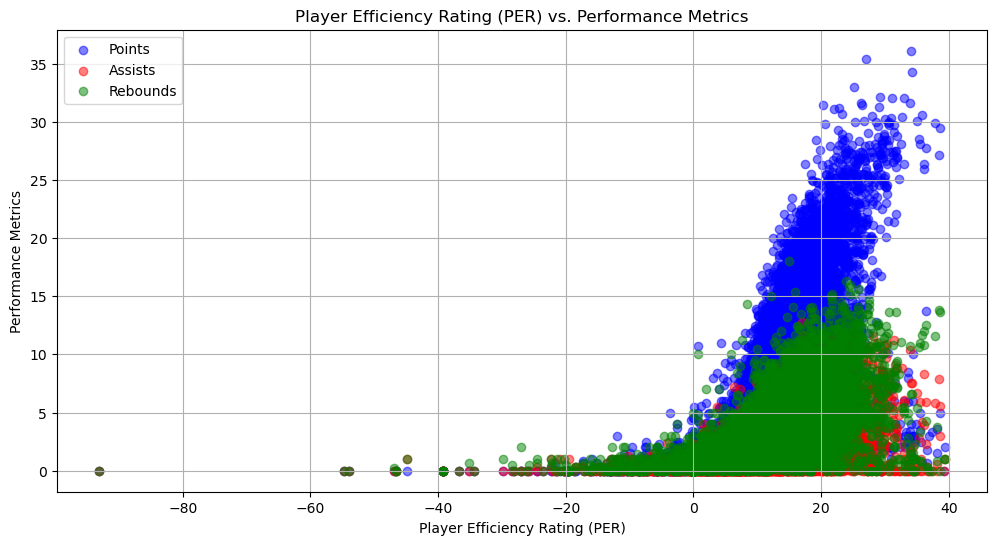

In [ ]:
top_players = ps2.nlargest(10, 'PER')  # Get top 10 players by PER
print(top_players[['Player', 'PER']])


plt.figure(figsize=(12, 6))

# Create a scatter plot between PER and Points
plt.scatter(ps2['PER'], ps2['PTS'], alpha=0.5, color='b', label='Points')

# Create a scatter plot between PER and Assists
plt.scatter(ps2['PER'], ps2['AST'], alpha=0.5, color='r', label='Assists')

# Create a scatter plot between PER and Rebounds
plt.scatter(ps2['PER'], ps2['TRB'], alpha=0.5, color='g', label='Rebounds')

plt.title('Player Efficiency Rating (PER) vs. Performance Metrics')
plt.xlabel('Player Efficiency Rating (PER)')
plt.ylabel('Performance Metrics')
plt.legend()
plt.grid()
plt.show()

## BPM (BOX PLUS MINUS)

In [ ]:
ps['BPM']= (ps['3P']+
              ps['2P']+
              ps['AST']+
              ps['STL']+
              ps['BLK']+
              ps['DRB']+
              ps['ORB']*0.5-
              ps['FGA']-
              ps['FTA']-
              ps['TOV'])/ps['MP']
ps

,Rk,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,...,AST,STL,BLK,TOV,PF,PTS,Season,MVP,PER,BPM
0,1,Mahmoud Abdul-Rauf,PG,28,SAC,31,0,17.1,3.3,8.8,...,1.9,0.5,0.0,0.6,1.0,7.3,1997-98,False,9.801140,-0.175439
1,2,Tariq Abdul-Wahad,SG,23,SAC,59,16,16.3,2.4,6.1,...,0.9,0.6,0.2,1.1,1.4,6.4,1997-98,False,9.264577,-0.217791
2,3,Shareef Abdur-Rahim,SF,21,VAN,82,82,36.0,8.0,16.4,...,2.6,1.1,0.9,3.1,2.5,22.3,1997-98,False,21.469033,-0.250000
3,4,Cory Alexander,PG,24,TOT,60,22,21.6,2.9,6.7,...,3.5,1.2,0.2,1.9,1.6,8.1,1997-98,False,14.728028,-0.006944
4,4,Cory Alexander,PG,24,SAS,37,3,13.5,1.6,3.9,...,1.9,0.7,0.1,1.3,1.4,4.5,1997-98,False,10.177844,-0.051852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14568,601,Thaddeus Young,PF,33,TOR,26,0,18.3,2.6,5.5,...,1.7,1.2,0.4,0.8,1.7,6.3,2021-22,False,17.909678,0.122951
14569,602,Trae Young,PG,23,ATL,76,76,34.9,9.4,20.3,...,9.7,0.9,0.1,4.0,1.7,28.4,2021-22,False,30.171264,-0.230659
14570,603,Omer Yurtseven,C,23,MIA,56,12,12.6,2.3,4.4,...,0.9,0.3,0.4,0.7,1.5,5.3,2021-22,False,20.064722,0.170635
14571,604,Cody Zeller,C,29,POR,27,0,13.1,1.9,3.3,...,0.8,0.3,0.2,0.7,2.1,5.2,2021-22,False,19.809588,0.087786


In [ ]:
count=0
unique_seasons = ps['Season'].unique()
for i in unique_seasons:
    count+=1
print("Unique seasons:", unique_seasons)
count


Unique seasons: ['1997-98' '1998-99' '1999-00' '2000-01' '2001-02' '2002-03' '2003-04'
 '2004-05' '2005-06' '2006-07' '2007-08' '2008-09' '2009-10' '2010-11'
 '2011-12' '2012-13' '2013-14' '2014-15' '2015-16' '2016-17' '2017-18'
 '2018-19' '2019-20' '2020-21' '2021-22']


25

## EXPLORATORY DATA ANALYSIS

In [ ]:
# Assuming you have a player_stats DataFrame with relevant columns
#like 'PPG', 'APG', 'RPG', 'FG%', '3P%', 'FT%', and 'Player_Rating'.

# Step 1: Exploratory Data Analysis (EDA)
# Summary statistics of the data
print(ps.describe())


                 Rk           Age             G            GS            MP  \
count  14573.000000  14573.000000  14573.000000  14573.000000  14573.000000   
mean     244.332876     26.705483     45.544500     21.565429     19.623626   
std      139.596859      4.252495     26.110389     27.035594      9.957188   
min        1.000000     18.000000      1.000000      0.000000      0.000000   
25%      124.000000     23.000000     22.000000      0.000000     11.400000   
50%      243.000000     26.000000     48.000000      7.000000     18.900000   
75%      361.000000     30.000000     70.000000     39.000000     27.700000   
max      605.000000     44.000000     85.000000     83.000000     43.700000   

                 FG           FGA           FG%            3P           3PA  \
count  14573.000000  14573.000000  14485.000000  14573.000000  14573.000000   
mean       2.932046      6.598586      0.432377      0.590894      1.703637   
std        2.133970      4.541544      0.104592    

In [ ]:
df = pd.merge(ts, teams[['ABBREVIATION','TEAM_ID', 'HEADCOACH']], left_on='TEAM', right_on='ABBREVIATION', how='right')
df.drop(columns=['ABBREVIATION'], inplace=True)
df

,teamstatspk,TEAM,GP,W,L,WIN%,MIN,PTS,FGM,FGA,...,BLK,BLKA,PF,PFD,+/-,SEASON,Win_Percentage,On-Off Plus-Minus,TEAM_ID,HEADCOACH
0,18,ATL,53,25,28,0.472,48.0,111.5,40.8,87.5,...,4.3,4.5,18.3,20.2,0.1,2020-21,0.471698,-0.020833,1610612737,Lloyd Pierce
1,56,ATL,67,20,47,0.299,48.6,111.8,40.6,90.6,...,5.1,6.4,23.1,21.0,-8.0,2019-20,0.298507,0.000000,1610612737,Lloyd Pierce
2,85,ATL,82,29,53,0.354,48.4,113.3,41.4,91.8,...,5.1,5.5,23.6,22.2,-6.0,2018-19,0.353659,-0.061983,1610612737,Lloyd Pierce
3,116,ATL,82,24,58,0.293,48.1,103.4,38.2,85.5,...,4.2,5.5,19.6,20.3,-5.5,2017-18,0.292683,-0.020790,1610612737,Lloyd Pierce
4,130,ATL,82,43,39,0.524,48.5,103.2,38.1,84.4,...,4.8,5.2,18.2,21.6,-0.9,2016-17,0.524390,-0.082474,1610612737,Lloyd Pierce
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,500,GSW,82,34,48,0.415,48.5,98.7,36.9,85.8,...,5.1,5.1,22.4,0.0,-2.2,2004-05,0.414634,-0.041237,1610612744,Steve Kerr
590,527,GSW,82,37,45,0.451,48.4,93.3,35.1,79.4,...,4.7,5.1,20.6,0.0,-0.7,2003-04,0.451220,-0.041322,1610612744,Steve Kerr
591,557,GSW,82,38,44,0.463,48.2,102.4,37.3,84.6,...,6.2,6.0,21.8,0.0,-1.1,2002-03,0.463415,-0.041494,1610612744,Steve Kerr
592,596,GSW,82,21,61,0.256,48.2,97.7,36.6,85.2,...,6.4,6.3,23.0,0.2,-5.4,2001-02,0.256098,0.000000,1610612744,Steve Kerr


In [ ]:
df.columns

Index(['teamstatspk', 'TEAM', 'GP', 'W', 'L', 'WIN%', 'MIN', 'PTS', 'FGM',
       'FGA', 'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB',
       'REB', 'AST', 'TOV', 'STL', 'BLK', 'BLKA', 'PF', 'PFD', '+/-', 'SEASON',
       'Win_Percentage', 'On-Off Plus-Minus', 'TEAM_ID', 'HEADCOACH'],
      dtype='object')

In [ ]:
df.loc[df['TEAM']=='ATL']

,teamstatspk,TEAM,GP,W,L,WIN%,MIN,PTS,FGM,FGA,...,BLK,BLKA,PF,PFD,+/-,SEASON,Win_Percentage,On-Off Plus-Minus,TEAM_ID,HEADCOACH
0,18,ATL,53,25,28,0.472,48.0,111.5,40.8,87.5,...,4.3,4.5,18.3,20.2,0.1,2020-21,0.471698,-0.020833,1610612737,Lloyd Pierce
1,56,ATL,67,20,47,0.299,48.6,111.8,40.6,90.6,...,5.1,6.4,23.1,21.0,-8.0,2019-20,0.298507,0.000000,1610612737,Lloyd Pierce
2,85,ATL,82,29,53,0.354,48.4,113.3,41.4,91.8,...,5.1,5.5,23.6,22.2,-6.0,2018-19,0.353659,-0.061983,1610612737,Lloyd Pierce
3,116,ATL,82,24,58,0.293,48.1,103.4,38.2,85.5,...,4.2,5.5,19.6,20.3,-5.5,2017-18,0.292683,-0.020790,1610612737,Lloyd Pierce
4,130,ATL,82,43,39,0.524,48.5,103.2,38.1,84.4,...,4.8,5.2,18.2,21.6,-0.9,2016-17,0.524390,-0.082474,1610612737,Lloyd Pierce
5,156,ATL,82,48,34,0.585,48.4,102.8,38.6,84.4,...,5.9,5.0,19.1,18.3,3.6,2015-16,0.585366,-0.103306,1610612737,Lloyd Pierce
6,181,ATL,82,60,22,0.732,48.1,102.5,38.1,81.7,...,4.6,4.9,17.8,19.6,5.4,2014-15,0.731707,-0.145530,1610612737,Lloyd Pierce
7,227,ATL,82,38,44,0.463,48.4,101.0,37.3,81.6,...,4.0,4.3,19.2,20.0,-0.5,2013-14,0.463415,-0.041322,1610612737,Lloyd Pierce
8,253,ATL,82,44,38,0.537,48.4,98.0,37.6,81.0,...,4.5,4.3,18.0,18.8,0.4,2012-13,0.536585,-0.020661,1610612737,Lloyd Pierce
9,277,ATL,66,40,26,0.606,49.0,96.6,36.8,81.0,...,4.6,4.7,17.8,19.1,3.4,2011-12,0.606061,-0.020408,1610612737,Lloyd Pierce


In [ ]:
games21 = games[games['SEASON'] <= 2021]
games21

,GAME_DATE_EST,GAME_ID,GAME_STATUS_TEXT,HOME_TEAM_ID,VISITOR_TEAM_ID,SEASON,TEAM_ID_home,PTS_home,FG_PCT_home,FT_PCT_home,...,AST_home,REB_home,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
542,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,27.0,41.0,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0
543,2022-06-13,42100405,Final,1610612744,1610612738,2021,1610612744,104.0,0.466,0.867,...,23.0,39.0,1610612738,94.0,0.413,0.677,0.344,18.0,47.0,1
544,2022-06-10,42100404,Final,1610612738,1610612744,2021,1610612738,97.0,0.400,0.737,...,22.0,42.0,1610612744,107.0,0.440,0.800,0.349,20.0,55.0,0
545,2022-06-08,42100403,Final,1610612738,1610612744,2021,1610612738,116.0,0.483,0.708,...,28.0,47.0,1610612744,100.0,0.462,0.867,0.375,22.0,31.0,1
546,2022-06-05,42100402,Final,1610612744,1610612738,2021,1610612744,107.0,0.453,0.700,...,25.0,42.0,1610612738,88.0,0.375,0.765,0.405,24.0,43.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26646,2014-10-06,11400007,Final,1610612737,1610612740,2014,1610612737,93.0,0.419,0.821,...,24.0,50.0,1610612740,87.0,0.366,0.643,0.375,17.0,43.0,1
26647,2014-10-06,11400004,Final,1610612741,1610612764,2014,1610612741,81.0,0.338,0.719,...,18.0,40.0,1610612764,85.0,0.411,0.636,0.267,17.0,47.0,0
26648,2014-10-06,11400005,Final,1610612747,1610612743,2014,1610612747,98.0,0.448,0.682,...,29.0,45.0,1610612743,95.0,0.387,0.659,0.500,19.0,43.0,1
26649,2014-10-05,11400002,Final,1610612761,1610612758,2014,1610612761,99.0,0.440,0.771,...,21.0,30.0,1610612758,94.0,0.469,0.725,0.385,18.0,45.0,1


games21.columns

In [ ]:
games_with_home = pd.merge(games21, df[['TEAM_ID', 'TEAM', 'HEADCOACH']],
                                left_on='HOME_TEAM_ID', right_on='TEAM_ID', how='left')
games_with_home

,GAME_DATE_EST,GAME_ID,GAME_STATUS_TEXT,HOME_TEAM_ID,VISITOR_TEAM_ID,SEASON,TEAM_ID_home,PTS_home,FG_PCT_home,FT_PCT_home,...,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS,TEAM_ID,TEAM,HEADCOACH
0,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,103.0,0.413,1.000,0.413,27.0,44.0,0,1610612738,BOS,Brad Stevens
1,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,103.0,0.413,1.000,0.413,27.0,44.0,0,1610612738,BOS,Brad Stevens
2,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,103.0,0.413,1.000,0.413,27.0,44.0,0,1610612738,BOS,Brad Stevens
3,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,103.0,0.413,1.000,0.413,27.0,44.0,0,1610612738,BOS,Brad Stevens
4,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,103.0,0.413,1.000,0.413,27.0,44.0,0,1610612738,BOS,Brad Stevens
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517703,2014-10-04,11400001,Final,1610612748,1610612740,2014,1610612748,86.0,0.431,0.679,...,98.0,0.462,0.706,0.438,19.0,42.0,0,1610612748,MIA,Erik Spoelstra
517704,2014-10-04,11400001,Final,1610612748,1610612740,2014,1610612748,86.0,0.431,0.679,...,98.0,0.462,0.706,0.438,19.0,42.0,0,1610612748,MIA,Erik Spoelstra
517705,2014-10-04,11400001,Final,1610612748,1610612740,2014,1610612748,86.0,0.431,0.679,...,98.0,0.462,0.706,0.438,19.0,42.0,0,1610612748,MIA,Erik Spoelstra
517706,2014-10-04,11400001,Final,1610612748,1610612740,2014,1610612748,86.0,0.431,0.679,...,98.0,0.462,0.706,0.438,19.0,42.0,0,1610612748,MIA,Erik Spoelstra


In [ ]:
games_with_info = pd.merge(games_with_home, df[['TEAM_ID', 'TEAM', 'HEADCOACH']],
                                left_on='VISITOR_TEAM_ID', right_on='TEAM_ID', how='left')
games_with_info

,GAME_DATE_EST,GAME_ID,GAME_STATUS_TEXT,HOME_TEAM_ID,VISITOR_TEAM_ID,SEASON,TEAM_ID_home,PTS_home,FG_PCT_home,FT_PCT_home,...,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS,TEAM_ID_x,TEAM_x,HEADCOACH_x,TEAM_ID_y,TEAM_y,HEADCOACH_y
0,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,0.413,27.0,44.0,0,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr
1,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,0.413,27.0,44.0,0,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr
2,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,0.413,27.0,44.0,0,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr
3,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,0.413,27.0,44.0,0,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr
4,2022-06-16,42100406,Final,1610612738,1610612744,2021,1610612738,90.0,0.425,0.917,...,0.413,27.0,44.0,0,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10243984,2014-10-04,11400001,Final,1610612748,1610612740,2014,1610612748,86.0,0.431,0.679,...,0.438,19.0,42.0,0,1610612748,MIA,Erik Spoelstra,1610612740,NOP,Alvin Gentry
10243985,2014-10-04,11400001,Final,1610612748,1610612740,2014,1610612748,86.0,0.431,0.679,...,0.438,19.0,42.0,0,1610612748,MIA,Erik Spoelstra,1610612740,NOP,Alvin Gentry
10243986,2014-10-04,11400001,Final,1610612748,1610612740,2014,1610612748,86.0,0.431,0.679,...,0.438,19.0,42.0,0,1610612748,MIA,Erik Spoelstra,1610612740,NOP,Alvin Gentry
10243987,2014-10-04,11400001,Final,1610612748,1610612740,2014,1610612748,86.0,0.431,0.679,...,0.438,19.0,42.0,0,1610612748,MIA,Erik Spoelstra,1610612740,NOP,Alvin Gentry


In [ ]:
result= games_with_info.loc[:,['GAME_DATE_EST', 'GAME_ID', 'SEASON','HOME_TEAM_ID', 'TEAM_x', 'HEADCOACH_x','VISITOR_TEAM_ID',
                               'TEAM_y', 'HEADCOACH_y','PTS_home', 'FG_PCT_home','FT_PCT_home', 'FG3_PCT_home', 'AST_home', 'REB_home',
                               'TEAM_ID_away','PTS_away', 'FG_PCT_away', 'FT_PCT_away', 'FG3_PCT_away', 'AST_away','REB_away', 'HOME_TEAM_WINS']]

result.rename(columns={'TEAM_x': 'HOME_TEAM_NAME', 'HEADCOACH_x': 'HOME_TEAM_COACH',
                          'TEAM_y': 'VISITOR_TEAM_NAME', 'HEADCOACH_y': 'VISITOR_TEAM_COACH'},
                 inplace=True)

result

,GAME_DATE_EST,GAME_ID,SEASON,HOME_TEAM_ID,HOME_TEAM_NAME,HOME_TEAM_COACH,VISITOR_TEAM_ID,VISITOR_TEAM_NAME,VISITOR_TEAM_COACH,PTS_home,...,AST_home,REB_home,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
0,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,27.0,41.0,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0
1,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,27.0,41.0,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0
2,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,27.0,41.0,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0
3,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,27.0,41.0,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0
4,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,27.0,41.0,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10243984,2014-10-04,11400001,2014,1610612748,MIA,Erik Spoelstra,1610612740,NOP,Alvin Gentry,86.0,...,18.0,42.0,1610612740,98.0,0.462,0.706,0.438,19.0,42.0,0
10243985,2014-10-04,11400001,2014,1610612748,MIA,Erik Spoelstra,1610612740,NOP,Alvin Gentry,86.0,...,18.0,42.0,1610612740,98.0,0.462,0.706,0.438,19.0,42.0,0
10243986,2014-10-04,11400001,2014,1610612748,MIA,Erik Spoelstra,1610612740,NOP,Alvin Gentry,86.0,...,18.0,42.0,1610612740,98.0,0.462,0.706,0.438,19.0,42.0,0
10243987,2014-10-04,11400001,2014,1610612748,MIA,Erik Spoelstra,1610612740,NOP,Alvin Gentry,86.0,...,18.0,42.0,1610612740,98.0,0.462,0.706,0.438,19.0,42.0,0


In [ ]:
data = result.drop_duplicates(subset=['GAME_ID'])
data

,GAME_DATE_EST,GAME_ID,SEASON,HOME_TEAM_ID,HOME_TEAM_NAME,HOME_TEAM_COACH,VISITOR_TEAM_ID,VISITOR_TEAM_NAME,VISITOR_TEAM_COACH,PTS_home,...,AST_home,REB_home,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
0,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,27.0,41.0,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0
441,2022-06-13,42100405,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,104.0,...,23.0,39.0,1610612738,94.0,0.413,0.677,0.344,18.0,47.0,1
882,2022-06-10,42100404,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,97.0,...,22.0,42.0,1610612744,107.0,0.440,0.800,0.349,20.0,55.0,0
1323,2022-06-08,42100403,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,116.0,...,28.0,47.0,1610612744,100.0,0.462,0.867,0.375,22.0,31.0,1
1764,2022-06-05,42100402,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,107.0,...,25.0,42.0,1610612738,88.0,0.375,0.765,0.405,24.0,43.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10242330,2014-10-06,11400007,2014,1610612737,ATL,Lloyd Pierce,1610612740,NOP,Alvin Gentry,93.0,...,24.0,50.0,1610612740,87.0,0.366,0.643,0.375,17.0,43.0,1
10242498,2014-10-06,11400004,2014,1610612741,CHI,Jim Boylen,1610612764,WAS,Scott Brooks,81.0,...,18.0,40.0,1610612764,85.0,0.411,0.636,0.267,17.0,47.0,0
10242939,2014-10-06,11400005,2014,1610612747,LAL,Frank Vogel,1610612743,DEN,Michael Malone,98.0,...,29.0,45.0,1610612743,95.0,0.387,0.659,0.500,19.0,43.0,1
10243380,2014-10-05,11400002,2014,1610612761,TOR,Nick Nurse,1610612758,SAC,Luke Walton,99.0,...,21.0,30.0,1610612758,94.0,0.469,0.725,0.385,18.0,45.0,1


In [ ]:
data= data.reset_index(drop=True)
data

,GAME_DATE_EST,GAME_ID,SEASON,HOME_TEAM_ID,HOME_TEAM_NAME,HOME_TEAM_COACH,VISITOR_TEAM_ID,VISITOR_TEAM_NAME,VISITOR_TEAM_COACH,PTS_home,...,AST_home,REB_home,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
0,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,27.0,41.0,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0
1,2022-06-13,42100405,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,104.0,...,23.0,39.0,1610612738,94.0,0.413,0.677,0.344,18.0,47.0,1
2,2022-06-10,42100404,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,97.0,...,22.0,42.0,1610612744,107.0,0.440,0.800,0.349,20.0,55.0,0
3,2022-06-08,42100403,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,116.0,...,28.0,47.0,1610612744,100.0,0.462,0.867,0.375,22.0,31.0,1
4,2022-06-05,42100402,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,107.0,...,25.0,42.0,1610612738,88.0,0.375,0.765,0.405,24.0,43.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26075,2014-10-06,11400007,2014,1610612737,ATL,Lloyd Pierce,1610612740,NOP,Alvin Gentry,93.0,...,24.0,50.0,1610612740,87.0,0.366,0.643,0.375,17.0,43.0,1
26076,2014-10-06,11400004,2014,1610612741,CHI,Jim Boylen,1610612764,WAS,Scott Brooks,81.0,...,18.0,40.0,1610612764,85.0,0.411,0.636,0.267,17.0,47.0,0
26077,2014-10-06,11400005,2014,1610612747,LAL,Frank Vogel,1610612743,DEN,Michael Malone,98.0,...,29.0,45.0,1610612743,95.0,0.387,0.659,0.500,19.0,43.0,1
26078,2014-10-05,11400002,2014,1610612761,TOR,Nick Nurse,1610612758,SAC,Luke Walton,99.0,...,21.0,30.0,1610612758,94.0,0.469,0.725,0.385,18.0,45.0,1


In [ ]:
data.columns

Index(['GAME_DATE_EST', 'GAME_ID', 'SEASON', 'HOME_TEAM_ID', 'HOME_TEAM_NAME',
       'HOME_TEAM_COACH', 'VISITOR_TEAM_ID', 'VISITOR_TEAM_NAME',
       'VISITOR_TEAM_COACH', 'PTS_home', 'FG_PCT_home', 'FT_PCT_home',
       'FG3_PCT_home', 'AST_home', 'REB_home', 'TEAM_ID_away', 'PTS_away',
       'FG_PCT_away', 'FT_PCT_away', 'FG3_PCT_away', 'AST_away', 'REB_away',
       'HOME_TEAM_WINS'],
      dtype='object')

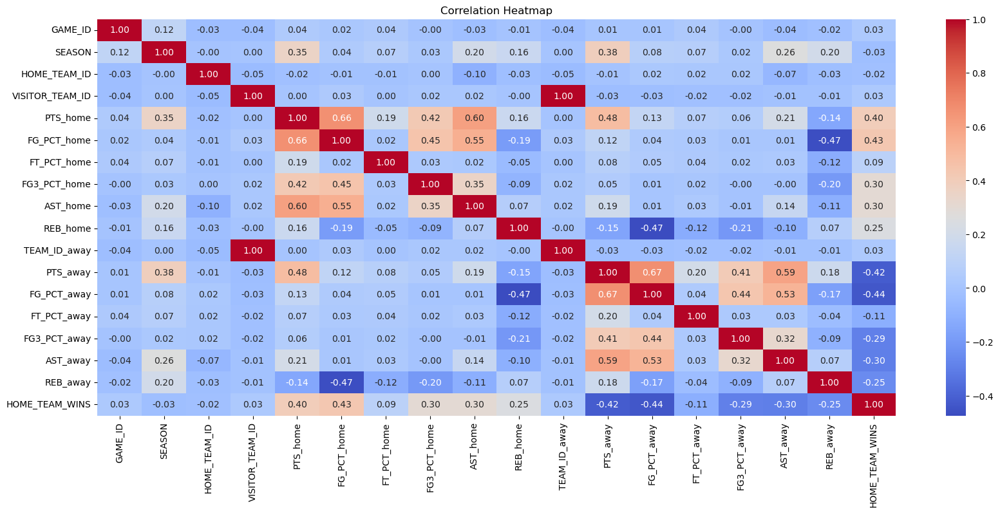

In [ ]:
corr_matrix = data.corr()
plt.figure(figsize=(20, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

# RANDOM FOREST ALGORITHM


In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

In [ ]:
ts

,teamstatspk,TEAM,GP,W,L,WIN%,MIN,PTS,FGM,FGA,...,TOV,STL,BLK,BLKA,PF,PFD,+/-,SEASON,Win_Percentage,On-Off Plus-Minus
0,0,PHX,52,42,10,0.808,48.1,112.7,42.7,89.4,...,13.3,8.6,4.3,4.0,19.3,19.3,7.8,2020-21,0.807692,NaN
1,1,GSW,53,40,13,0.755,48.2,110.9,40.4,86.5,...,15.6,9.4,4.9,4.1,20.3,17.7,8.3,2020-21,0.754717,-0.041494
2,2,MEM,55,37,18,0.673,48.3,112.7,42.7,93.4,...,13.3,10.1,6.4,6.4,19.1,19.0,4.1,2020-21,0.672727,-0.062112
3,3,MIA,54,34,20,0.630,48.5,108.7,39.3,85.7,...,14.9,7.6,3.3,4.4,20.5,20.0,4.2,2020-21,0.629630,-0.061856
4,4,CHI,53,33,20,0.623,48.1,111.6,41.6,87.0,...,13.0,7.2,4.6,5.2,18.8,17.8,1.7,2020-21,0.622642,-0.020790
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
621,621,ATL,82,25,57,0.305,48.1,91.0,35.1,81.3,...,16.7,7.7,4.7,6.3,22.7,0.1,-5.2,2000-01,0.304878,-0.020790
622,622,VAN,82,23,59,0.280,48.2,91.7,35.0,79.7,...,15.7,7.1,4.4,5.8,21.1,0.1,-5.7,2000-01,0.280488,-0.041494
623,623,WAS,82,19,63,0.232,48.0,93.2,34.5,78.7,...,17.0,7.7,4.7,6.2,23.3,0.1,-6.7,2000-01,0.231707,-0.083333
624,624,GSW,82,17,65,0.207,48.2,92.5,35.8,87.5,...,15.9,9.0,5.0,6.0,21.1,0.1,-9.0,2000-01,0.207317,-0.041494


In [ ]:
data

,GAME_DATE_EST,GAME_ID,SEASON,HOME_TEAM_ID,HOME_TEAM_NAME,HOME_TEAM_COACH,VISITOR_TEAM_ID,VISITOR_TEAM_NAME,VISITOR_TEAM_COACH,PTS_home,...,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS,PTS_allowed_home,PTS_allowed_away,gc
0,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,103.0,0.413,1.000,0.413,27.0,44.0,0,103.0,90.0,1
1,2022-06-13,42100405,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,104.0,...,94.0,0.413,0.677,0.344,18.0,47.0,1,94.0,104.0,1
2,2022-06-10,42100404,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,97.0,...,107.0,0.440,0.800,0.349,20.0,55.0,0,107.0,97.0,1
3,2022-06-08,42100403,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,116.0,...,100.0,0.462,0.867,0.375,22.0,31.0,1,100.0,116.0,1
4,2022-06-05,42100402,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,107.0,...,88.0,0.375,0.765,0.405,24.0,43.0,1,88.0,107.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26075,2014-10-06,11400007,2014,1610612737,ATL,Lloyd Pierce,1610612740,NOP,Alvin Gentry,93.0,...,87.0,0.366,0.643,0.375,17.0,43.0,1,87.0,93.0,1
26076,2014-10-06,11400004,2014,1610612741,CHI,Jim Boylen,1610612764,WAS,Scott Brooks,81.0,...,85.0,0.411,0.636,0.267,17.0,47.0,0,85.0,81.0,1
26077,2014-10-06,11400005,2014,1610612747,LAL,Frank Vogel,1610612743,DEN,Michael Malone,98.0,...,95.0,0.387,0.659,0.500,19.0,43.0,1,95.0,98.0,1
26078,2014-10-05,11400002,2014,1610612761,TOR,Nick Nurse,1610612758,SAC,Luke Walton,99.0,...,94.0,0.469,0.725,0.385,18.0,45.0,1,94.0,99.0,1


In [ ]:
selected_features = ['PTS_home', 'PTS_away', 'FG_PCT_home', 'FG_PCT_away', 'AST_home', 'AST_away']
X = data[selected_features]
y = data['HOME_TEAM_WINS']  # Assuming this is the target variable

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

Accuracy: 0.9938426015008659


In [ ]:
results_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Display the first few rows of the results
print(results_df.head())

       Actual  Predicted
13194       0          0
10035       1          1
10427       1          1
8952        1          1
2034        1          1


In [ ]:
# Calculate and Display Classification Report
classification_rep = classification_report(y_test, y_pred)
print("\nClassification Report:")
print(classification_rep)

# Calculate and Display Confusion Matrix
confusion_mat = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:")
print(confusion_mat)

# Calculate and Display Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"\nAccuracy: {accuracy}")


Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2185
           1       0.99      1.00      0.99      3012

    accuracy                           0.99      5197
   macro avg       0.99      0.99      0.99      5197
weighted avg       0.99      0.99      0.99      5197


Confusion Matrix:
[[2167   18]
 [  14 2998]]

Accuracy: 0.9938426015008659


In [ ]:
# Assuming you want to predict based on home team name abbreviation
X = data[['HOME_TEAM_NAME', 'VISITOR_TEAM_NAME']]
y = data['HOME_TEAM_WINS']
label_encoder = LabelEncoder()
X['HOME_TEAM_NAME'] = label_encoder.fit_transform(X['HOME_TEAM_NAME'])
X['VISITOR_TEAM_NAME'] = label_encoder.transform(X['VISITOR_TEAM_NAME'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Random Forest Classifier model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

home_team_name = input("Enter the home team name abbreviation: ")
visitor_team_name = input("Enter the visitor team name abbreviation: ")
encoded_home_team = label_encoder.transform([home_team_name])
encoded_visitor_team= label_encoder.transform([visitor_team_name])

# Predict whether the team will win or not
prediction = model.predict([[encoded_home_team[0], encoded_visitor_team[0]]])

if prediction[0] == 1:
    result = "win"
else:
    result = "lose"

print(f"The home team {home_team_name} is predicted to {result}.")

C:\Users\tanis\AppData\Local\Temp\ipykernel_14740\3420141897.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['HOME_TEAM_NAME'] = label_encoder.fit_transform(X['HOME_TEAM_NAME'])
C:\Users\tanis\AppData\Local\Temp\ipykernel_14740\3420141897.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['VISITOR_TEAM_NAME'] = label_encoder.transform(X['VISITOR_TEAM_NAME'])


Enter the home team name abbreviation: GSW
Enter the visitor team name abbreviation: BOS
The home team GSW is predicted to lose.


C:\Users\tanis\python\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.9938426015008659


# LOGISTIC REGRESSION

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report,confusion_matrix

In [ ]:
data.dropna(inplace=True)
data

,GAME_DATE_EST,GAME_ID,SEASON,HOME_TEAM_ID,HOME_TEAM_NAME,HOME_TEAM_COACH,VISITOR_TEAM_ID,VISITOR_TEAM_NAME,VISITOR_TEAM_COACH,PTS_home,...,AST_home,REB_home,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
0,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,27.0,41.0,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0
1,2022-06-13,42100405,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,104.0,...,23.0,39.0,1610612738,94.0,0.413,0.677,0.344,18.0,47.0,1
2,2022-06-10,42100404,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,97.0,...,22.0,42.0,1610612744,107.0,0.440,0.800,0.349,20.0,55.0,0
3,2022-06-08,42100403,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,116.0,...,28.0,47.0,1610612744,100.0,0.462,0.867,0.375,22.0,31.0,1
4,2022-06-05,42100402,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,107.0,...,25.0,42.0,1610612738,88.0,0.375,0.765,0.405,24.0,43.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26075,2014-10-06,11400007,2014,1610612737,ATL,Lloyd Pierce,1610612740,NOP,Alvin Gentry,93.0,...,24.0,50.0,1610612740,87.0,0.366,0.643,0.375,17.0,43.0,1
26076,2014-10-06,11400004,2014,1610612741,CHI,Jim Boylen,1610612764,WAS,Scott Brooks,81.0,...,18.0,40.0,1610612764,85.0,0.411,0.636,0.267,17.0,47.0,0
26077,2014-10-06,11400005,2014,1610612747,LAL,Frank Vogel,1610612743,DEN,Michael Malone,98.0,...,29.0,45.0,1610612743,95.0,0.387,0.659,0.500,19.0,43.0,1
26078,2014-10-05,11400002,2014,1610612761,TOR,Nick Nurse,1610612758,SAC,Luke Walton,99.0,...,21.0,30.0,1610612758,94.0,0.469,0.725,0.385,18.0,45.0,1


In [ ]:
# Define features and target
features = ['FG_PCT_home', 'FT_PCT_home', 'FG3_PCT_home', 'AST_home', 'REB_home',
            'FG_PCT_away', 'FT_PCT_away', 'FG3_PCT_away', 'AST_away', 'REB_away']
target = 'HOME_TEAM_WINS'

In [ ]:
# Split data into features (X) and target (y)
X = data[features]
y = data[target]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=42)


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the logistic regression model on scaled data
model = LogisticRegression(max_iter=2000)  # Increase max_iter if needed
model.fit(X_train_scaled, y_train)

LogisticRegression(max_iter=2000)

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2']
}

grid_search = GridSearchCV(LogisticRegression(max_iter=1000), param_grid, cv=5)
grid_search.fit(X_train_scaled, y_train)

best_model = grid_search.best_estimator_

C:\Users\tanis\python\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
25 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
25 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\tanis\python\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\tanis\python\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\tanis\python\lib\site-packages\sklearn\linear_model\_logistic.py", line 447, in _check_solver
    raise ValueError(
ValueError: Solv

In [ ]:
# Create and train the logistic regression model
model = LogisticRegression(max_iter=1000, tol=0.001)
model.fit(X_train, y_train)

LogisticRegression(max_iter=1000, tol=0.001)

In [ ]:
# Predict outcomes and evaluate the model
y_pred = model.predict(X_test)

# Evaluate the model's performance
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Confusion Matrix:
 [[1684  501]
 [ 370 2642]]

Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.77      0.79      2185
           1       0.84      0.88      0.86      3012

    accuracy                           0.83      5197
   macro avg       0.83      0.82      0.83      5197
weighted avg       0.83      0.83      0.83      5197



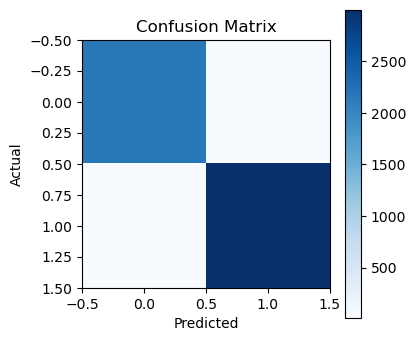

In [ ]:
# Assuming y_test and y_pred are your ground truth and predicted labels
conf_mat = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(4,4))  # Adjust the figsize as per your preference
plt.imshow(conf_mat, cmap='Blues', interpolation='nearest')
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In the context of your binary classification problem:

True Negative (TN): The number of instances where the model correctly predicted that the home team did not win (0) when the actual outcome was also not a win.
False Positive (FP): The number of instances where the model incorrectly predicted that the home team won (1) when the actual outcome was not a win (0).
False Negative (FN): The number of instances where the model incorrectly predicted that the home team did not win (0) when the actual outcome was a win (1).
True Positive (TP): The number of instances where the model correctly predicted that the home team won (1) when the actual outcome was also a win.

Based on the classification report:

The precision for class 0 (home team not winning) is 0.82, and for class 1 (home team winning) is 0.84. This indicates that when the model predicts a team won or didn't win, it's correct around 82-84% of the time.
The recall for class 0 is 0.77, and for class 1 is 0.88. This means that the model captures 77-88% of the actual outcomes for each class.
The F1-score for class 0 is 0.79, and for class 1 is 0.86. The weighted average F1-score is 0.83, indicating a good balance between precision and recall.
The accuracy of the model is 0.83, meaning it correctly predicts the outcome for approximately 83% of the instances.

# TEAM PERFORMANCE ANALYSIS (MATCH TO MATCH)

In [ ]:
team_season_stats = data.groupby(['SEASON', 'HOME_TEAM_NAME'])['PTS_home'].mean().reset_index()
# Data Aggregation: Calculate average points scored by each team in each season
team_season_stats

,SEASON,HOME_TEAM_NAME,PTS_home
0,2003,ATL,95.785714
1,2003,BKN,92.391304
2,2003,BOS,95.113636
3,2003,CHI,88.902439
4,2003,CLE,95.536585
...,...,...,...
564,2021,SAC,110.604651
565,2021,SAS,113.636364
566,2021,TOR,110.630435
567,2021,UTA,116.369565


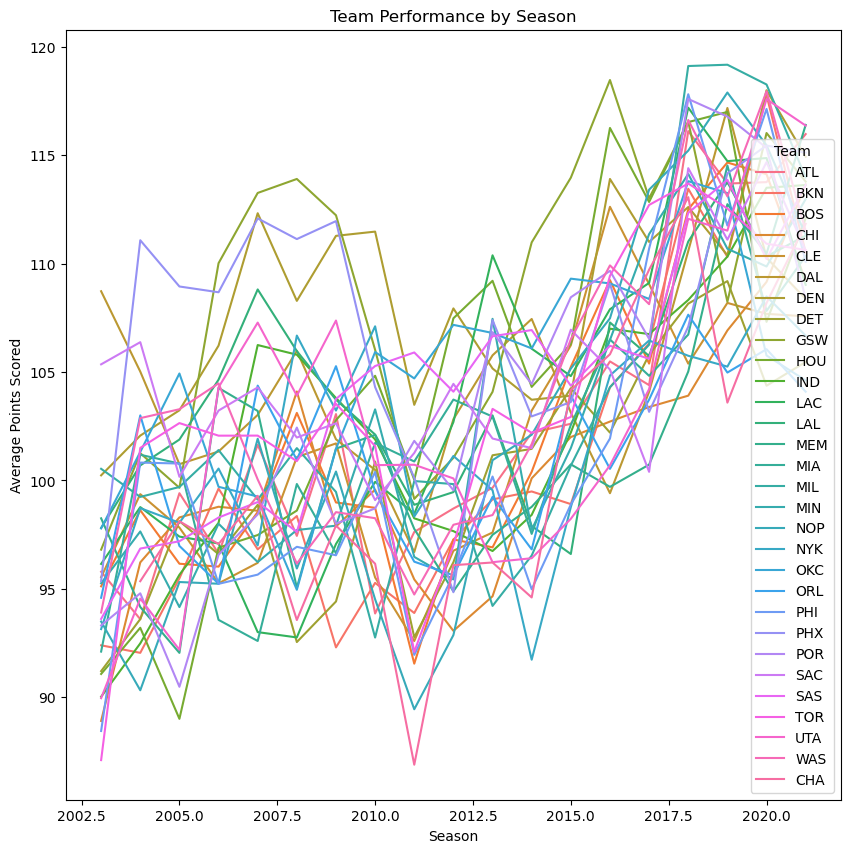

In [ ]:
# Exploratory Data Analysis (EDA): Visualize average points by season
plt.figure(figsize=(10, 10))
sns.lineplot(data=team_season_stats, x='SEASON', y='PTS_home', hue='HOME_TEAM_NAME')
plt.title('Team Performance by Season')
plt.xlabel('Season')
plt.ylabel('Average Points Scored')
plt.legend(title='Team')
plt.show()

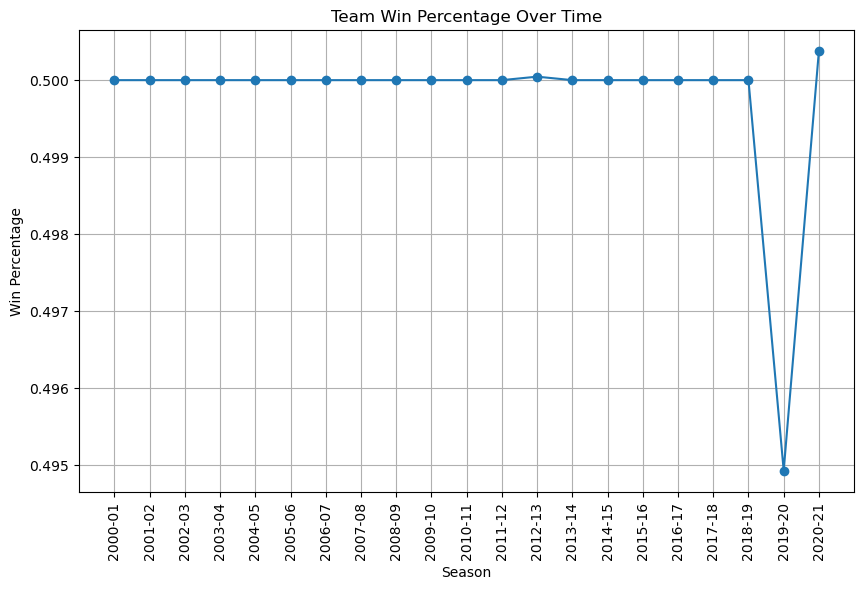

In [ ]:
# Assuming you have a large team_stats DataFrame with columns like 'Season', 'Wins', 'Losses', etc.
# Calculate aggregate team performance metrics
ts['Win_Percentage'] = ts['W'] / (ts['W'] + ts['L'])

# Downsample the data to a coarser granularity (e.g., by season)
downsampled_team_stats = ts.groupby('SEASON').mean().reset_index()

# Visualize team dynamics with downsampling
plt.figure(figsize=(10, 6))
plt.plot(downsampled_team_stats['SEASON'], downsampled_team_stats['Win_Percentage'], marker='o')
plt.xlabel('Season')
plt.ylabel('Win Percentage')
plt.xticks(rotation=90)
plt.title('Team Win Percentage Over Time')
plt.grid(True)
plt.show()

In [ ]:
selected_columns = ['HOME_TEAM_NAME', 'VISITOR_TEAM_NAME', 'PTS_home', 'PTS_away', 'FG_PCT_home', 'FG_PCT_away']
data2 = data[selected_columns].dropna()
data2

,HOME_TEAM_NAME,VISITOR_TEAM_NAME,PTS_home,PTS_away,FG_PCT_home,FG_PCT_away
0,BOS,GSW,90.0,103.0,0.425,0.413
1,GSW,BOS,104.0,94.0,0.466,0.413
2,BOS,GSW,97.0,107.0,0.400,0.440
3,BOS,GSW,116.0,100.0,0.483,0.462
4,GSW,BOS,107.0,88.0,0.453,0.375
...,...,...,...,...,...,...
26075,ATL,NOP,93.0,87.0,0.419,0.366
26076,CHI,WAS,81.0,85.0,0.338,0.411
26077,LAL,DEN,98.0,95.0,0.448,0.387
26078,TOR,SAC,99.0,94.0,0.440,0.469


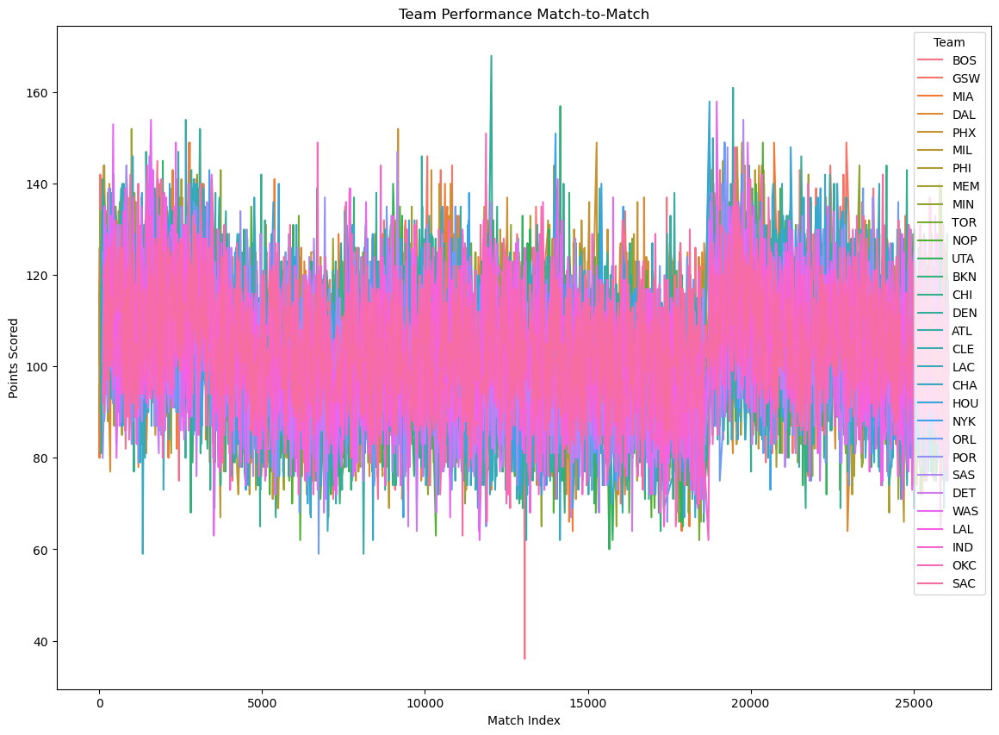

In [ ]:
# EDA: Visualize team performance metrics match-to-match
plt.figure(figsize=(14, 10))
sns.lineplot(data=data, x=data.index, y='PTS_home', hue='HOME_TEAM_NAME')
plt.title('Team Performance Match-to-Match')
plt.xlabel('Match Index')
plt.ylabel('Points Scored')
plt.legend(title='Team')
plt.show()

In [ ]:
grouped_data = data2.groupby('HOME_TEAM_NAME')
print(grouped_data)

### STATISTICAL MODELS FOR EACH TEAM - LINEAR REGRESSION

In [ ]:
# Statistical Models: Linear Regression
X = team_season_stats['SEASON'].values.reshape(-1, 1)
y = team_season_stats['PTS_home'].values
model = LinearRegression()
model.fit(X, y)

LinearRegression()

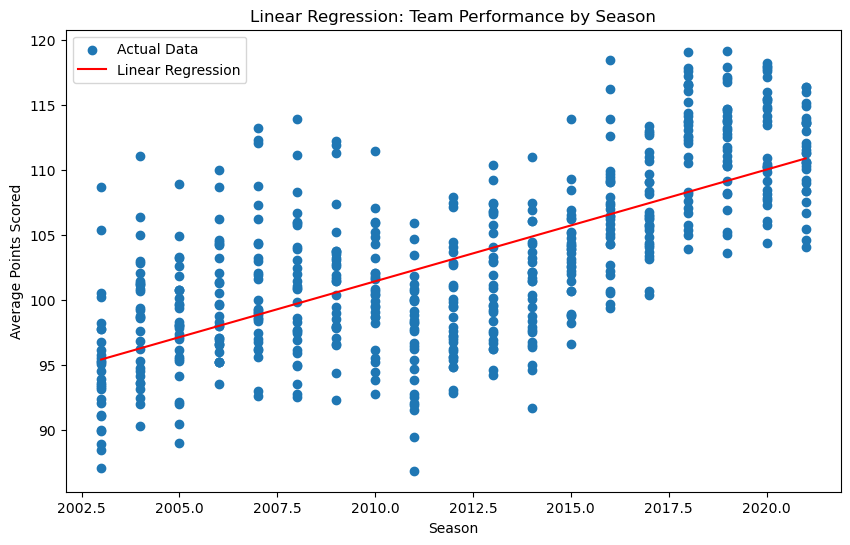

In [ ]:
# Visualization and Interpretation
plt.figure(figsize=(10, 6))
plt.scatter(X, y, label='Actual Data')
plt.plot(X, model.predict(X), color='red', label='Linear Regression')
plt.title('Linear Regression: Team Performance by Season')
plt.xlabel('Season')
plt.ylabel('Average Points Scored')
plt.legend()
plt.show()

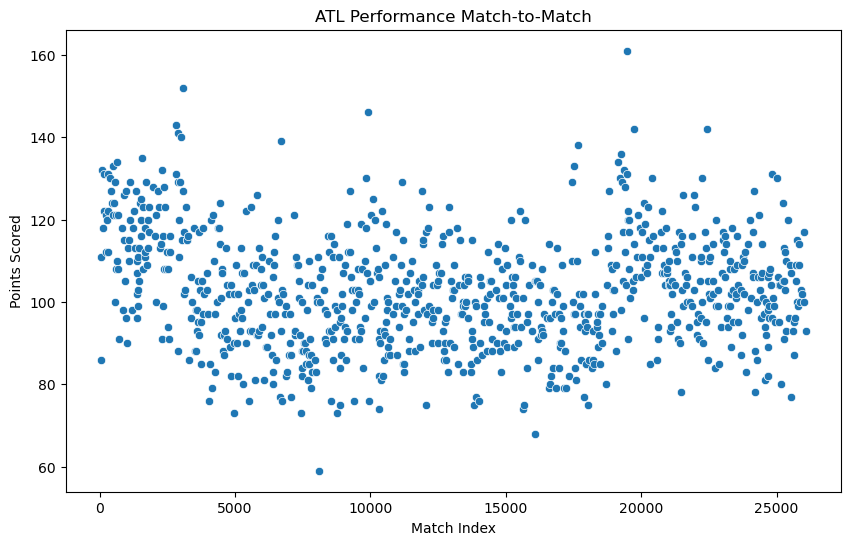

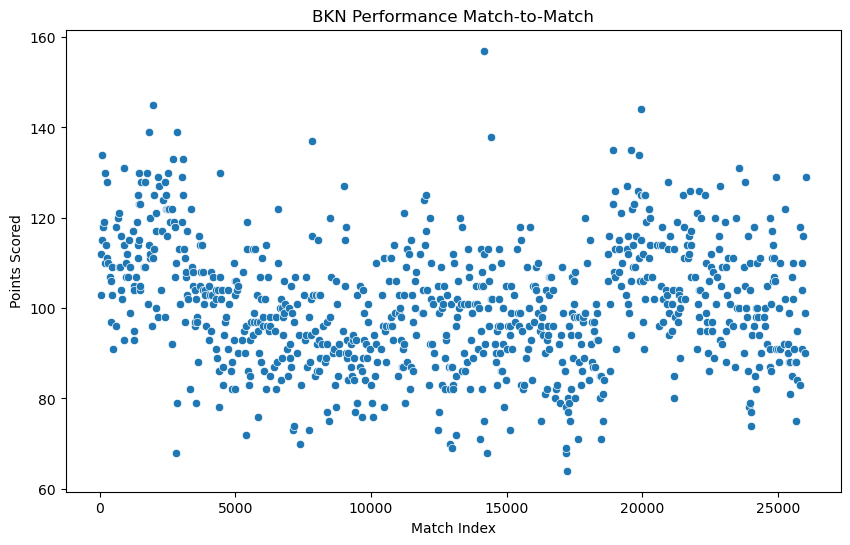

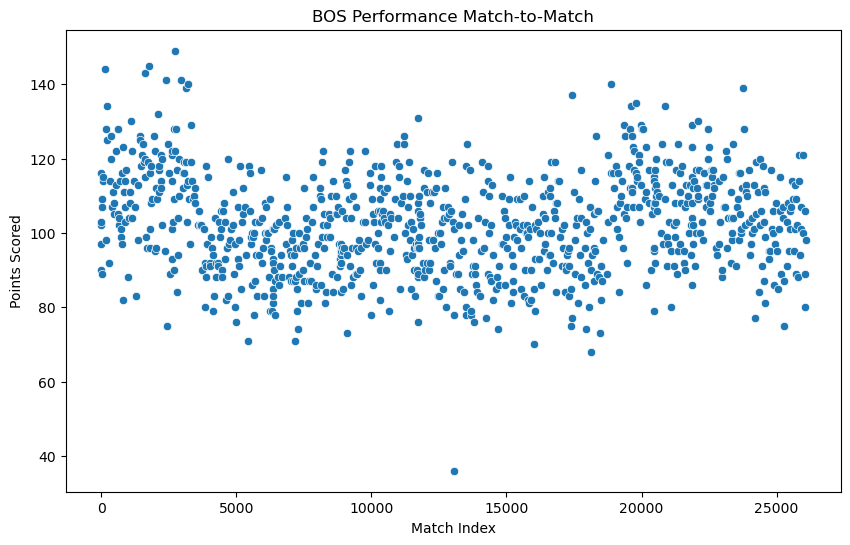

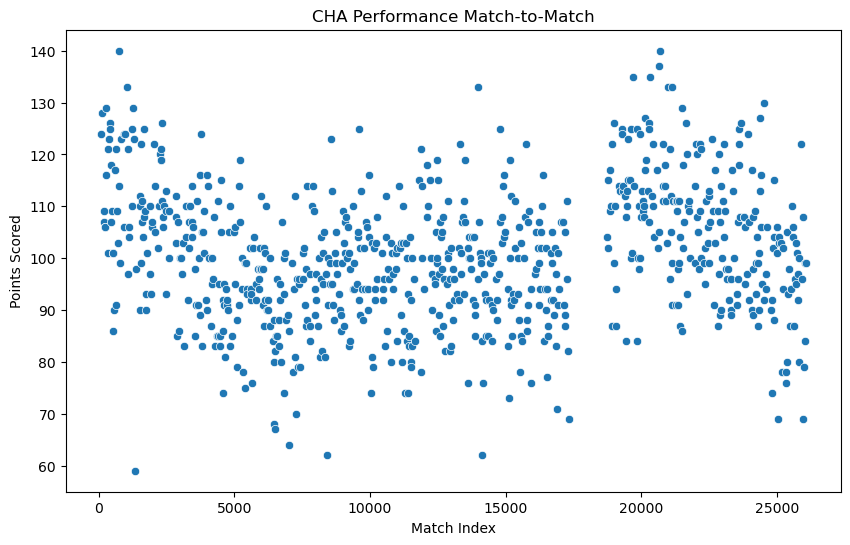

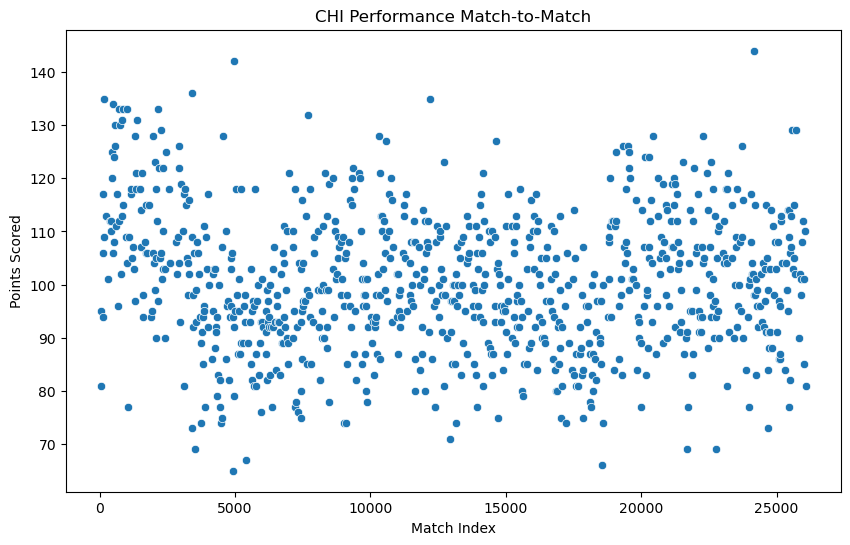

...

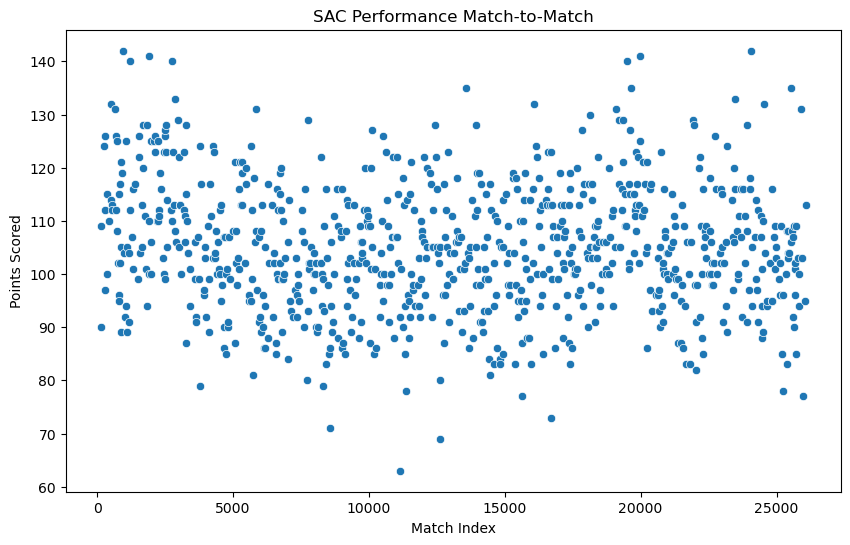

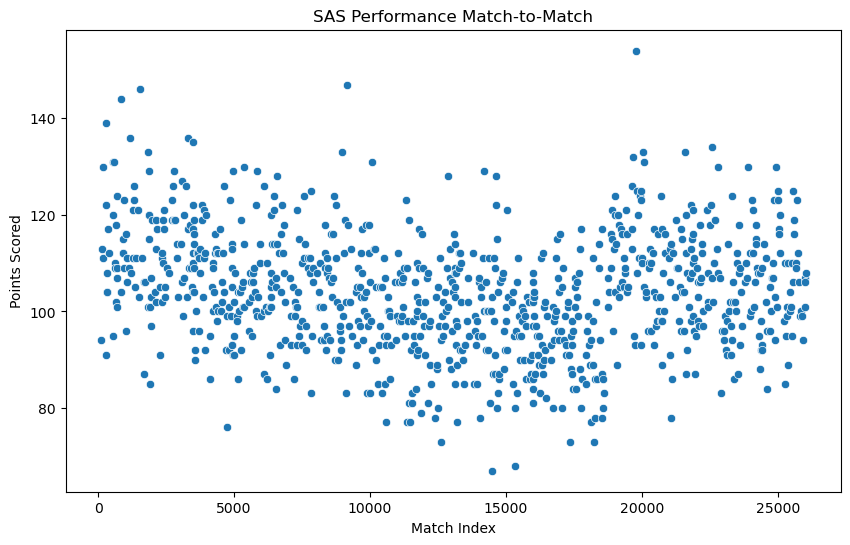

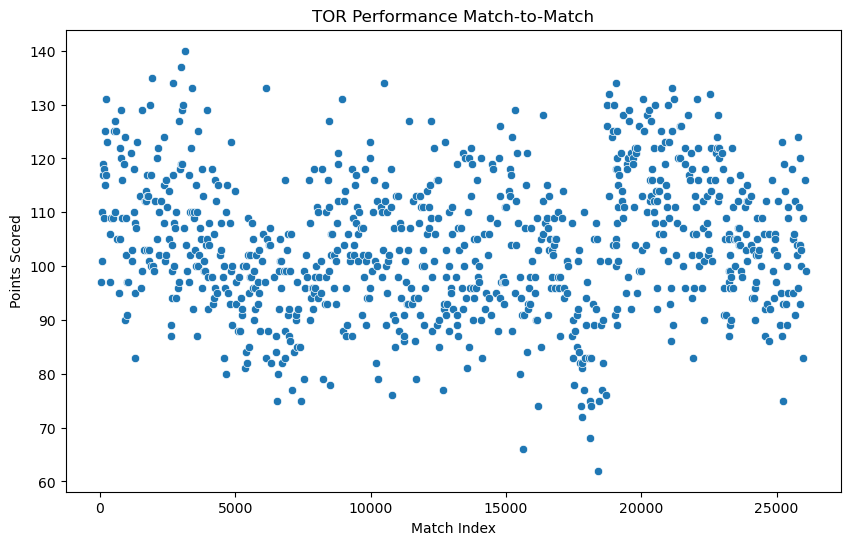

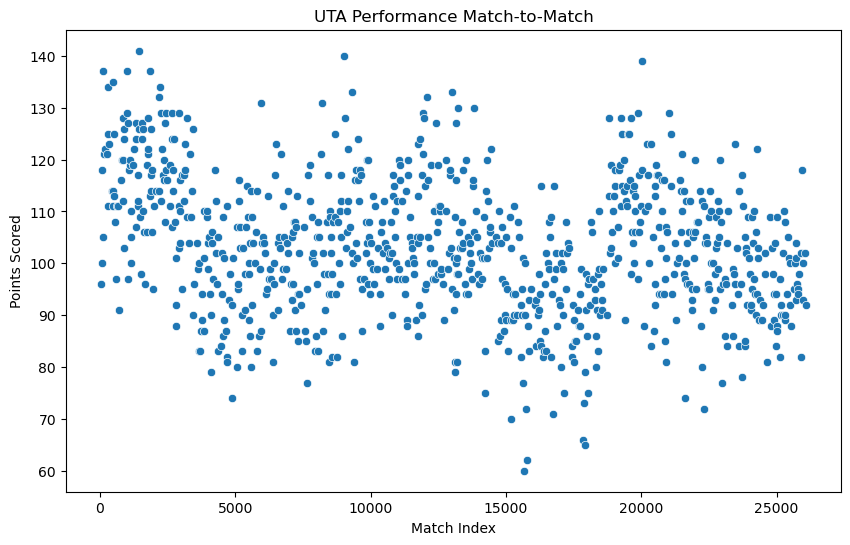

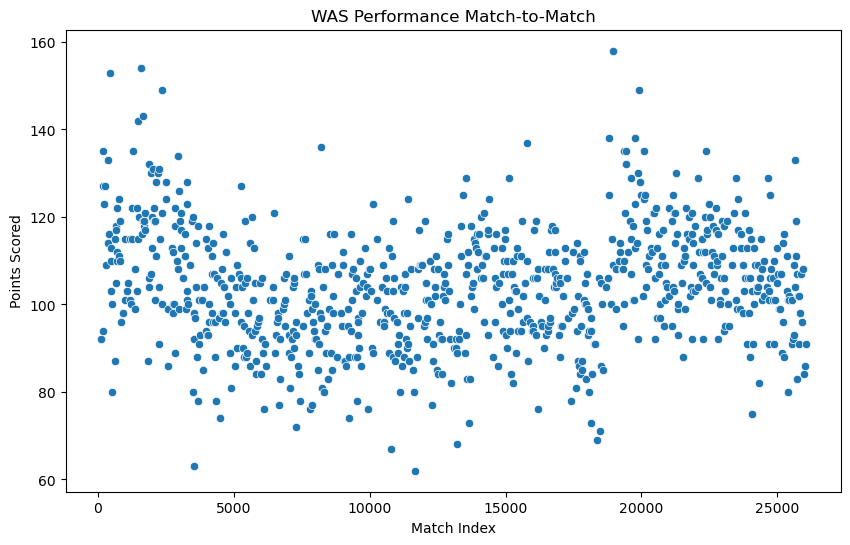

In [ ]:
# Iterate through each group (team) and analyze performance match-to-match
for team, team_data in grouped_data:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=team_data, x=team_data.index, y='PTS_home')
    plt.title(f'{team} Performance Match-to-Match')
    plt.xlabel('Match Index')
    plt.ylabel('Points Scored')
    plt.show()

# Team Performance Analysis:

Analyze team performance metrics such as points scored (PTS), field goal percentage (FG_PCT), free throw percentage (FT_PCT), three-point percentage (FG3_PCT), assists (AST), and rebounds (REB).

Visualize how these metrics change over different seasons or matches.

Compare performance metrics between home and away games.

Identify trends and patterns in team performance

In [ ]:
# Select relevant columns for analysis
selected_columns = ['SEASON', 'HOME_TEAM_NAME', 'PTS_home', 'FG_PCT_home', 'FT_PCT_home', 'FG3_PCT_home', 'AST_home', 'REB_home',
                    'PTS_away', 'FG_PCT_away', 'FT_PCT_away', 'FG3_PCT_away', 'AST_away', 'REB_away']

team_data = data[selected_columns]

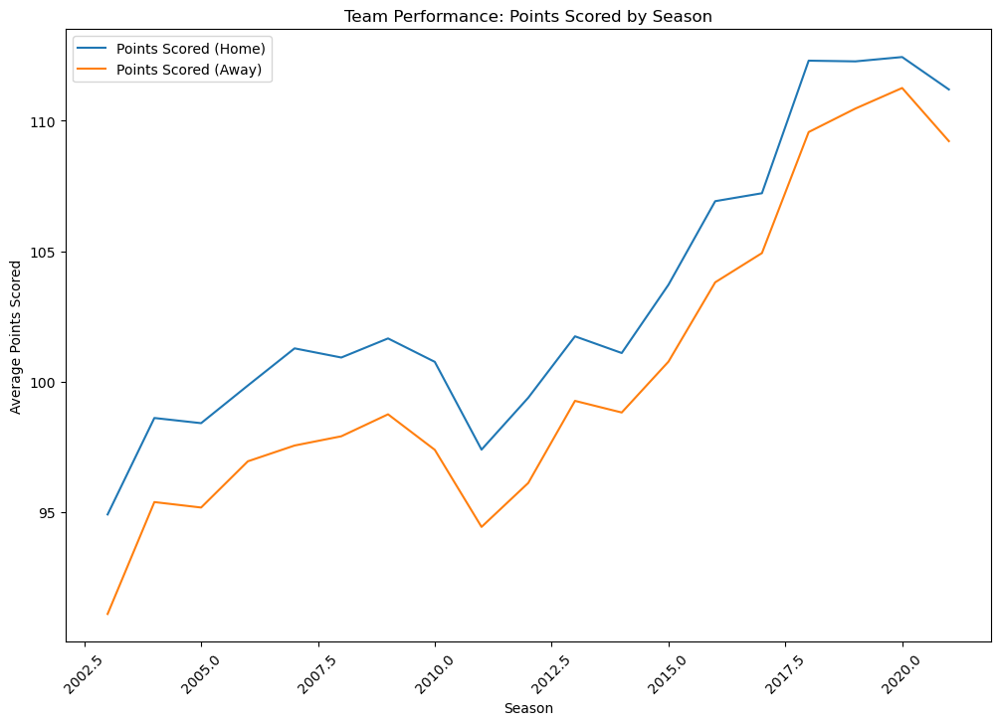

In [ ]:
# Group data by season and calculate mean metrics
grouped_by_season = team_data.groupby('SEASON').mean().reset_index()

# Visualize performance metrics by season
plt.figure(figsize=(12, 8))
sns.lineplot(data=grouped_by_season, x='SEASON', y='PTS_home', label='Points Scored (Home)')
sns.lineplot(data=grouped_by_season, x='SEASON', y='PTS_away', label='Points Scored (Away)')
plt.title('Team Performance: Points Scored by Season')
plt.xlabel('Season')
plt.ylabel('Average Points Scored')
plt.legend()
plt.xticks(rotation=45)
plt.show()

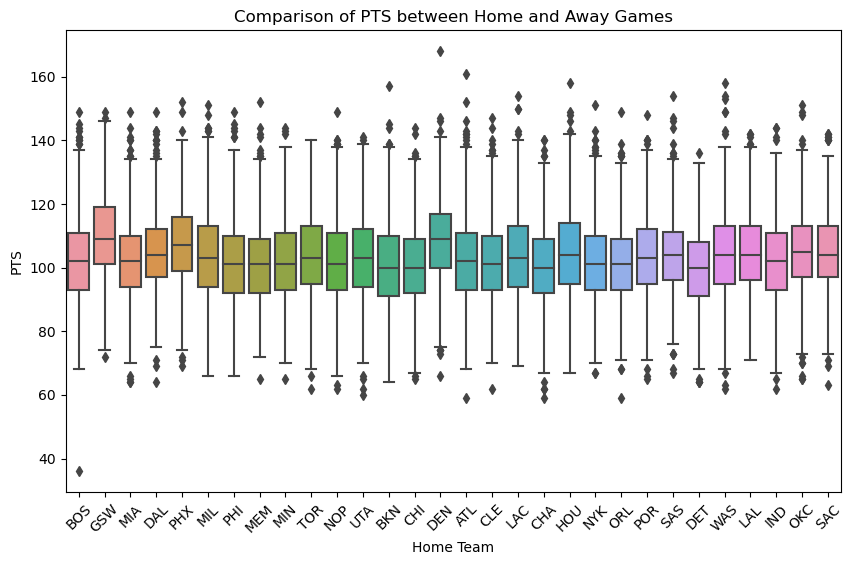

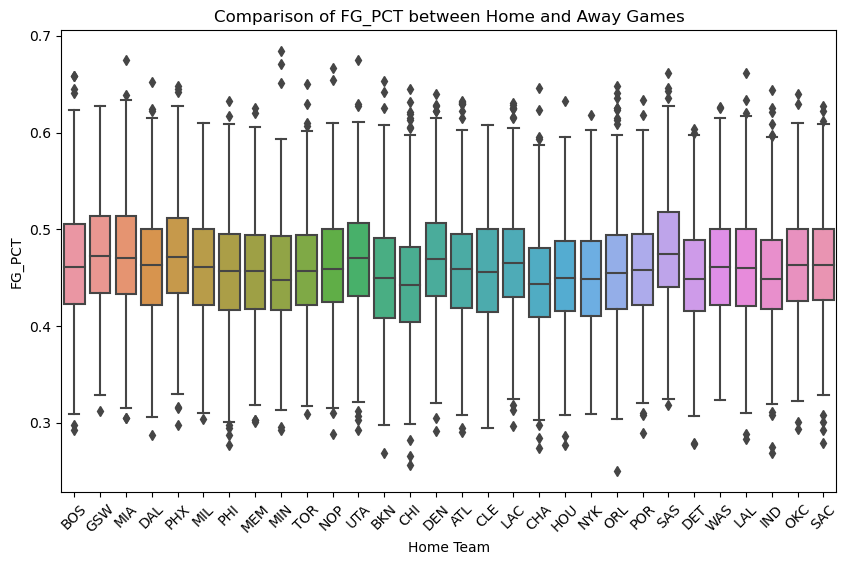

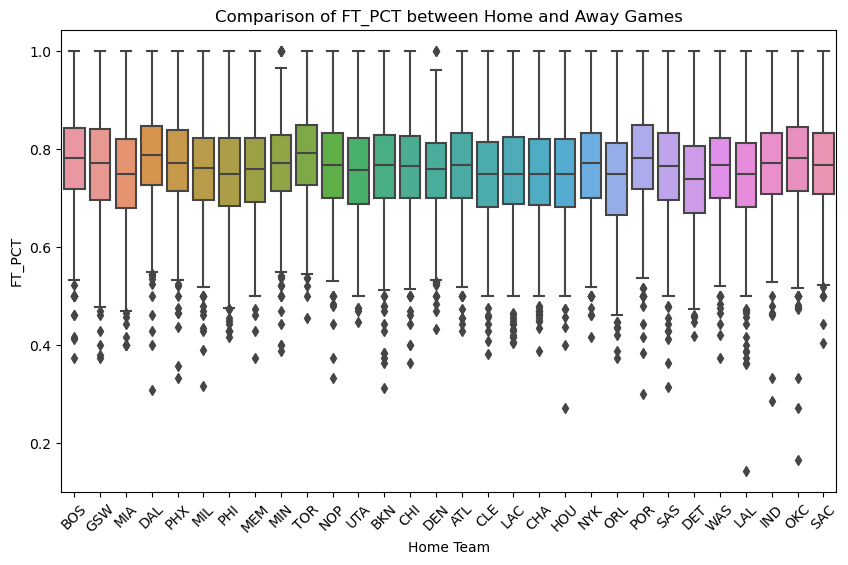

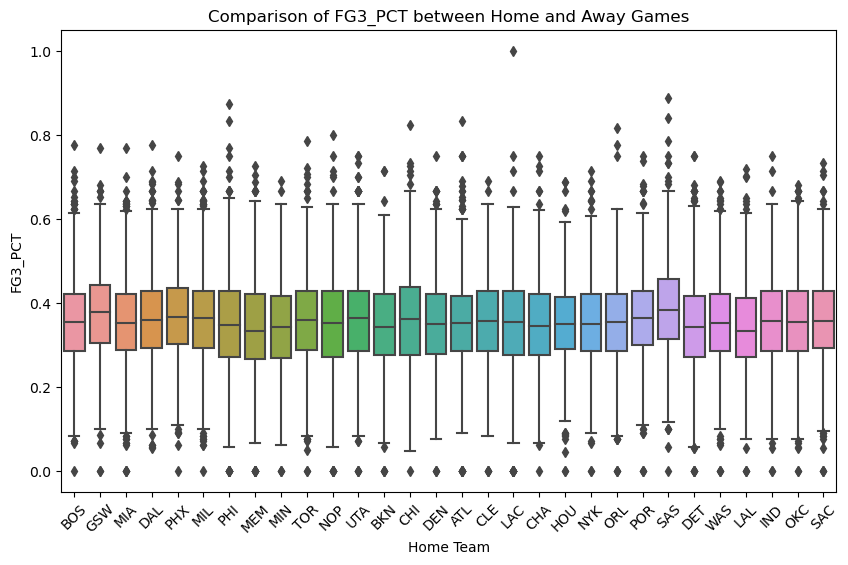

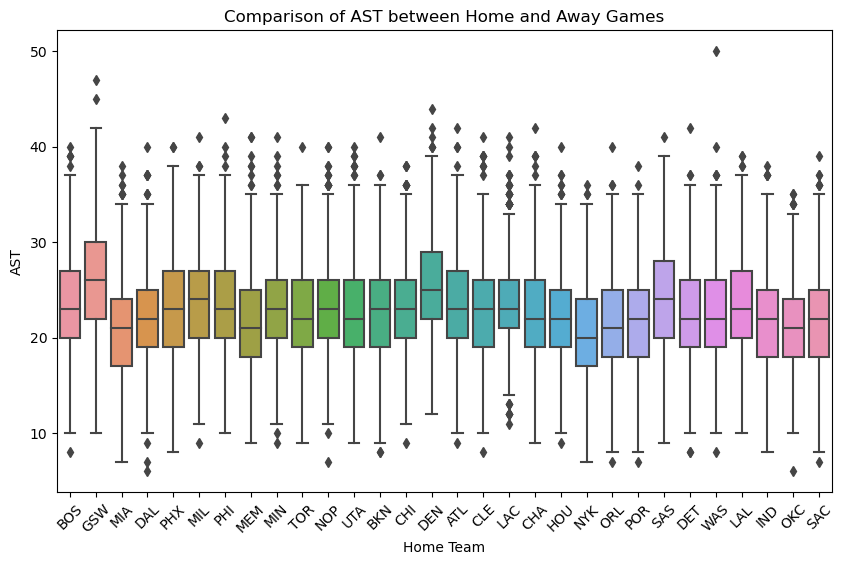

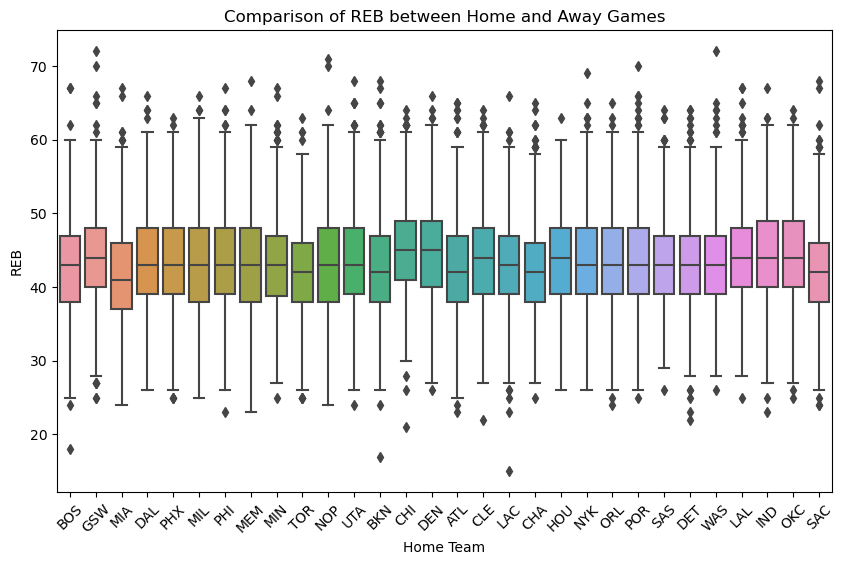

In [ ]:
# Visualize comparison of performance metrics between home and away games
performance_metrics = ['PTS', 'FG_PCT', 'FT_PCT', 'FG3_PCT', 'AST', 'REB']

for metric in performance_metrics:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=team_data, x='HOME_TEAM_NAME', y=f'{metric}_home')
    plt.title(f'Comparison of {metric} between Home and Away Games')
    plt.xlabel('Home Team')
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.show()

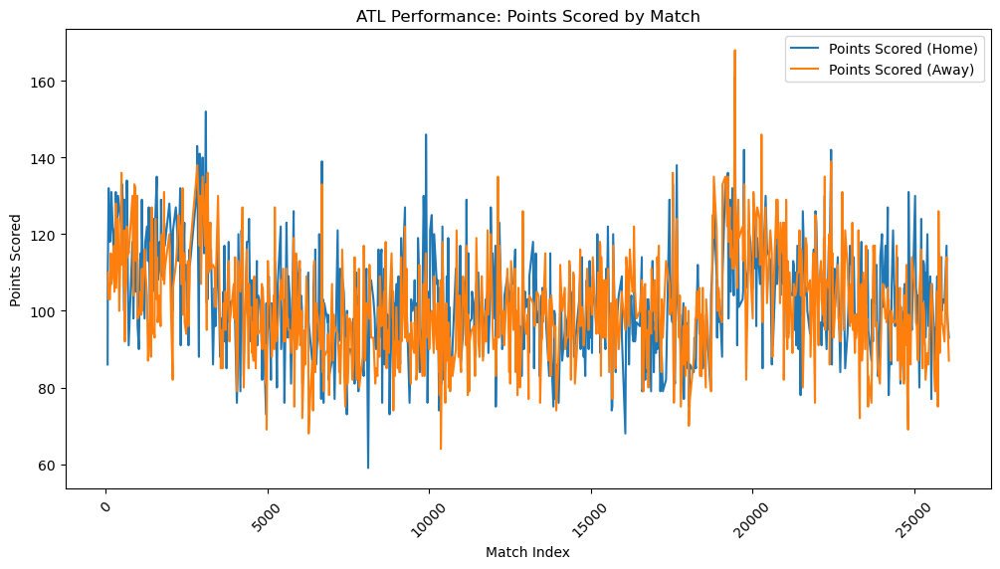

In [ ]:
# Visualize trend of a specific metric (e.g., points scored) for a specific team
team_to_analyze = 'ATL'
team_performance = team_data[team_data['HOME_TEAM_NAME'] == team_to_analyze]

plt.figure(figsize=(12, 6))
sns.lineplot(data=team_performance, x=team_performance.index, y='PTS_home', label='Points Scored (Home)')
sns.lineplot(data=team_performance, x=team_performance.index, y='PTS_away', label='Points Scored (Away)')
plt.title(f'{team_to_analyze} Performance: Points Scored by Match')
plt.xlabel('Match Index')
plt.ylabel('Points Scored')
plt.legend()
plt.xticks(rotation=45)
plt.show()

# TEAM PERFORMANCE ANALYSIS

In [ ]:
df= pd.read_csv('nba_team_stats_playoffs_00_to_21.csv')
df

,teamstatspk,team,games_played,wins,losses,win_percentage,minutes,points,field_goals_made,field_goals_attempted,...,rebounds,assists,turnovers,steals,blocks,blocks_attempted,personal_fouls,personal_fouls_drawn,plus_minus,season
0,0,Milwaukee Bucks,23,16,7,0.696,48.4,110.3,42.1,91.1,...,49.0,22.8,12.7,7.8,4.2,3.8,18.0,20.1,5.1,2020-21
1,1,Phoenix Suns,22,14,8,0.636,48.0,109.0,40.9,85.0,...,42.7,23.2,11.9,6.5,4.2,3.6,19.7,18.5,4.5,2020-21
2,2,Brooklyn Nets,12,7,5,0.583,48.4,112.5,40.7,86.2,...,42.6,22.6,11.6,7.1,4.8,6.2,21.2,18.6,6.3,2020-21
3,3,Philadelphia 76ers,12,7,5,0.583,48.0,116.3,42.5,85.8,...,44.7,24.9,12.8,8.0,6.2,3.8,23.0,23.8,7.5,2020-21
4,4,Atlanta Hawks,18,10,8,0.556,48.0,106.3,38.9,86.8,...,42.4,20.2,12.4,6.7,4.4,4.3,21.2,20.3,-1.5,2020-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,331,Minnesota Timberwolves,4,1,3,0.250,48.0,82.0,30.8,79.5,...,42.5,18.5,12.8,7.5,5.8,4.5,24.3,0.0,-6.5,2000-01
332,332,Orlando Magic,4,1,3,0.250,49.3,102.8,39.0,89.8,...,43.8,22.0,11.3,8.0,6.3,5.3,26.5,0.3,-5.8,2000-01
333,333,Phoenix Suns,4,1,3,0.250,48.0,88.5,34.0,89.5,...,44.3,21.3,13.8,9.8,5.8,5.3,23.5,0.0,-9.5,2000-01
334,334,Miami Heat,3,0,3,0.000,48.0,78.3,29.7,72.3,...,35.0,16.7,18.7,5.0,5.0,4.0,25.3,0.3,-22.3,2000-01


In [ ]:
nRowsRead = 1000
df1 = pd.read_csv('nba_team_stats_playoffs_00_to_21.csv', delimiter=',', nrows = nRowsRead)
df1.dataframeName = 'nba_team_stats_playoffs_00_to_21.csv'
nRow, nCol = df1.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 336 rows and 29 columns


In [ ]:
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna('columns') # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()

C:\Users\tanis\AppData\Local\Temp\ipykernel_14740\2970181590.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only.
  df = df.dropna('columns') # drop columns with NaN


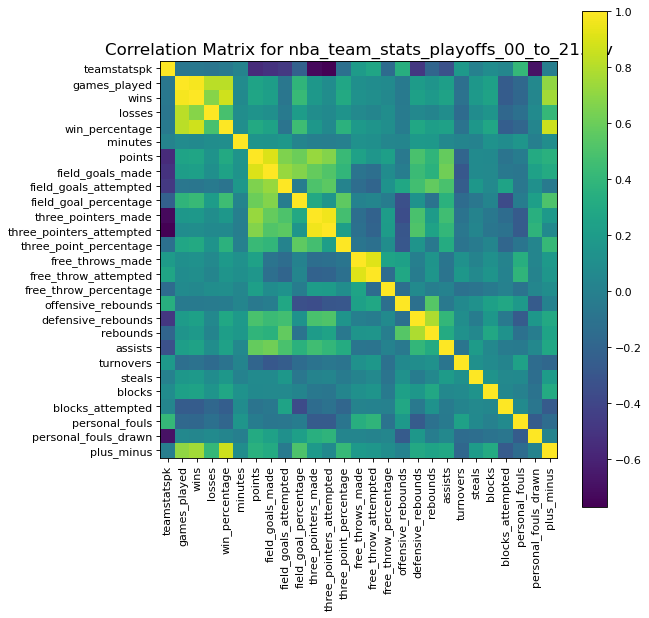

In [ ]:
plotCorrelationMatrix(df1, 8)

The correlation matrix you sent shows the correlation between different basketball statistics for a team in the NBA playoffs. The darker the cell, the stronger the correlation between the two statistics.

A positive correlation means that the two statistics tend to move in the same direction. For example, a strong positive correlation between field goal percentage and points scored means that teams that shoot a higher field goal percentage tend to score more points.

A negative correlation means that the two statistics tend to move in opposite directions. For example, a strong negative correlation between turnovers and win percentage means that teams that commit more turnovers tend to win fewer games.

The correlation matrix can be used to identify which statistics are most closely related to each other. This information can be used to improve team performance by focusing on the statistics that have the strongest correlations with winning.

In [ ]:
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number])
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]]
    columnNames = list(df)
    if len(columnNames) > 10:
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

C:\Users\tanis\AppData\Local\Temp\ipykernel_14740\3879777494.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only.
  df = df.dropna('columns')


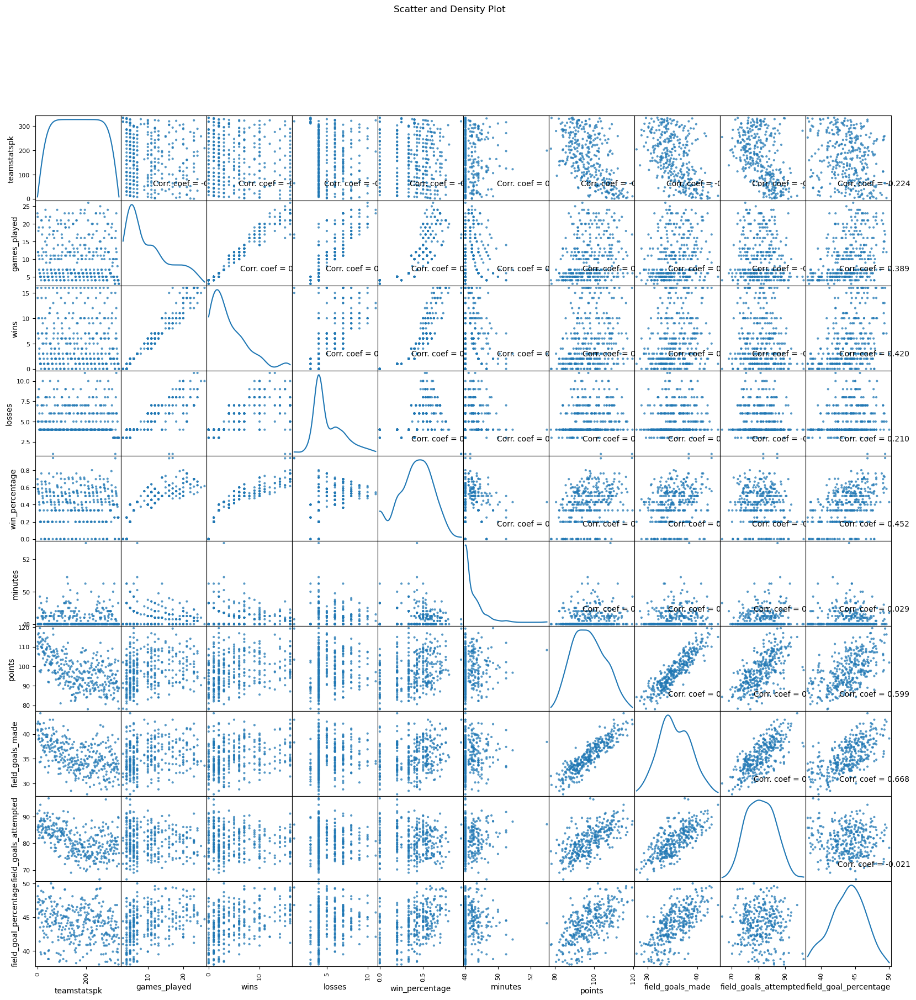

In [ ]:
plotScatterMatrix(df1, 20, 10)

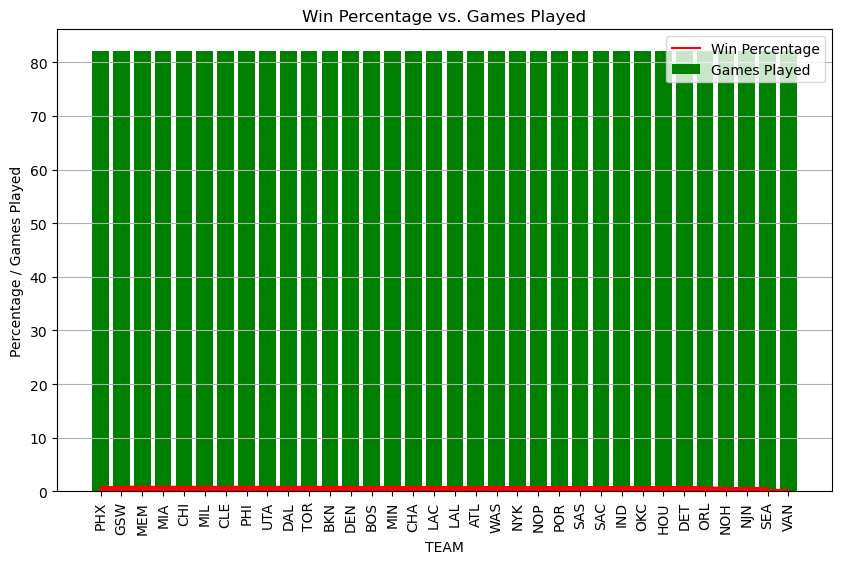

In [ ]:
plt.figure(figsize=(10, 6))

plt.bar(ts['TEAM'], ts['GP'], color='g', label='Games Played')
plt.plot(ts["TEAM"], ts["WIN%"], color="r", label="Win Percentage")
plt.xlabel('TEAM')
plt.ylabel('Percentage / Games Played')
plt.title('Win Percentage vs. Games Played')
plt.legend()
plt.grid(axis='y')
plt.xticks(rotation=90)
plt.show()

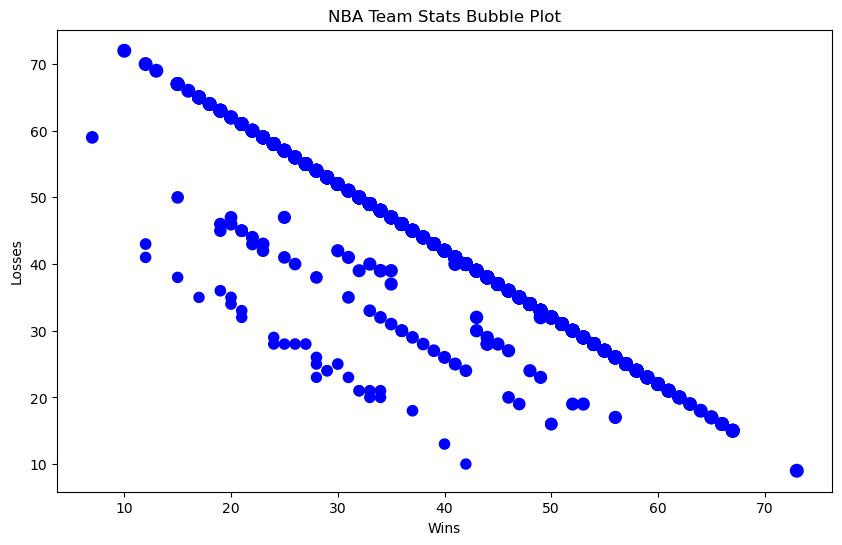

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(ts["W"], ts["L"], s=ts["GP"], color="blue")
plt.xlabel("Wins")
plt.ylabel("Losses")
plt.title("NBA Team Stats Bubble Plot")
plt.show()

# PLAYER PERFORMANCE ANALYSIS

In [ ]:
ps.columns

Index(['Rk', 'Player', 'Pos', 'Age', 'Tm', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%',
       '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'Season',
       'MVP', 'PER', 'BPM', 'PPG', 'WS_Points', 'WS_Off_Reb', 'WS_Def_Reb',
       'WS_Assists', 'WS_Steals', 'WS_Blocks', 'WS_Turnovers',
       'WS_Personal_Fouls', 'WS'],
      dtype='object')

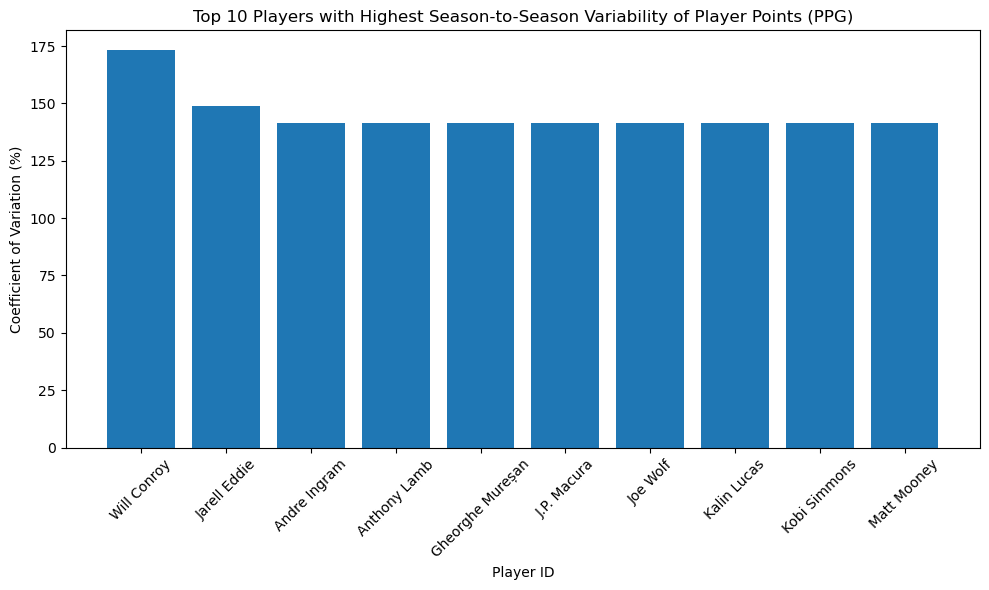

In [ ]:
# Calculate the standard deviation of points per game (PPG) for each player
ps['PPG'] = ps['PTS'] / count
player_variability = ps.groupby('Player')['PPG'].std()

# Calculate the coefficient of variation (CV) of points for each player
player_mean_ppg = ps.groupby('Player')['PPG'].mean()
player_cv = (player_variability / player_mean_ppg) * 100

# Filter top N players with highest CV
N = 10  # Adjust N as needed
top_players = player_cv.nlargest(N)

# Plot the coefficient of variation (CV) for top players
plt.figure(figsize=(10,6))
plt.bar(top_players.index, top_players.values)
plt.xlabel('Player ID')
plt.ylabel('Coefficient of Variation (%)')
plt.title('Top {} Players with Highest Season-to-Season Variability of Player Points (PPG)'.format(N))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The finding from the coefficient of variation (CV) analysis is that it measures the variability of a player's points per game (PPG) across different seasons. A higher CV indicates greater variability, meaning that a player's performance fluctuates significantly from season to season.

Conclusion:

Player Consistency: Some players exhibit more consistent performance over seasons with lower CV values. This could be due to factors like experience, playing style, or consistent training regimes.

Player Variability: On the other hand, players with higher CV values have more variable performance. This might be attributed to factors such as injuries, changes in playing conditions, or shifts in team dynamics.

Strategic Considerations: Coaches and team managers should take into account a player's performance variability when making strategic decisions. This could influence decisions about rotations, playing time, and game planning.

Development Opportunities: For players with high variability, targeted training and development programs could help stabilize performance and enhance overall contribution to the team.

Team Strategy: Understanding which players are consistent performers and which are more variable can inform team strategy. Consistent players might be relied upon for stable performance, while variable players may require different approaches.

Overall, the coefficient of variation analysis provides valuable insights into player performance dynamics, enabling teams to make informed decisions for optimal gameplay and strategy.

In [ ]:
# Select relevant columns for analysis
selected_columns = ['Player', 'PTS', 'FG%', 'TRB', 'AST', 'STL', 'BLK', 'Season']

# Filter out missing values and select columns
player_data = ps[selected_columns].dropna()

# EDA: Summary statistics, distributions, and correlations
summary_stats = player_data.describe()
correlation_matrix = player_data.corr()

player_data

,Player,PTS,FG%,TRB,AST,STL,BLK,Season
0,Mahmoud Abdul-Rauf,7.3,0.377,1.2,1.9,0.5,0.0,1997-98
1,Tariq Abdul-Wahad,6.4,0.403,2.0,0.9,0.6,0.2,1997-98
2,Shareef Abdur-Rahim,22.3,0.485,7.1,2.6,1.1,0.9,1997-98
3,Cory Alexander,8.1,0.428,2.4,3.5,1.2,0.2,1997-98
4,Cory Alexander,4.5,0.414,1.3,1.9,0.7,0.1,1997-98
...,...,...,...,...,...,...,...,...
14568,Thaddeus Young,6.3,0.465,4.4,1.7,1.2,0.4,2021-22
14569,Trae Young,28.4,0.460,3.7,9.7,0.9,0.1,2021-22
14570,Omer Yurtseven,5.3,0.526,5.3,0.9,0.3,0.4,2021-22
14571,Cody Zeller,5.2,0.567,4.6,0.8,0.3,0.2,2021-22


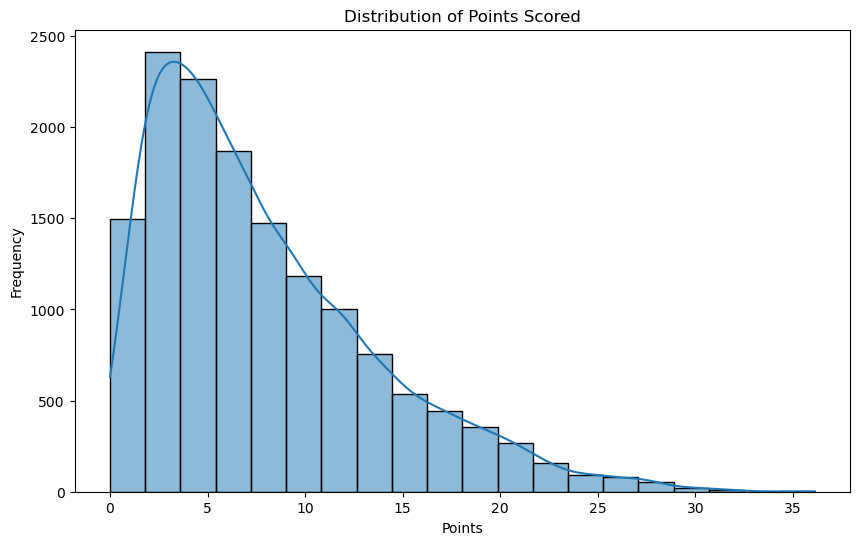

In [ ]:
# Visualization: Distribution of points scored (PTS)
plt.figure(figsize=(10, 6))
sns.histplot(data=player_data, x='PTS', bins=20, kde=True)
plt.title('Distribution of Points Scored')
plt.xlabel('Points')
plt.ylabel('Frequency')
plt.show()


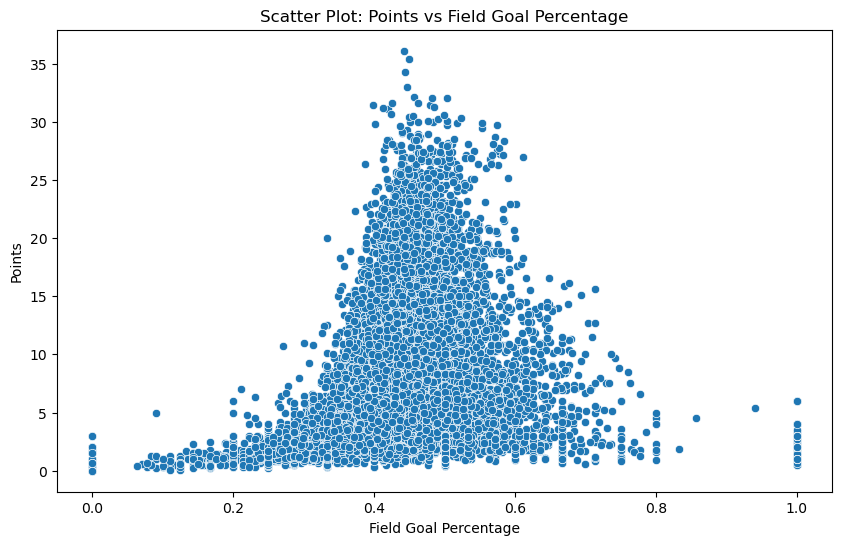

In [ ]:
# Visualization: Scatter plot of Points (PTS) vs Field Goal Percentage (FG_PCT)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=player_data, x='FG%', y='PTS')
plt.title('Scatter Plot: Points vs Field Goal Percentage')
plt.xlabel('Field Goal Percentage')
plt.ylabel('Points')
plt.show()


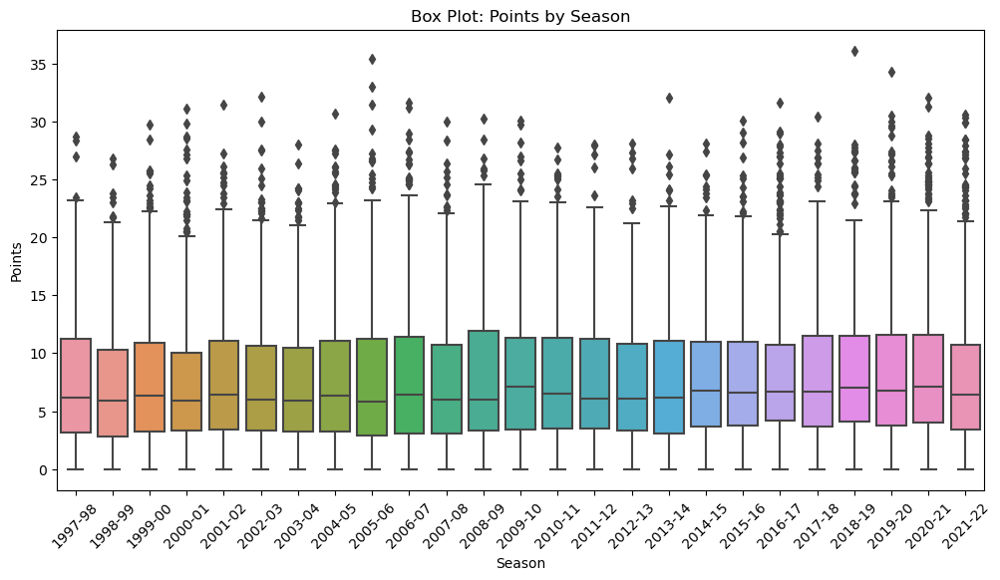

In [ ]:
# Visualization: Box plot of Points (PTS) by Season
plt.figure(figsize=(12, 6))
sns.boxplot(data=player_data, x='Season', y='PTS')
plt.title('Box Plot: Points by Season')
plt.xlabel('Season')
plt.ylabel('Points')
plt.xticks(rotation=45)
plt.show()

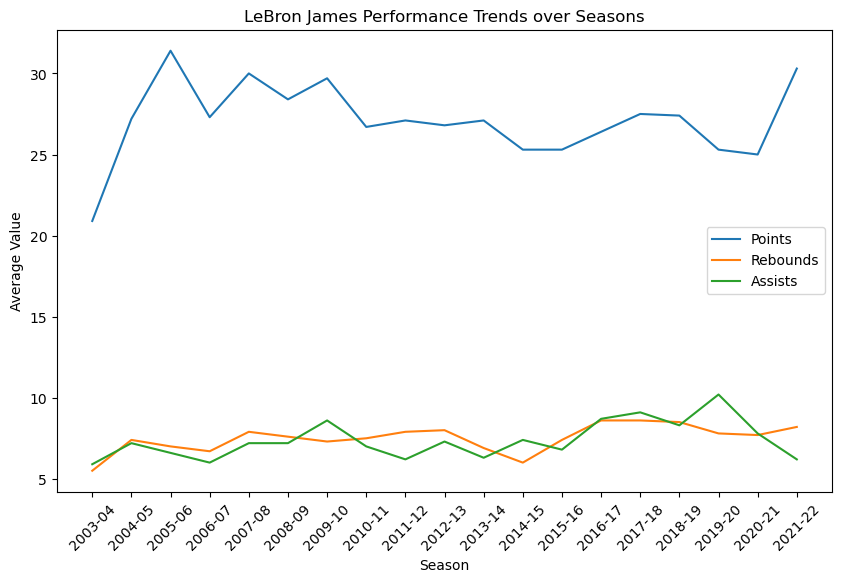

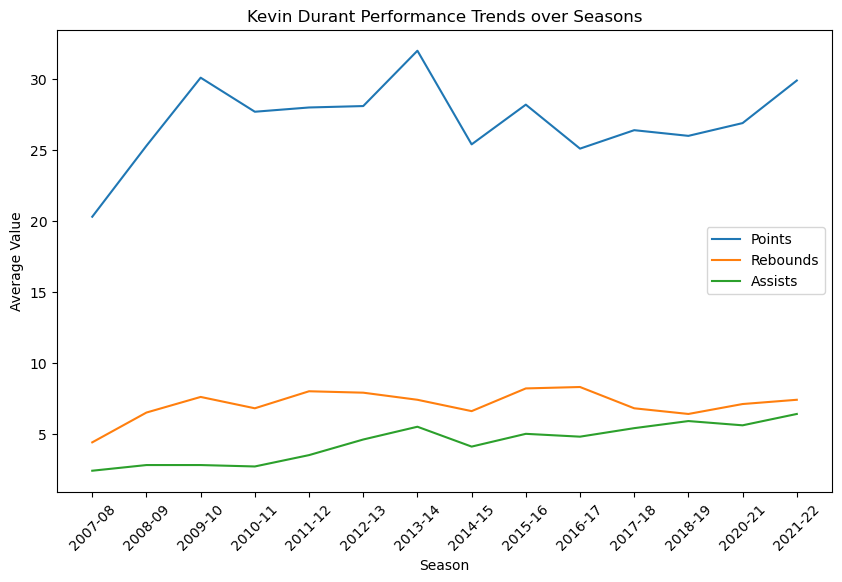

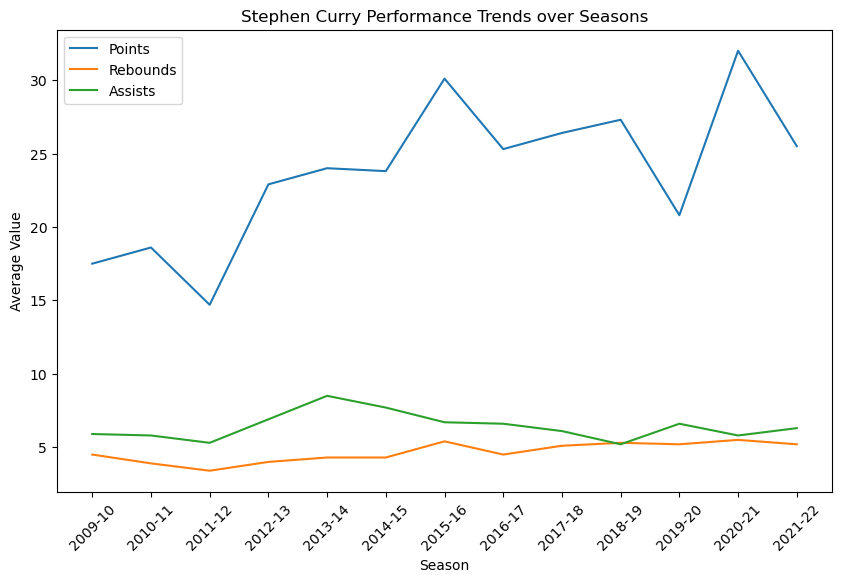

In [ ]:
# Select relevant columns for analysis
selected_columns = ['Player', 'PTS', 'TRB', 'AST', 'Season']

# Filter out missing values and select columns
player_data2 = ps[selected_columns].dropna()

# Group data by player and season, and calculate mean performance metrics
grouped_data = player_data2.groupby(['Player', 'Season']).mean().reset_index()

# Select players to visualize trends for
players_to_visualize = ['LeBron James', 'Kevin Durant', 'Stephen Curry']

# Create line plots for selected players' metrics over seasons
for player in players_to_visualize:
    player_subset = grouped_data[grouped_data['Player'] == player]
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=player_subset, x='Season', y='PTS', label='Points')
    sns.lineplot(data=player_subset, x='Season', y='TRB', label='Rebounds')
    sns.lineplot(data=player_subset, x='Season', y='AST', label='Assists')
    plt.title(f'{player} Performance Trends over Seasons')
    plt.xlabel('Season')
    plt.ylabel('Average Value')
    plt.legend()
    plt.xticks(rotation=45)
    plt.show()

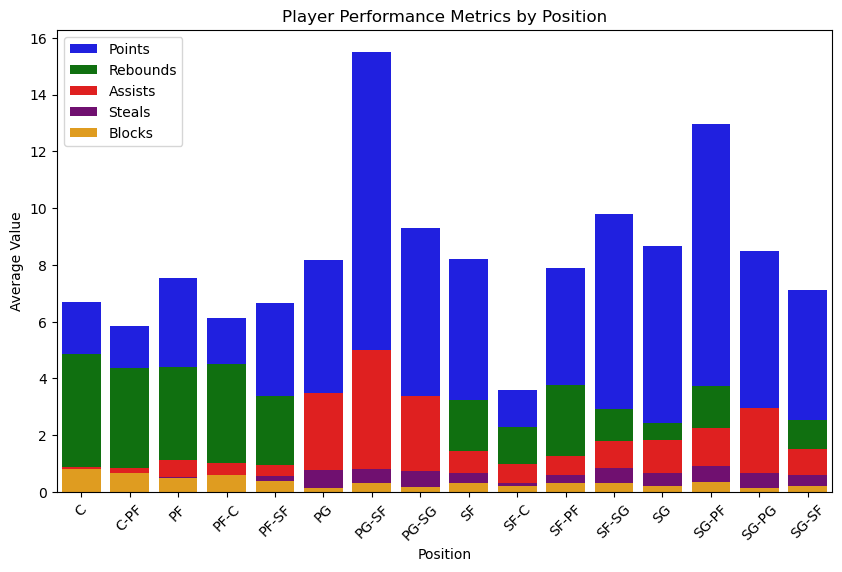

In [ ]:
selected_columns = ['Pos', 'PTS', 'TRB', 'AST', 'STL', 'BLK']

player_data = ps[selected_columns].dropna()

# Group data by player position and calculate mean performance metrics
grouped_data = player_data.groupby('Pos').mean().reset_index()

# Define custom colors and labels for the legend
colors = ['blue', 'green', 'red', 'purple', 'orange']
labels = ['Points', 'Rebounds', 'Assists', 'Steals', 'Blocks']

# Visualize player performance metrics by position
plt.figure(figsize=(10, 6))
# Loop through each metric to plot and set custom color and label
for i, (color, label) in enumerate(zip(colors, labels)):
    sns.barplot(data=grouped_data, x='Pos', y=selected_columns[i+1], color=color, label=label)
plt.title('Player Performance Metrics by Position')
plt.xlabel('Position')
plt.ylabel('Average Value')
plt.legend()
plt.xticks(rotation=45)
plt.show()

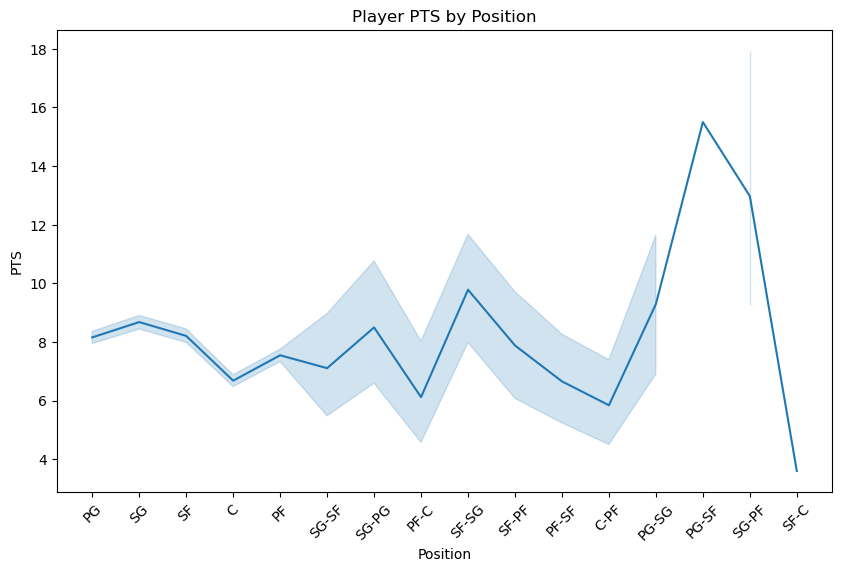

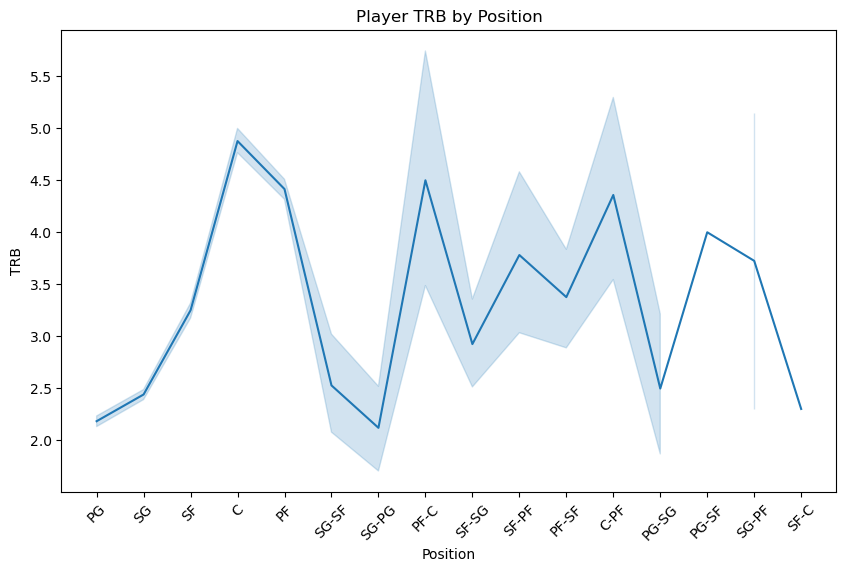

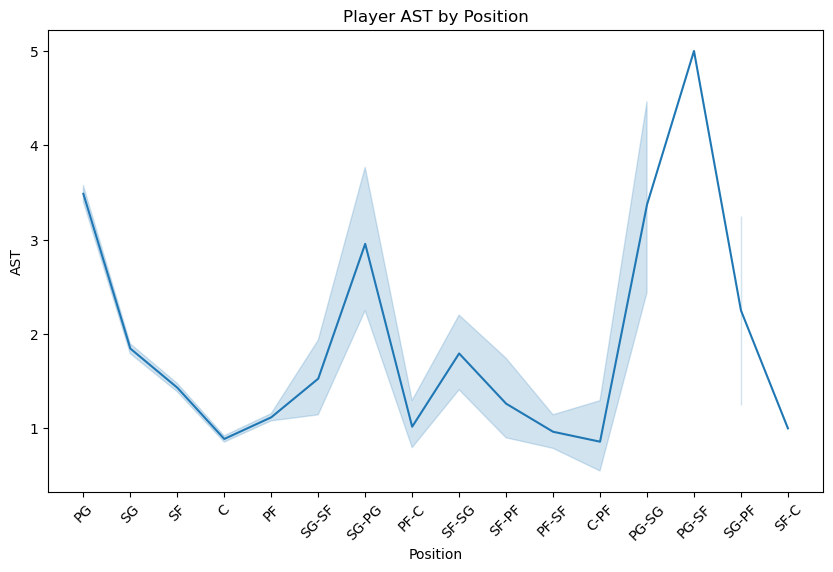

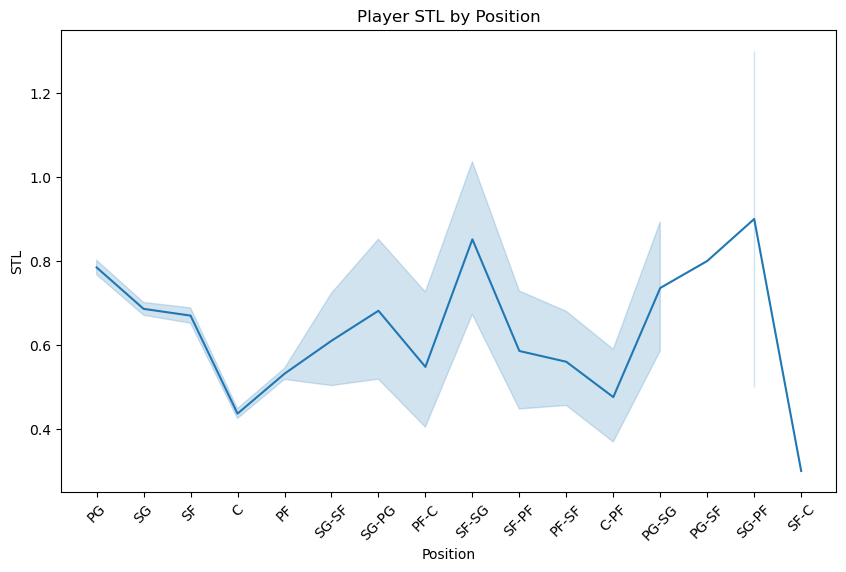

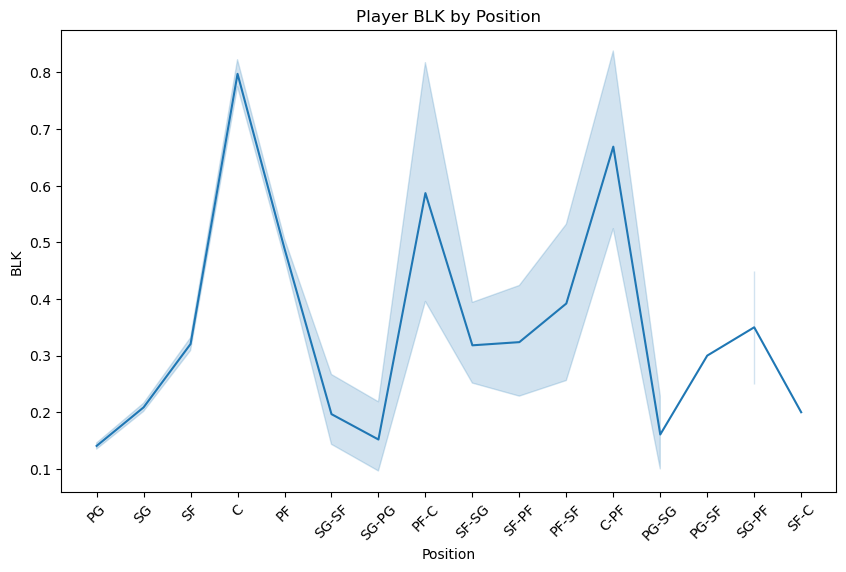

In [ ]:
selected_columns = ['Pos', 'PTS', 'TRB', 'AST', 'STL', 'BLK']
player_data = ps[selected_columns].dropna()

# Visualize player performance metrics by position using box plots
performance_metrics = ['PTS', 'TRB', 'AST', 'STL', 'BLK']

for metric in performance_metrics:
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=player_data, x='Pos', y=metric)
    plt.title(f'Player {metric} by Position')
    plt.xlabel('Position')
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.show()

# ON-OFF COURT IMPACT

Plus-Minus Stats: Assess how the team performs when a player is on the court versus when they are off the court.

In [ ]:
ts["On-Off Plus-Minus"] = (ts["W"] - ts["W"].shift(1)) / ts["MIN"]
ts

,teamstatspk,TEAM,GP,W,L,WIN%,MIN,PTS,FGM,FGA,...,TOV,STL,BLK,BLKA,PF,PFD,+/-,SEASON,Win_Percentage,On-Off Plus-Minus
0,0,PHX,52,42,10,0.808,48.1,112.7,42.7,89.4,...,13.3,8.6,4.3,4.0,19.3,19.3,7.8,2020-21,0.807692,NaN
1,1,GSW,53,40,13,0.755,48.2,110.9,40.4,86.5,...,15.6,9.4,4.9,4.1,20.3,17.7,8.3,2020-21,0.754717,-0.041494
2,2,MEM,55,37,18,0.673,48.3,112.7,42.7,93.4,...,13.3,10.1,6.4,6.4,19.1,19.0,4.1,2020-21,0.672727,-0.062112
3,3,MIA,54,34,20,0.630,48.5,108.7,39.3,85.7,...,14.9,7.6,3.3,4.4,20.5,20.0,4.2,2020-21,0.629630,-0.061856
4,4,CHI,53,33,20,0.623,48.1,111.6,41.6,87.0,...,13.0,7.2,4.6,5.2,18.8,17.8,1.7,2020-21,0.622642,-0.020790
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
621,621,ATL,82,25,57,0.305,48.1,91.0,35.1,81.3,...,16.7,7.7,4.7,6.3,22.7,0.1,-5.2,2000-01,0.304878,-0.020790
622,622,VAN,82,23,59,0.280,48.2,91.7,35.0,79.7,...,15.7,7.1,4.4,5.8,21.1,0.1,-5.7,2000-01,0.280488,-0.041494
623,623,WAS,82,19,63,0.232,48.0,93.2,34.5,78.7,...,17.0,7.7,4.7,6.2,23.3,0.1,-6.7,2000-01,0.231707,-0.083333
624,624,GSW,82,17,65,0.207,48.2,92.5,35.8,87.5,...,15.9,9.0,5.0,6.0,21.1,0.1,-9.0,2000-01,0.207317,-0.041494


In [ ]:
ts2=ts[ts['On-Off Plus-Minus'] > 0]
ts2

,teamstatspk,TEAM,GP,W,L,WIN%,MIN,PTS,FGM,FGA,...,TOV,STL,BLK,BLKA,PF,PFD,+/-,SEASON,Win_Percentage,On-Off Plus-Minus
5,5,MIL,55,34,21,0.618,48.2,112.7,40.7,88.9,...,13.7,7.7,4.2,4.5,17.8,19.2,4.0,2020-21,0.618182,0.020747
11,11,BKN,53,29,24,0.547,48.2,111.3,41.5,88.4,...,14.0,7.0,5.5,5.2,19.8,19.3,0.5,2020-21,0.547170,0.020747
13,13,BOS,55,30,25,0.545,48.7,108.1,39.4,87.6,...,14.2,7.3,5.9,4.7,18.7,19.2,4.1,2020-21,0.545455,0.020534
30,30,MIL,73,56,17,0.767,48.2,118.7,43.3,90.9,...,15.1,7.2,5.9,4.5,19.6,21.7,10.1,2019-20,0.767123,0.912863
52,52,WAS,72,25,47,0.347,48.2,114.4,41.5,90.9,...,14.2,8.0,4.3,5.0,22.7,22.2,-4.7,2019-20,0.347222,0.041494
60,60,MIL,82,60,22,0.732,48.2,118.1,43.4,91.1,...,13.9,7.5,5.9,4.8,19.6,20.2,8.9,2018-19,0.731707,0.933610
90,90,HOU,82,65,17,0.793,48.2,112.4,38.7,84.2,...,13.8,8.5,4.8,4.4,19.5,20.4,8.5,2017-18,0.792683,0.995851
120,120,GSW,82,67,15,0.817,48.2,115.9,43.1,87.1,...,14.8,9.6,6.8,3.8,19.3,19.4,11.6,2016-17,0.817073,0.954357
150,150,GSW,82,73,9,0.890,48.5,114.9,42.5,87.3,...,15.2,8.4,6.1,4.1,20.7,19.8,10.8,2015-16,0.890244,1.092784
180,180,GSW,82,67,15,0.817,48.1,110.0,41.6,87.0,...,14.5,9.3,6.0,3.6,19.9,18.8,10.1,2014-15,0.817073,1.185031


# Win Shares (WS):
Estimates the number of wins a player contributes to their team's success.

In [ ]:
# Constants for Win Shares calculation
team_games = 82  # Number of team games in a season (adjust as needed)
league_total_win_shares = 400  # Total Win Shares for the league (adjust as needed)

# Calculate individual statistics for the Win Shares calculation
ps['WS_Points'] = ps['PTS'] / team_games
ps['WS_Off_Reb'] = ps['ORB'] / team_games
ps['WS_Def_Reb'] = ps['DRB'] / team_games
ps['WS_Assists'] = ps['AST'] / team_games
ps['WS_Steals'] = ps['STL'] / team_games
ps['WS_Blocks'] = ps['BLK'] / team_games
ps['WS_Turnovers'] = ps['TOV'] / team_games
ps['WS_Personal_Fouls'] = ps['PF'] / team_games

# Calculate Win Shares (WS)
ps['WS'] = (ps['WS_Points'] + ps['WS_Off_Reb'] + ps['WS_Def_Reb']
                     + ps['WS_Assists'] + ps['WS_Steals'] + ps['WS_Blocks']
                     - ps['WS_Turnovers'] - ps['WS_Personal_Fouls']) * league_total_win_shares

# Print the player data with Win Shares
print(ps[['Player', 'WS']])

                    Player          WS
0       Mahmoud Abdul-Rauf   45.365854
1        Tariq Abdul-Wahad   36.585366
2      Shareef Abdur-Rahim  138.536585
3           Cory Alexander   58.536585
4           Cory Alexander   28.292683
...                    ...         ...
14568       Thaddeus Young   56.097561
14569           Trae Young  181.463415
14570       Omer Yurtseven   48.292683
14571          Cody Zeller   40.975610
14572          Ivica Zubac   86.341463

[14573 rows x 2 columns]


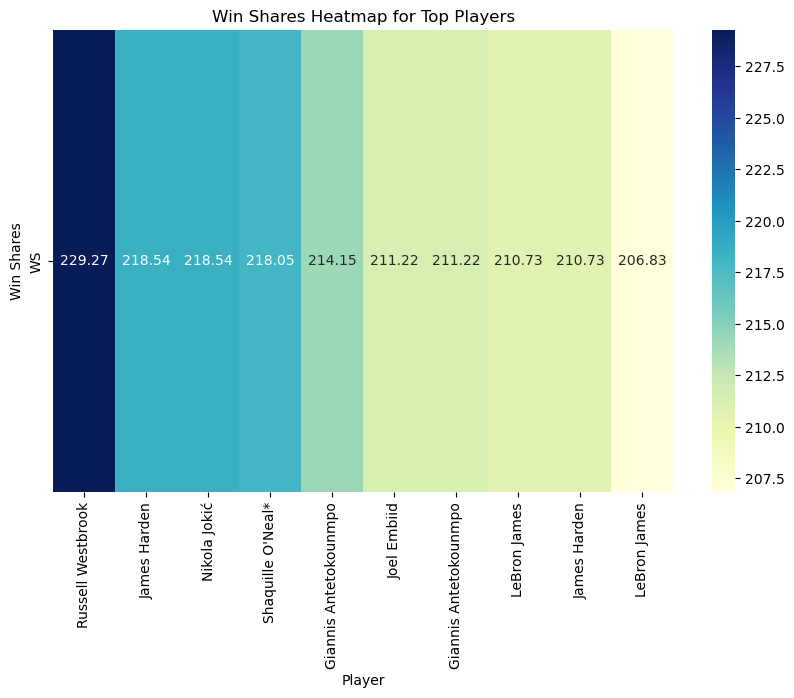

In [ ]:
# Create a matrix of player names and their Win Shares
win_shares_matrix = ps[['Player', 'WS']].sort_values(by='WS', ascending=False).head(10)  # Select top 10 players for visualization
win_shares_matrix = win_shares_matrix.set_index('Player').T

# Create a heatmap using seaborn
plt.figure(figsize=(10, 6))
sns.heatmap(win_shares_matrix, annot=True, cmap='YlGnBu', fmt=".2f")
plt.title('Win Shares Heatmap for Top Players')
plt.xlabel('Player')
plt.ylabel('Win Shares')
plt.show()

# COACHING IMPACT ANALYSIS


In [ ]:
data

,GAME_DATE_EST,GAME_ID,SEASON,HOME_TEAM_ID,HOME_TEAM_NAME,HOME_TEAM_COACH,VISITOR_TEAM_ID,VISITOR_TEAM_NAME,VISITOR_TEAM_COACH,PTS_home,...,AST_home,REB_home,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS
0,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,27.0,41.0,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0
1,2022-06-13,42100405,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,104.0,...,23.0,39.0,1610612738,94.0,0.413,0.677,0.344,18.0,47.0,1
2,2022-06-10,42100404,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,97.0,...,22.0,42.0,1610612744,107.0,0.440,0.800,0.349,20.0,55.0,0
3,2022-06-08,42100403,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,116.0,...,28.0,47.0,1610612744,100.0,0.462,0.867,0.375,22.0,31.0,1
4,2022-06-05,42100402,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,107.0,...,25.0,42.0,1610612738,88.0,0.375,0.765,0.405,24.0,43.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26075,2014-10-06,11400007,2014,1610612737,ATL,Lloyd Pierce,1610612740,NOP,Alvin Gentry,93.0,...,24.0,50.0,1610612740,87.0,0.366,0.643,0.375,17.0,43.0,1
26076,2014-10-06,11400004,2014,1610612741,CHI,Jim Boylen,1610612764,WAS,Scott Brooks,81.0,...,18.0,40.0,1610612764,85.0,0.411,0.636,0.267,17.0,47.0,0
26077,2014-10-06,11400005,2014,1610612747,LAL,Frank Vogel,1610612743,DEN,Michael Malone,98.0,...,29.0,45.0,1610612743,95.0,0.387,0.659,0.500,19.0,43.0,1
26078,2014-10-05,11400002,2014,1610612761,TOR,Nick Nurse,1610612758,SAC,Luke Walton,99.0,...,21.0,30.0,1610612758,94.0,0.469,0.725,0.385,18.0,45.0,1


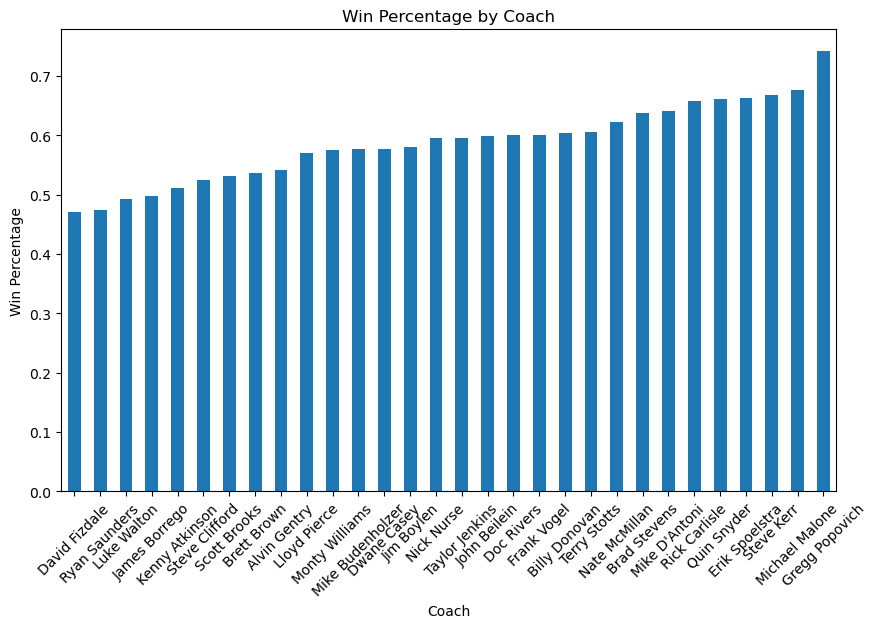

In [ ]:
coach_performance = data.groupby('HOME_TEAM_COACH')['HOME_TEAM_WINS'].mean()
plt.figure(figsize=(10, 6))
coach_performance.sort_values().plot(kind='bar')
plt.title('Win Percentage by Coach')
plt.xlabel('Coach')
plt.ylabel('Win Percentage')
plt.xticks(rotation=45)
plt.show()

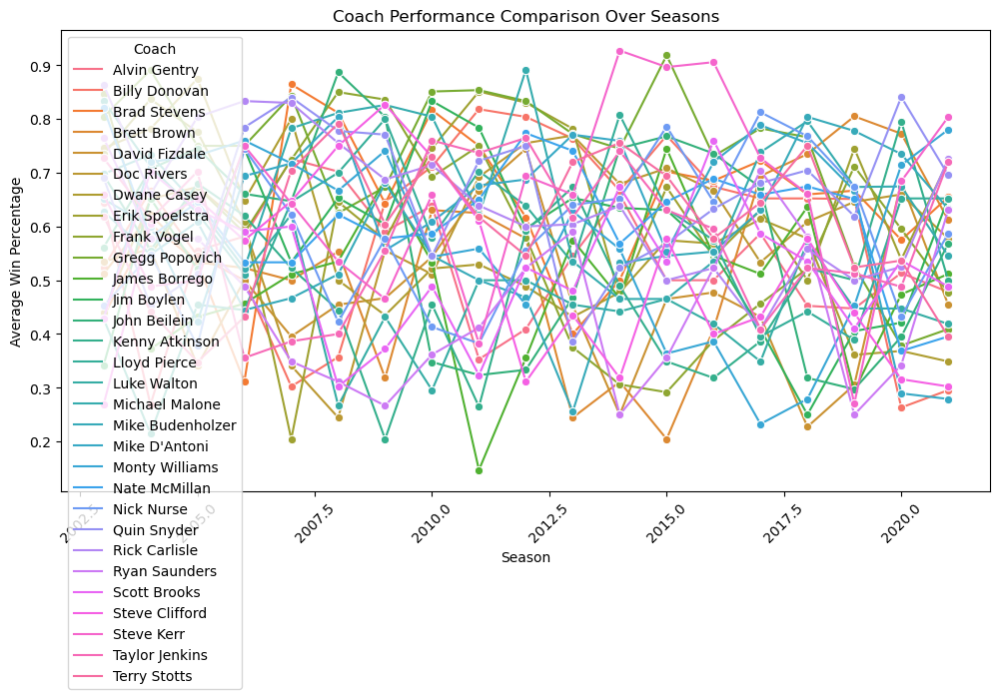

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

coaching_columns = ['SEASON', 'HOME_TEAM_COACH', 'HOME_TEAM_WINS']

coaching_data = data[coaching_columns].dropna()

# Group data by coach and season, calculate mean win percentage
coach_performance = coaching_data.groupby(['HOME_TEAM_COACH', 'SEASON'])['HOME_TEAM_WINS'].mean().reset_index()

# Visualization: Compare coach performance over seasons
plt.figure(figsize=(12, 6))
sns.lineplot(data=coach_performance, x='SEASON', y='HOME_TEAM_WINS', hue='HOME_TEAM_COACH', marker='o')
plt.title('Coach Performance Comparison Over Seasons')
plt.xlabel('Season')
plt.ylabel('Average Win Percentage')
plt.legend(title='Coach')
plt.xticks(rotation=45)
plt.show()



In [ ]:
coaching_data

,SEASON,HOME_TEAM_COACH,HOME_TEAM_WINS
0,2021,Brad Stevens,0
1,2021,Steve Kerr,1
2,2021,Brad Stevens,0
3,2021,Brad Stevens,1
4,2021,Steve Kerr,1
...,...,...,...
26075,2014,Lloyd Pierce,1
26076,2014,Jim Boylen,0
26077,2014,Frank Vogel,1
26078,2014,Nick Nurse,1


In [ ]:
coach_performance

,HOME_TEAM_COACH,SEASON,HOME_TEAM_WINS
0,Alvin Gentry,2003,0.644444
1,Alvin Gentry,2004,0.268293
2,Alvin Gentry,2005,0.555556
3,Alvin Gentry,2006,0.581395
4,Alvin Gentry,2007,0.725490
...,...,...,...
564,Terry Stotts,2017,0.644444
565,Terry Stotts,2018,0.750000
566,Terry Stotts,2019,0.523810
567,Terry Stotts,2020,0.536585


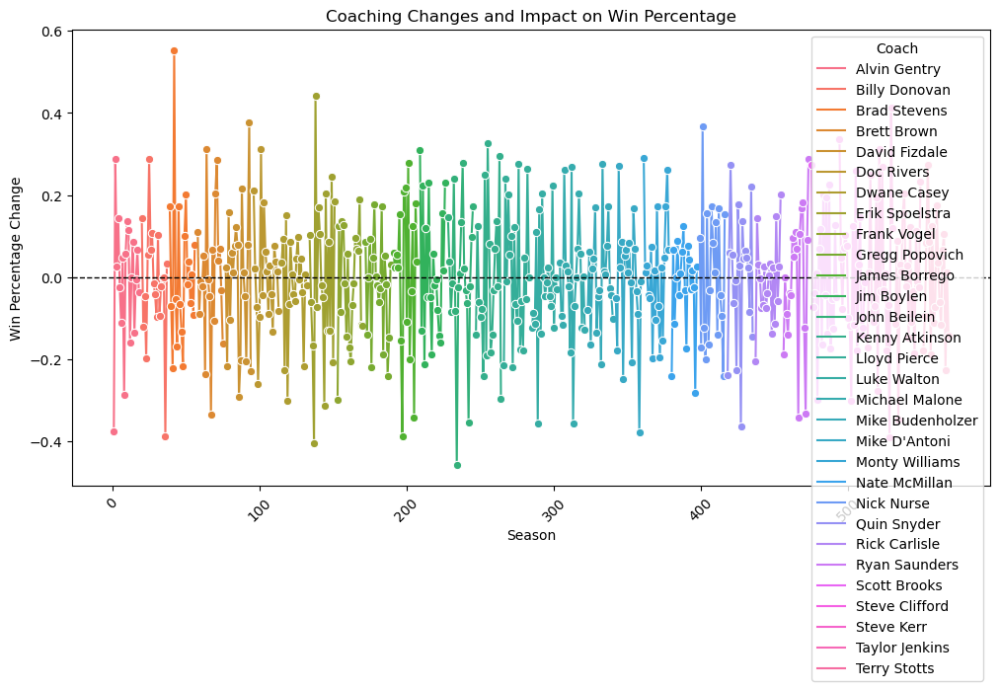

In [ ]:
# Investigate coaching changes and performance impact
coaching_changes = coach_performance.groupby('HOME_TEAM_COACH').apply(lambda x: x['HOME_TEAM_WINS'].diff()).reset_index()
coaching_changes.columns = ['HOME_TEAM_COACH', 'SEASON', 'WIN_PERCENTAGE_CHANGE']

plt.figure(figsize=(12, 6))
sns.lineplot(data=coaching_changes, x='SEASON', y='WIN_PERCENTAGE_CHANGE', hue='HOME_TEAM_COACH', marker='o')
plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
plt.title('Coaching Changes and Impact on Win Percentage')
plt.xlabel('Season')
plt.ylabel('Win Percentage Change')
plt.legend(title='Coach')
plt.xticks(rotation=45)
plt.show()

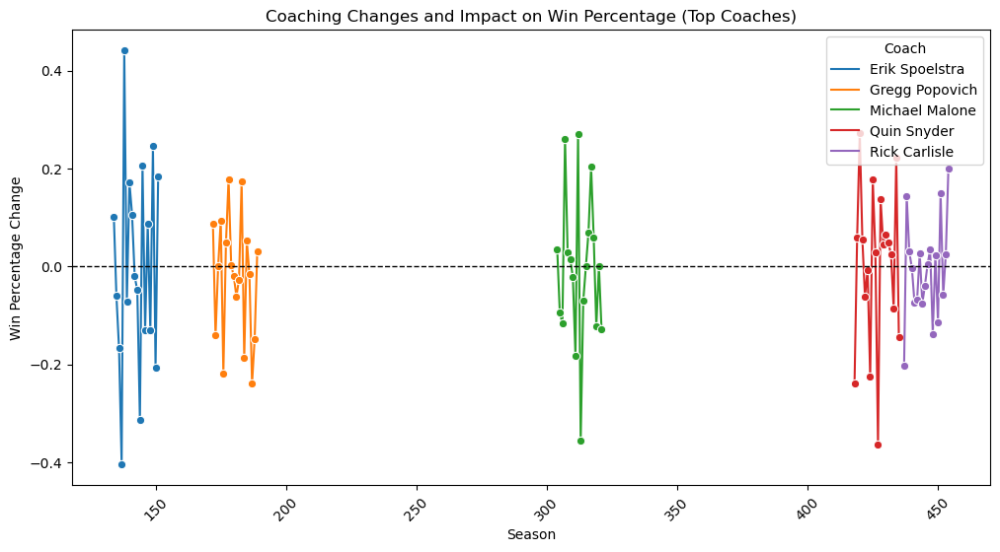

In [ ]:
# Identify top coaches based on a criterion (e.g., win percentage)
top_coaches = coach_performance.groupby('HOME_TEAM_COACH')['HOME_TEAM_WINS'].mean().nlargest(5).index.tolist()

# Filter coaching changes data for top coaches
coaching_changes_top = coaching_changes[coaching_changes['HOME_TEAM_COACH'].isin(top_coaches)]

# Plot coaching changes for top coaches
plt.figure(figsize=(12, 6))
sns.lineplot(data=coaching_changes_top, x='SEASON', y='WIN_PERCENTAGE_CHANGE', hue='HOME_TEAM_COACH', marker='o')
plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
plt.title('Coaching Changes and Impact on Win Percentage (Top Coaches)')
plt.xlabel('Season')
plt.ylabel('Win Percentage Change')
plt.legend(title='Coach')
plt.xticks(rotation=45)
plt.show()


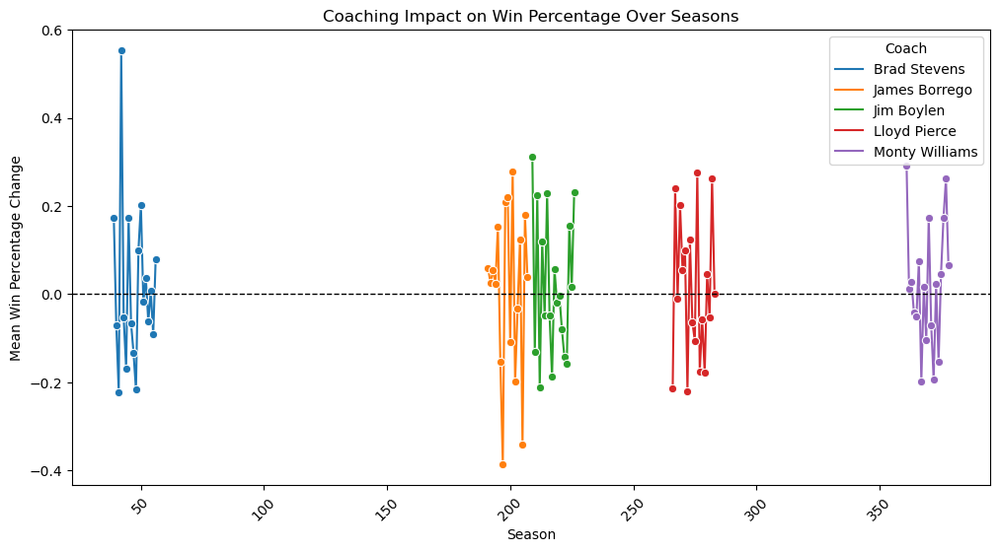

In [ ]:
# Group data by coach and season, and calculate mean win percentage change
coaching_changes_mean = coaching_changes.groupby(['HOME_TEAM_COACH', 'SEASON'])['WIN_PERCENTAGE_CHANGE'].mean().reset_index()

# Identify top coaches based on a criterion (e.g., win percentage)
top_coaches = coaching_changes_mean.groupby('HOME_TEAM_COACH')['WIN_PERCENTAGE_CHANGE'].mean().nlargest(5).index.tolist()

# Filter coaching changes data for top coaches
coaching_changes_top = coaching_changes_mean[coaching_changes_mean['HOME_TEAM_COACH'].isin(top_coaches)]

# Plot coaching changes for top coaches
plt.figure(figsize=(12, 6))
sns.lineplot(data=coaching_changes_top, x='SEASON', y='WIN_PERCENTAGE_CHANGE', hue='HOME_TEAM_COACH', marker='o')
plt.axhline(y=0, color='black', linestyle='--', linewidth=1)
plt.title('Coaching Impact on Win Percentage Over Seasons')
plt.xlabel('Season')
plt.ylabel('Mean Win Percentage Change')
plt.legend(title='Coach')
plt.xticks(rotation=45)
plt.show()


In [ ]:
coaching_changes

,HOME_TEAM_COACH,SEASON,WIN_PERCENTAGE_CHANGE
0,Alvin Gentry,0,NaN
1,Alvin Gentry,1,-0.376152
2,Alvin Gentry,2,0.287263
3,Alvin Gentry,3,0.025840
4,Alvin Gentry,4,0.144095
...,...,...,...
564,Terry Stotts,564,0.066667
565,Terry Stotts,565,0.105556
566,Terry Stotts,566,-0.226190
567,Terry Stotts,567,0.012776


# PYTHAGOREAN EXPECTATION

In [ ]:
data['PTS_allowed_home'] = data['PTS_away']
data['PTS_allowed_away'] = data['PTS_home']
data

,GAME_DATE_EST,GAME_ID,SEASON,HOME_TEAM_ID,HOME_TEAM_NAME,HOME_TEAM_COACH,VISITOR_TEAM_ID,VISITOR_TEAM_NAME,VISITOR_TEAM_COACH,PTS_home,...,TEAM_ID_away,PTS_away,FG_PCT_away,FT_PCT_away,FG3_PCT_away,AST_away,REB_away,HOME_TEAM_WINS,PTS_allowed_home,PTS_allowed_away
0,2022-06-16,42100406,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,90.0,...,1610612744,103.0,0.413,1.000,0.413,27.0,44.0,0,103.0,90.0
1,2022-06-13,42100405,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,104.0,...,1610612738,94.0,0.413,0.677,0.344,18.0,47.0,1,94.0,104.0
2,2022-06-10,42100404,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,97.0,...,1610612744,107.0,0.440,0.800,0.349,20.0,55.0,0,107.0,97.0
3,2022-06-08,42100403,2021,1610612738,BOS,Brad Stevens,1610612744,GSW,Steve Kerr,116.0,...,1610612744,100.0,0.462,0.867,0.375,22.0,31.0,1,100.0,116.0
4,2022-06-05,42100402,2021,1610612744,GSW,Steve Kerr,1610612738,BOS,Brad Stevens,107.0,...,1610612738,88.0,0.375,0.765,0.405,24.0,43.0,1,88.0,107.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26075,2014-10-06,11400007,2014,1610612737,ATL,Lloyd Pierce,1610612740,NOP,Alvin Gentry,93.0,...,1610612740,87.0,0.366,0.643,0.375,17.0,43.0,1,87.0,93.0
26076,2014-10-06,11400004,2014,1610612741,CHI,Jim Boylen,1610612764,WAS,Scott Brooks,81.0,...,1610612764,85.0,0.411,0.636,0.267,17.0,47.0,0,85.0,81.0
26077,2014-10-06,11400005,2014,1610612747,LAL,Frank Vogel,1610612743,DEN,Michael Malone,98.0,...,1610612743,95.0,0.387,0.659,0.500,19.0,43.0,1,95.0,98.0
26078,2014-10-05,11400002,2014,1610612761,TOR,Nick Nurse,1610612758,SAC,Luke Walton,99.0,...,1610612758,94.0,0.469,0.725,0.385,18.0,45.0,1,94.0,99.0


In [ ]:
reg_data=data
reg_data['gc'] = 1   #Calculate 'gc' (game count) for each team in the Regular Season
reg_team_games = reg_data.groupby('HOME_TEAM_NAME')['PTS_home', 'PTS_away', 'gc', 'HOME_TEAM_WINS'].sum()
reg_team_games

C:\Users\tanis\AppData\Local\Temp\ipykernel_14740\4039232764.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  reg_team_games = reg_data.groupby('HOME_TEAM_NAME')['PTS_home', 'PTS_away', 'gc', 'HOME_TEAM_WINS'].sum()


,PTS_home,PTS_away,gc,HOME_TEAM_WINS
HOME_TEAM_NAME,,,,
ATL,88651.0,87311.0,864,493
BKN,85988.0,86189.0,854,436
BOS,94906.0,90740.0,928,591
CHA,78144.0,78104.0,778,387
CHI,87831.0,86121.0,876,508
CLE,91305.0,89075.0,898,537
DAL,92876.0,88618.0,886,582
DEN,92656.0,87981.0,854,577
DET,87488.0,85261.0,879,507


In [ ]:
# Calculate Pythagorean Expectation and Winning Percentage
reg_team_games['pyth'] = reg_team_games['PTS_home']**2 / \
                         (reg_team_games['PTS_home']**2 + reg_team_games['PTS_away']**2)
reg_team_games['wpc'] = reg_team_games['HOME_TEAM_WINS'] / reg_team_games['gc']
reg_team_games

,PTS_home,PTS_away,gc,HOME_TEAM_WINS,pyth,wpc
HOME_TEAM_NAME,,,,,,
ATL,88651.0,87311.0,864,493,0.507615,0.570602
BKN,85988.0,86189.0,854,436,0.498833,0.510539
BOS,94906.0,90740.0,928,591,0.522429,0.636853
CHA,78144.0,78104.0,778,387,0.500256,0.497429
CHI,87831.0,86121.0,876,508,0.509829,0.579909
CLE,91305.0,89075.0,898,537,0.512361,0.597996
DAL,92876.0,88618.0,886,582,0.523448,0.656885
DEN,92656.0,87981.0,854,577,0.525863,0.675644
DET,87488.0,85261.0,879,507,0.512889,0.576792


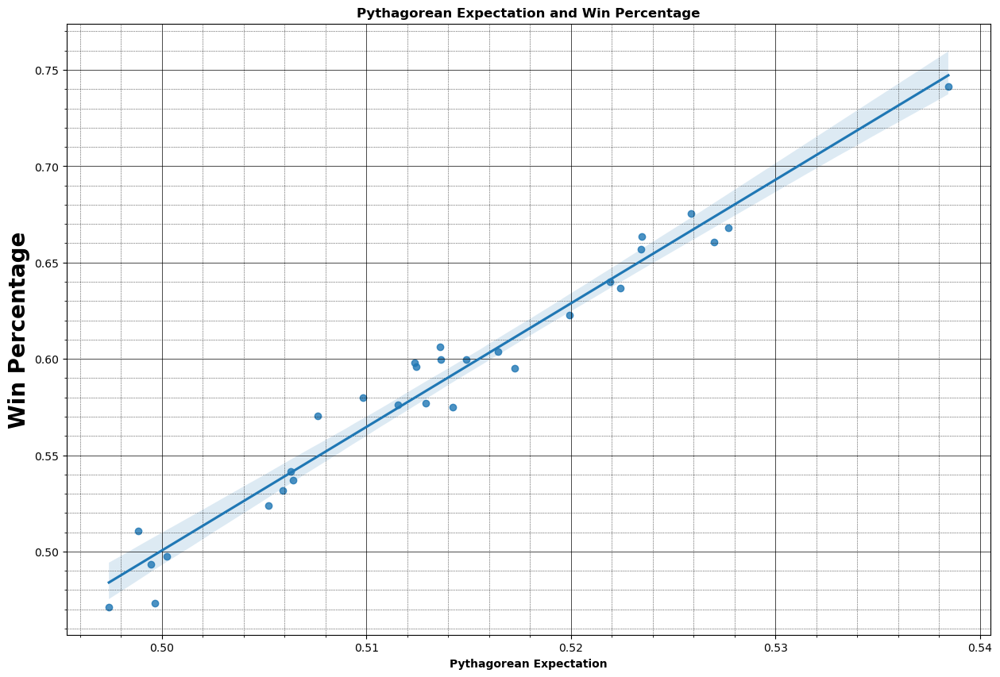

In [ ]:
plt.figure(figsize=(15,10))
ax=sns.regplot(x='pyth',y='wpc',data=reg_team_games)
plt.grid(which='major', linestyle='-', linewidth='0.5',color='black')
plt.minorticks_on()
plt.grid(which='minor', linestyle=':', linewidth='0.5',color='black')
plt.xlabel('Pythagorean Expectation',fontweight='bold')
plt.ylabel('Win Percentage',fontweight='bold',fontsize=20)
plt.title('Pythagorean Expectation and Win Percentage',fontweight='bold')
plt.show()

# ANALYZING PLAYER'S PERFORMANCE INDICATORS

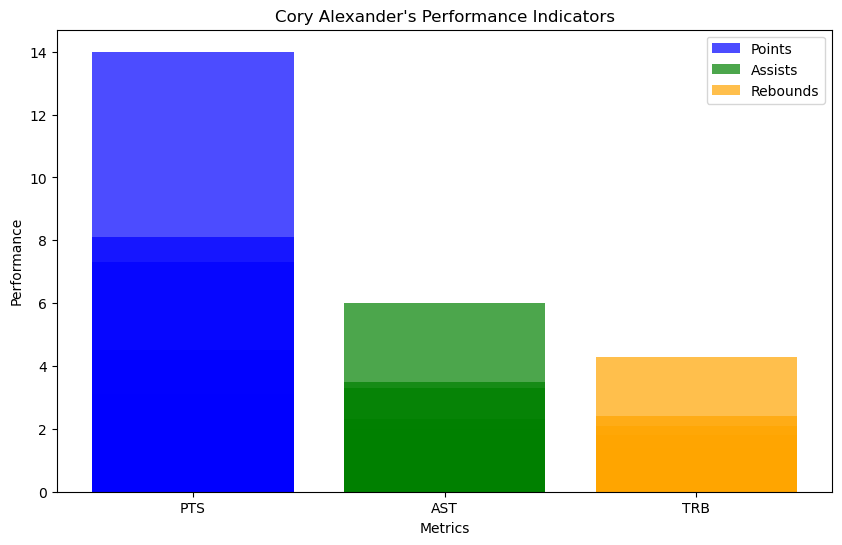

In [ ]:
# Analyze key performance indicators for players
# For example, you can calculate the average points, assists, and rebounds per game for players.
player_stats = ps.groupby('Player')[['PTS', 'AST', 'TRB']].mean()

# Analyze team performance indicators
# For example, you can calculate the average points, rebounds, assists, and field goal percentage for teams.
team_stats = ts.groupby('TEAM')[['PTS', 'REB', 'AST', 'FG%']].mean()

# Evaluate player contributions
# Merge player statistics with game data to analyze player contributions in specific games.
merged_data = pd.merge(ps, data, left_on='Player', right_on='HOME_TEAM_NAME', how='inner')
player_contributions = merged_data.groupby(['Player', 'GAME_DATE_EST'])[['PTS', 'AST', 'TRB']].sum()

# Assess team dynamics
# Merge team statistics with game data to analyze team dynamics in specific games.
merged_team_data = pd.merge(ts, data, left_on='TEAM', right_on='HOME_TEAM_NAME', how='inner')
team_dynamics = merged_team_data.groupby(['TEAM', 'GAME_DATE_EST'])[['PTS', 'REB', 'AST']].sum()

target_player = "Cory Alexander"

# Filter data for the target player
target_player_data = ps[ps['Player'] == target_player]

# Example of plotting player statistics
plt.figure(figsize=(10, 6))
plt.bar('PTS', target_player_data['PTS'].values, color='blue', alpha=0.7, label='Points')
plt.bar('AST', target_player_data['AST'].values, color='green', alpha=0.7, label='Assists')
plt.bar('TRB', target_player_data['TRB'].values, color='orange', alpha=0.7, label='Rebounds')
plt.xlabel('Metrics')
plt.ylabel('Performance')
plt.title(f"{target_player}'s Performance Indicators")
plt.legend()
plt.show()

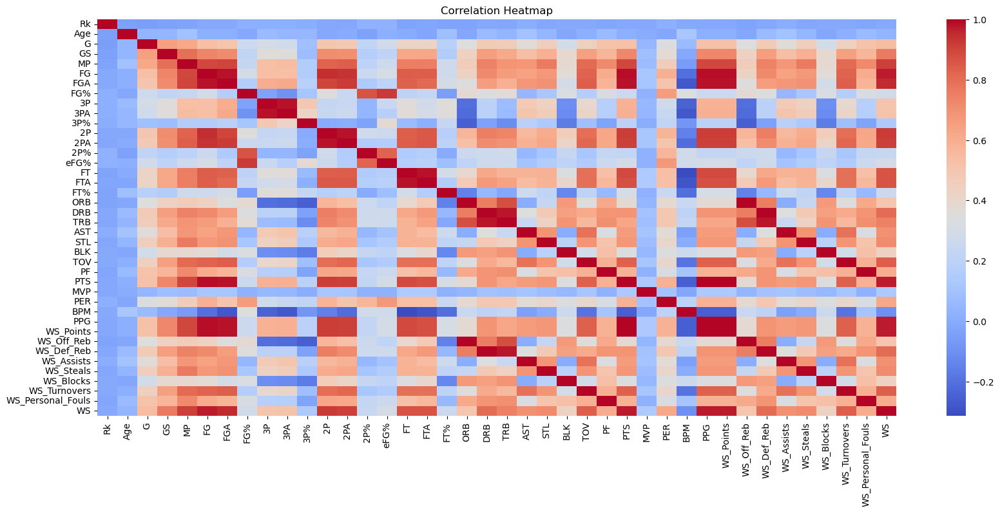

In [ ]:
# Correlation heatmap to identify potential performance indicators
corr_matrix = ps.corr()
plt.figure(figsize=(20, 8))
sns.heatmap(corr_matrix, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

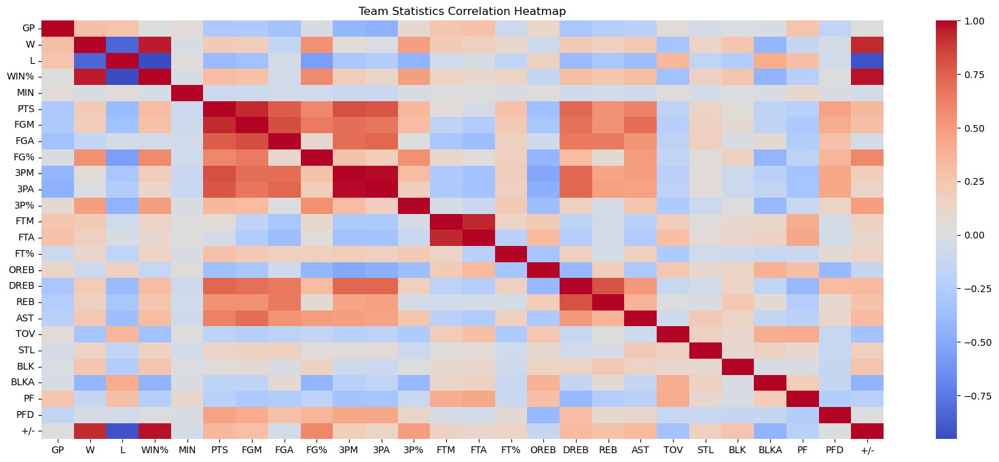

In [ ]:
team_stats_subset = ts[['GP', 'W', 'L', 'WIN%', 'MIN', 'PTS', 'FGM',
                               'FGA', 'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA',
                               'FT%', 'OREB', 'DREB', 'REB', 'AST', 'TOV', 'STL',
                               'BLK', 'BLKA', 'PF', 'PFD', '+/-']]

# Calculate the correlation matrix
corr_matrix_team = team_stats_subset.corr()

# Generate the heatmap
plt.figure(figsize=(20, 8))
sns.heatmap(corr_matrix_team, cmap='coolwarm', fmt='.2f')
plt.title('Team Statistics Correlation Heatmap')
plt.show()

The code calculates the correlation matrix using the corr() function on the 'player_stats' DataFrame. The correlation matrix is a square matrix where each cell represents the correlation coefficient between two columns (features) in the DataFrame.

The sns.heatmap() function from the seaborn library creates a color-coded heatmap using the correlation matrix. In the heatmap, each cell's color intensity corresponds to the strength of the correlation between the two variables. Positive correlations are shown in cool colors (blue shades), while negative correlations are shown in warm colors (red shades).

The annot=True argument adds the correlation values to each cell in the heatmap, making it easier to interpret the correlation coefficients. The cmap='coolwarm' argument sets the color map to a gradient from cool (blue) to warm (red) colors. The fmt='.2f' argument formats the annotation to display the correlation values with two decimal places.

The correlation heatmap is a powerful visualization tool for identifying patterns and relationships between features in the data. It helps in understanding which pairs of features are positively or negatively correlated, which can be useful for feature selection, identifying multicollinearity, and gaining insights into the relationships among different player statistics.

AttributeError: 'AxesSubplot' object has no attribute 'set_clim'

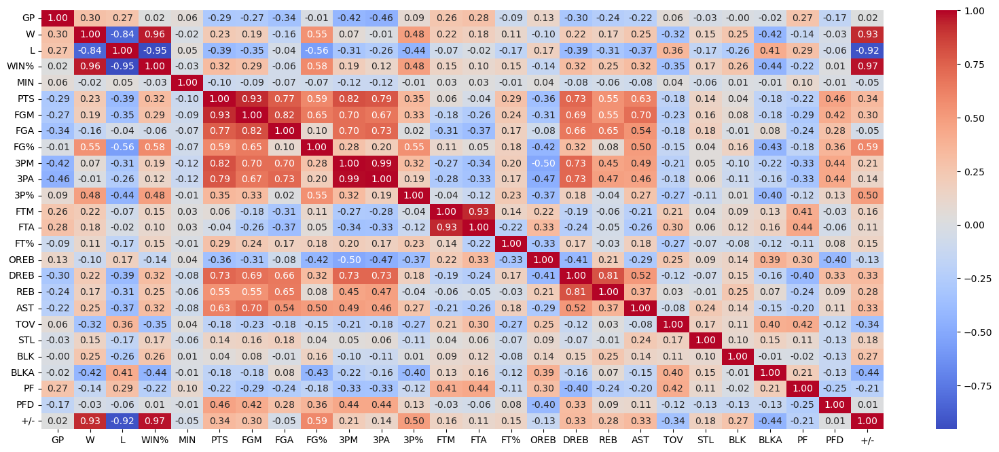

In [ ]:
plt.figure(figsize=(20, 8))
heatmap = sns.heatmap(corr_matrix_team, annot=True, cmap='coolwarm', fmt='.2f')
heatmap.set_clim(-1, 1)  # Set the color bar limits to -1 and 1
plt.title('Team Statistics Correlation Heatmap (Viridis Theme)')
plt.show()

# MATCH ANALYSIS

In [ ]:
def get_mean(group, column):
    return group[column].mean()
def get_2mean(df,first,second):
    return (df[first]/df[second]).mean()
def get_2median(df,first,second):
    return (df[first]/df[second]).median()

In [ ]:
wl_group = games.groupby(['HOME_TEAM_WINS'])

win_filt = wl_group.get_group(1)
lose_filt = wl_group.get_group(0)

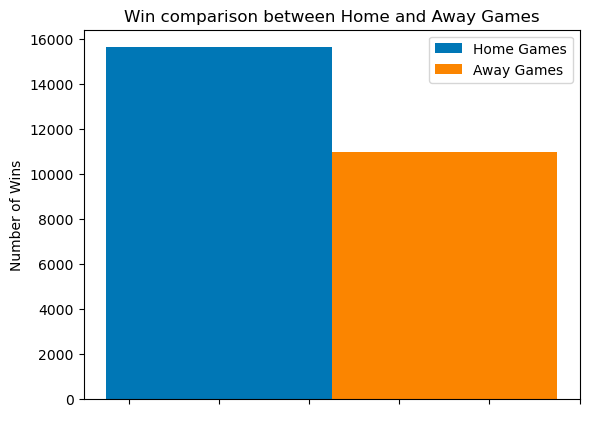

In [ ]:
x = win_filt['HOME_TEAM_WINS'].value_counts()
y = lose_filt['HOME_TEAM_WINS'].value_counts()

ti = [0.5]
hor = np.arange(len(ti))

plt.bar(ti,x,width = 0.25,color = '#0077b6',label = 'Home Games')
plt.bar(hor + 0.75,y,width = 0.25,color = '#fb8500',label = 'Away Games')

plt.ylabel('Number of Wins')
plt.xticks(color = 'w')
plt.title('Win comparison between Home and Away Games')
plt.legend()

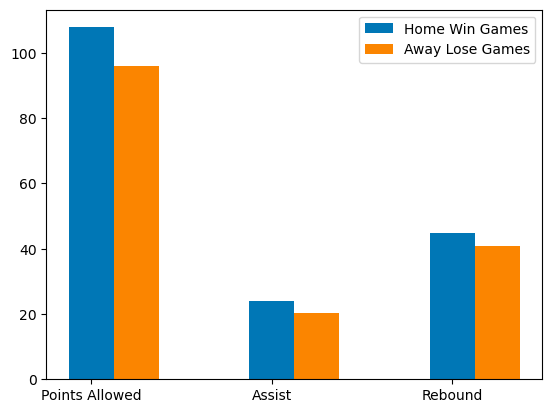

In [ ]:
x = [get_mean(win_filt,'PTS_home'),get_mean(win_filt,'AST_home'),
     get_mean(win_filt,'REB_home')]
y = [get_mean(win_filt,'PTS_away'),get_mean(win_filt,'AST_away'),
     get_mean(win_filt,'REB_away')]

ti = ['Points Allowed','Assist','Rebound']
hor = np.arange(len(ti))

plt.bar(ti,x,width = 0.25,color = '#0077b6',label = 'Home Win Games')
plt.bar(hor + 0.25,y,width = 0.25,color = '#fb8500',label = 'Away Lose Games')
plt.legend()

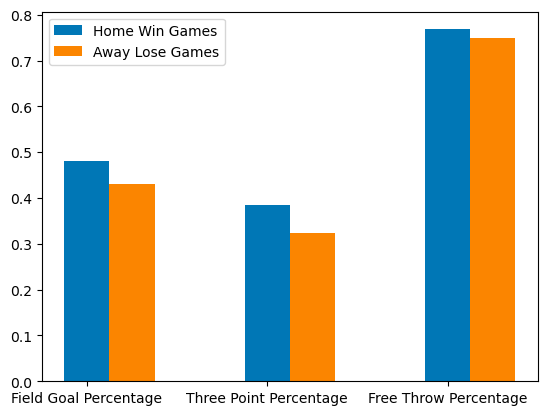

In [ ]:
x = [get_mean(win_filt,'FG_PCT_home'),get_mean(win_filt,'FG3_PCT_home'),
    get_mean(win_filt,'FT_PCT_home')]
y = [get_mean(win_filt,'FG_PCT_away'),get_mean(win_filt,'FG3_PCT_away'),
    get_mean(win_filt,'FT_PCT_away')]
ti = ['Field Goal Percentage','Three Point Percentage','Free Throw Percentage']
hor = np.arange(len(ti))

plt.bar(ti,x,width = 0.25,color = '#0077b6',label = 'Home Win Games')
plt.bar(hor + 0.25,y,width = 0.25,color = '#fb8500',label = 'Away Lose Games')
plt.legend()

Teams has a better chance of winning when they are at Home Arenas

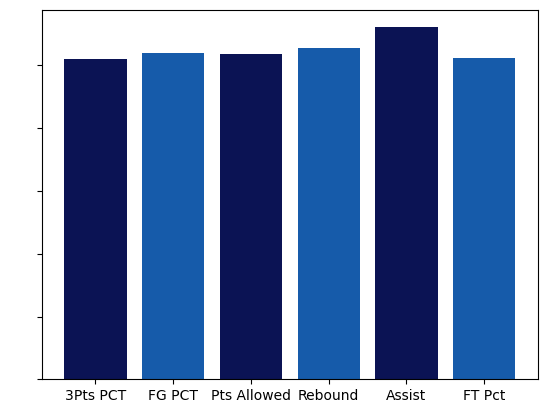

In [ ]:
fg_3pct = get_2median(games,'FG3_PCT_home','FG3_PCT_away')
fg_pct = get_2mean(games,'FG_PCT_home','FG_PCT_away')
pts_allowed = get_2mean(games,'PTS_home','PTS_away')
reb = get_2mean(games,'REB_home','REB_away')
ast = get_2mean(games,'AST_home','AST_away')
free_throw = get_2mean(games,'FT_PCT_home','FT_PCT_away')

x = [fg_3pct,fg_pct,pts_allowed,reb,ast,free_throw]
y = ['3Pts PCT','FG PCT','Pts Allowed','Rebound','Assist','FT Pct']

plt.yticks(color = 'w')
plt.bar(y,x,color = ['#0b1354','#165baa'])
plt.show()

We can notice that having more assists could contribute more to winning games. It is followed by rebounds made, points allowed and field goal percentage, 3 points percentage, and lastly, free throw percentage

In [ ]:
ast_grp = games.groupby(['AST_home','HOME_TEAM_WINS'])

mean_w_ast = get_mean(win_filt,'AST_home')
mean_l_ast = get_mean(lose_filt,'AST_home')
ptdif_w_ast = get_mean(win_filt,'PTS_home') - get_mean(win_filt,'PTS_away')

mean_w_reb = get_mean(win_filt,'REB_home')
mean_l_reb = get_mean(lose_filt,'REB_home')
ptdif_w_reb = win_filt['REB_home'] - win_filt['REB_away']
print(f' the mean amount of assists made by teams who won home games is {mean_w_ast:.0f}, and the mean amount of assists made by teams who lost home games is {mean_l_ast:.0f}')
print(f' the mean amount of assists made by teams who won home games is {mean_w_reb:.0f}, and the mean amount of assists made by teams who lost home games is {mean_l_reb:.0f}')

 the mean amount of assists made by teams who won home games is 24, and the mean amount of assists made by teams who lost home games is 21
 the mean amount of assists made by teams who won home games is 45, and the mean amount of assists made by teams who lost home games is 41


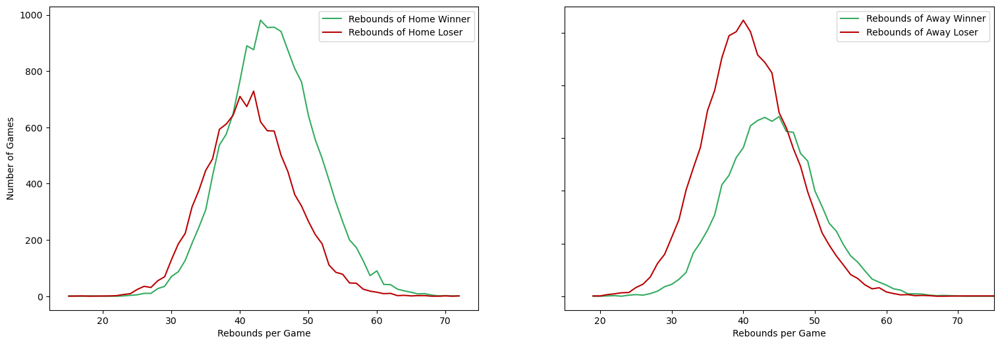

In [ ]:
reb_grp = games.groupby(['REB_home','HOME_TEAM_WINS'])
reb_table = reb_grp.size().unstack(fill_value=0)

# assigning the amount of rebounds the winner and loser has
plt.subplot(1,2,1)
plt.plot(reb_table[1], color = '#33AB5F',label = 'Rebounds of Home Winner')
plt.plot(reb_table[0], color = '#BA0001',label = 'Rebounds of Home Loser')

plt.ylabel('Number of Games')
plt.xlabel('Rebounds per Game')
plt.legend()

# compare the results from those who won and lost during home and away games
plt.subplot(1,2,2)
losereb_grp = games.groupby(['REB_away','HOME_TEAM_WINS'])
losereb_table = losereb_grp.size().unstack(fill_value=0)

plt.plot(losereb_table[0], color = '#33AB5F',label = 'Rebounds of Away Winner')
plt.plot(losereb_table[1], color = '#BA0001',label = 'Rebounds of Away Loser')

plt.yticks(c='w')
plt.xlim([15,75])
fig = plt.gcf()
fig.set_size_inches(18.5,6)
plt.xlabel('Rebounds per Game')
plt.legend()

In the first graph (on the left), a clear trend emerges, indicating that as a team's number of rebounds increases, their likelihood of winning also increases. This trend is further supported by the average number of rebounds for home-winning teams, which is 44 rebounds per game. In contrast, teams that lost their home games had an average of 41.4 rebounds per game.

Shifting our focus to the second graph (on the right), we observe that teams with fewer rebounds tend to have a higher probability of losing away games. Winning teams in away games have an average of 44 rebounds per game, while losing teams have an average of 40.7 rebounds per game.

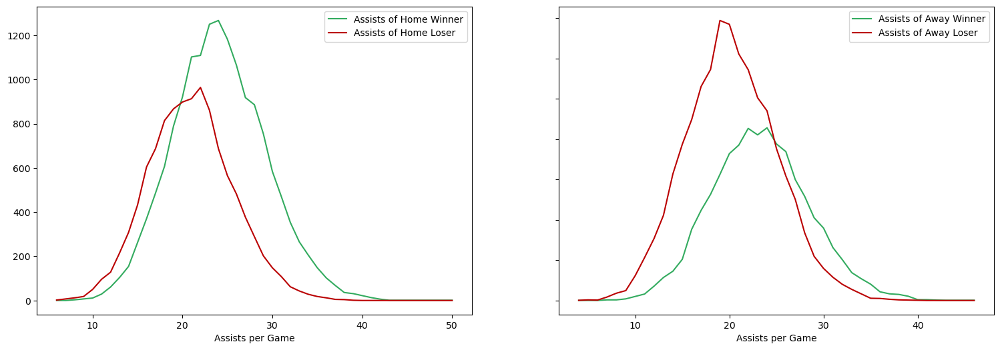

In [ ]:
ast_table= ast_grp.size().unstack(fill_value=0)

#plot it using line graph
plt.subplot(1,2,1)

plt.plot(ast_table[1], color = '#33AB5F',label = 'Assists of Home Winner')
plt.plot(ast_table[0], color = '#BA0001',label = 'Assists of Home Loser')

plt.xlabel('Assists per Game')
plt.legend()

# compare the results from those who won and lose during an away game
plt.subplot(1,2,2)
lose_ast_grp = games.groupby(['AST_away','HOME_TEAM_WINS'])
lose_ast_table = lose_ast_grp.size().unstack(fill_value=0)

plt.plot(lose_ast_table[0], color = '#33AB5F',label = 'Assists of Away Winner')
plt.plot(lose_ast_table[1], color = '#BA0001',label = 'Assists of Away Loser')

plt.yticks(c='w')
plt.xlabel('Assists per Game')
fig = plt.gcf()
fig.set_size_inches(18.5,6)
plt.legend()

In the first graph (on the left), it becomes evident that there is a positive correlation between the number of assists a team executes and their likelihood of winning. This relationship is underscored by the average assists made by teams winning home games, which stands at 24.05. Conversely, teams that lost their home games managed an average of 20.85 assists.

Applying a similar perspective to the second graph (on the right), a comparable pattern emerges. Teams triumphing in away games are prone to secure victory by accumulating more assists than their opponents. Specifically, victorious away teams tend to achieve an average of 23.22 assists, whereas teams that faced defeat in away games typically recorded an average of 20.14 assists.

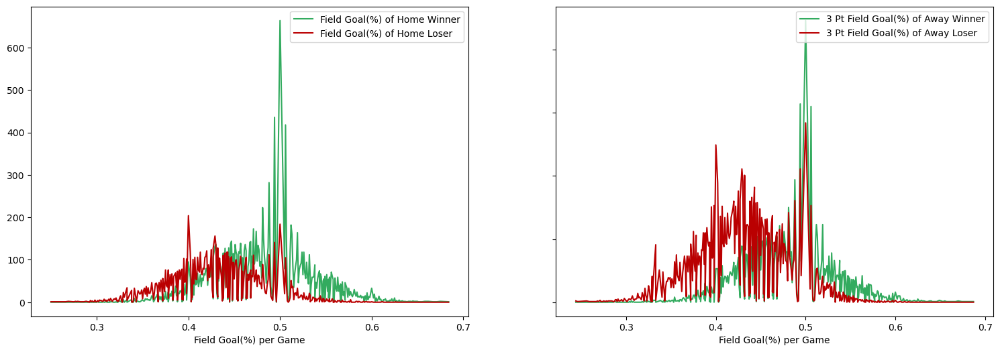

In [ ]:
fgpct_grp = games.groupby(['FG_PCT_home','HOME_TEAM_WINS'])
fgpct_table = fgpct_grp.size().unstack(fill_value=0)
fgpct_grp_lose = games.groupby(['FG_PCT_away','HOME_TEAM_WINS'])
fgpct_away_table = fgpct_grp_lose.size().unstack(fill_value=0)

fg3pct_grp= games.groupby(['FG3_PCT_home','HOME_TEAM_WINS'])
fg3pct_table = fg3pct_grp.size().unstack(fill_value=0)
fg3pct_grp_lose = games.groupby(['FG3_PCT_away','HOME_TEAM_WINS'])
fg3pct_away_table = fg3pct_grp_lose.size().unstack(fill_value=0)

plt.subplot(1,2,1)

plt.plot(fgpct_table[1], color = '#33AB5F',label = 'Field Goal(%) of Home Winner')
plt.plot(fgpct_table[0], color = '#BA0001',label = 'Field Goal(%) of Home Loser')

plt.xlabel('Field Goal(%) per Game')
plt.legend(loc = 'upper right')

plt.subplot(1,2,2)

plt.plot(fgpct_away_table[0], color = '#33AB5F',label = '3 Pt Field Goal(%) of Away Winner')
plt.plot(fgpct_away_table[1], color = '#BA0001',label = '3 Pt Field Goal(%) of Away Loser')

plt.yticks(c='w')
fig = plt.gcf()
fig.set_size_inches(18.5,6)
plt.xlabel('Field Goal(%) per Game')
plt.legend(loc = 'upper right')

In both of these graphs, we have conducted a comparison of the field goal percentages between teams that emerged victorious and those that suffered defeat in both home and away games. In the initial graph, it becomes apparent that maintaining a field goal percentage (FG%) of 50 or higher during home games would virtually assure a win. However, when competing in away games, achieving a 50% field goal percentage still suggests a favorable chance of securing victory, yet this likelihood is significantly enhanced by also achieving higher numbers of rebounds and assists.

In [ ]:
ps2.columns

Index(['Rk', 'Player', 'Pos', 'Age', 'Tm', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%',
       '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%',
       'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'Season',
       'MVP', 'PER'],
      dtype='object')

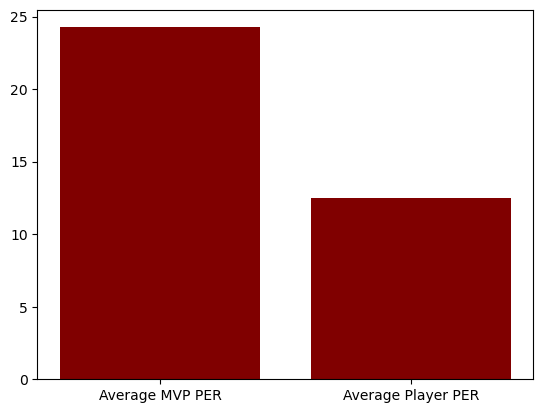

In [ ]:
mvpl=[]
c1=c2=0
nmvpl=[]
for i in range(14573):
  if ps2['MVP'][i]==True:
    mvpl.append(ps2['PER'][i])
    c1+=1
    break
  else:
    nmvpl.append(ps2['PER'][i])
    c2+=1
mvpAvg=sum(mvpl)/c1
nmvpAvg=sum(nmvpl)/c2

x=["Average MVP PER", "Average Player PER"]
y=[mvpAvg, nmvpAvg]
plt.bar(x,y, color='maroon')
plt.show()

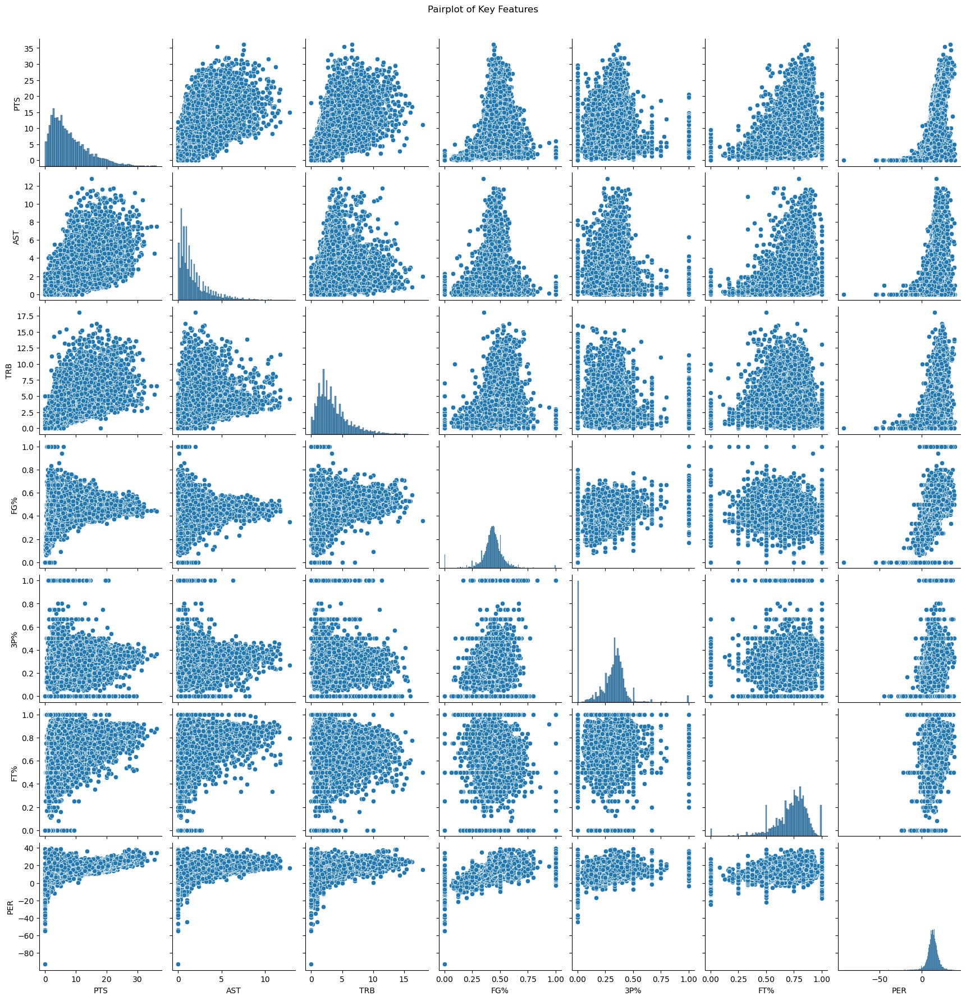

In [ ]:
sns.pairplot(ps2[['PTS', 'AST', 'TRB', 'FG%', '3P%', 'FT%', 'PER']])
plt.suptitle('Pairplot of Key Features', y=1.02)
plt.show()

# ALL SEASONS ANALYSIS

In [ ]:
AS

,Unnamed: 0,name,team,age,height,weight,college,country,draft_year,draft_round,...,avg_ast,net_rating,oreb_pct,dreb_pct,usg_pct,ts_pct,ast_pct,season,year,reb+ast
0,0,Dennis Rodman,CHI,36.0,198.12,99.790240,Southeastern Oklahoma State,USA,1986,2,...,3.1,16.1,0.186,0.323,0.100,0.479,0.113,1996-97,1996,19.2
1,1,Dwayne Schintzius,LAC,28.0,215.90,117.933920,Florida,USA,1990,1,...,0.3,12.3,0.078,0.151,0.175,0.430,0.048,1996-97,1996,1.8
2,2,Earl Cureton,TOR,39.0,205.74,95.254320,Detroit Mercy,USA,1979,3,...,0.4,-2.1,0.105,0.102,0.103,0.376,0.148,1996-97,1996,1.4
3,3,Ed O'Bannon,DAL,24.0,203.20,100.697424,UCLA,USA,1995,1,...,0.6,-8.7,0.060,0.149,0.167,0.399,0.077,1996-97,1996,2.9
4,4,Ed Pinckney,MIA,34.0,205.74,108.862080,Villanova,USA,1985,1,...,0.2,-11.2,0.109,0.179,0.127,0.611,0.040,1996-97,1996,2.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12300,12300,Markieff Morris,MIA,32.0,205.74,111.130040,Kansas,USA,2011,1,...,1.4,4.5,0.059,0.089,0.197,0.547,0.116,2021-22,2021,4.0
12301,12301,Markelle Fultz,ORL,24.0,193.04,94.800728,Washington,USA,2017,1,...,5.5,-5.3,0.010,0.116,0.265,0.517,0.448,2021-22,2021,8.2
12302,12302,Marcus Smart,BOS,28.0,193.04,99.790240,Oklahoma State,USA,2014,1,...,5.9,9.3,0.018,0.093,0.179,0.540,0.245,2021-22,2021,9.7
12303,12303,Marcus Garrett,MIA,23.0,195.58,92.986360,Kansas,USA,Undrafted,Undrafted,...,0.6,5.8,0.072,0.108,0.086,0.280,0.069,2021-22,2021,2.5


In [ ]:
ts1 = ts[['TEAM', 'W', 'SEASON']]
ts1['SEASON'] = ts1['SEASON'].apply(lambda x: int(x.split('-')[0]))
ts1

C:\Users\tanis\AppData\Local\Temp\ipykernel_14740\2583505140.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ts1['SEASON'] = ts1['SEASON'].apply(lambda x: int(x.split('-')[0]))


,TEAM,W,SEASON
0,PHX,42,2020
1,GSW,40,2020
2,MEM,37,2020
3,MIA,34,2020
4,CHI,33,2020
...,...,...,...
621,ATL,25,2000
622,VAN,23,2000
623,WAS,19,2000
624,GSW,17,2000


In [ ]:
AS.rename(columns = {'player_name':'name', 'team_abbreviation':'team', 'player_height':'height', 'player_weight':'weight',
                     'pts':'avg_pts', 'reb':'avg_reb', 'ast':'avg_ast'}, inplace = True)
AS['year'] = AS['season'].apply(lambda x: int(x.split('-')[0]))

In [ ]:
AS

,Unnamed: 0,name,team,age,height,weight,college,country,draft_year,draft_round,...,avg_ast,net_rating,oreb_pct,dreb_pct,usg_pct,ts_pct,ast_pct,season,year,reb+ast
0,0,Dennis Rodman,CHI,36.0,198.12,99.790240,Southeastern Oklahoma State,USA,1986,2,...,3.1,16.1,0.186,0.323,0.100,0.479,0.113,1996-97,1996,19.2
1,1,Dwayne Schintzius,LAC,28.0,215.90,117.933920,Florida,USA,1990,1,...,0.3,12.3,0.078,0.151,0.175,0.430,0.048,1996-97,1996,1.8
2,2,Earl Cureton,TOR,39.0,205.74,95.254320,Detroit Mercy,USA,1979,3,...,0.4,-2.1,0.105,0.102,0.103,0.376,0.148,1996-97,1996,1.4
3,3,Ed O'Bannon,DAL,24.0,203.20,100.697424,UCLA,USA,1995,1,...,0.6,-8.7,0.060,0.149,0.167,0.399,0.077,1996-97,1996,2.9
4,4,Ed Pinckney,MIA,34.0,205.74,108.862080,Villanova,USA,1985,1,...,0.2,-11.2,0.109,0.179,0.127,0.611,0.040,1996-97,1996,2.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12300,12300,Markieff Morris,MIA,32.0,205.74,111.130040,Kansas,USA,2011,1,...,1.4,4.5,0.059,0.089,0.197,0.547,0.116,2021-22,2021,4.0
12301,12301,Markelle Fultz,ORL,24.0,193.04,94.800728,Washington,USA,2017,1,...,5.5,-5.3,0.010,0.116,0.265,0.517,0.448,2021-22,2021,8.2
12302,12302,Marcus Smart,BOS,28.0,193.04,99.790240,Oklahoma State,USA,2014,1,...,5.9,9.3,0.018,0.093,0.179,0.540,0.245,2021-22,2021,9.7
12303,12303,Marcus Garrett,MIA,23.0,195.58,92.986360,Kansas,USA,Undrafted,Undrafted,...,0.6,5.8,0.072,0.108,0.086,0.280,0.069,2021-22,2021,2.5


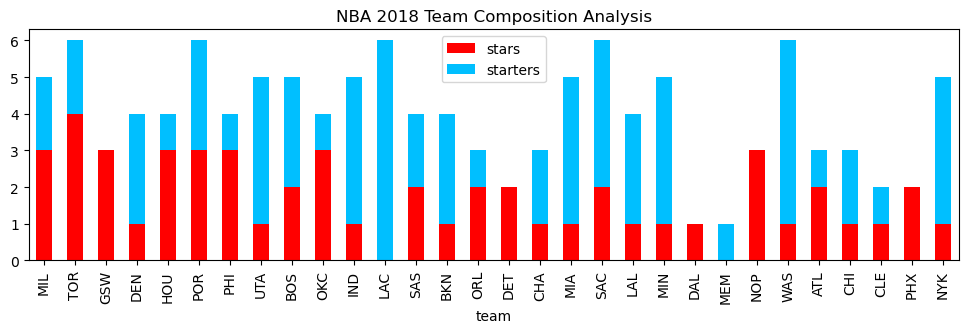

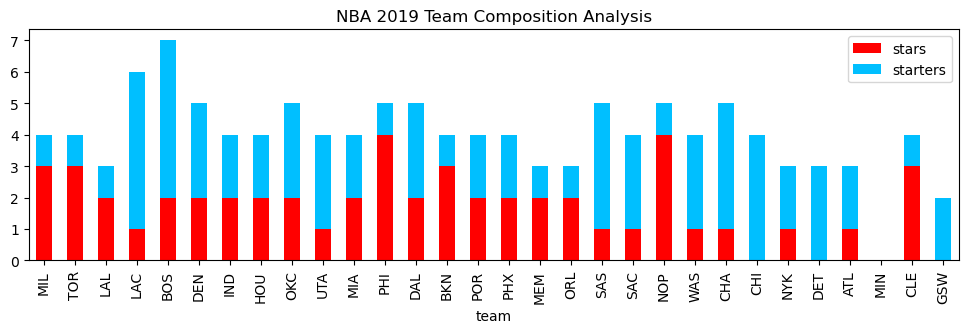

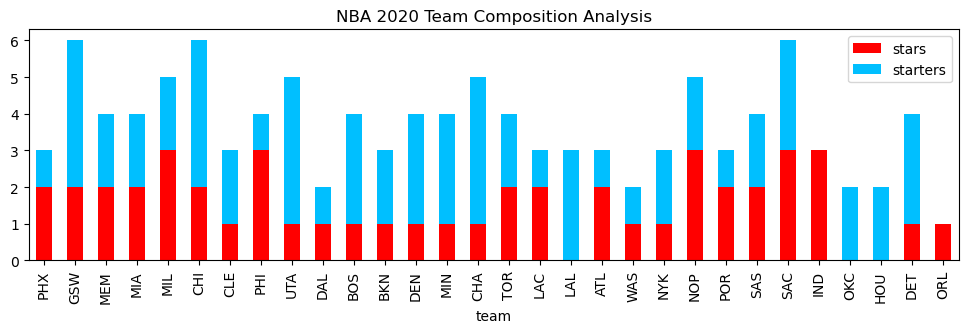

In [ ]:
AS['reb+ast'] = AS['avg_ast']+AS['avg_reb']

GamePlayThreshold = 50

for TargetYear in range(2018, 2021):
    data = AS[(AS['year']==TargetYear) & (AS['gp']>=GamePlayThreshold)]
    teams_sorted_by_wins = ts1[ts1['SEASON']==TargetYear].sort_values('W', ascending=False)['TEAM'].to_list()

    to_collect = []
    for t in teams_sorted_by_wins:
        team = data[data['team']==t]
        num_wins = ts1[(ts1['SEASON']==TargetYear) & (ts1['TEAM']==t)]['W'].values[0]
        num_stars = team[team['reb+ast']>=10].shape[0]
        num_starters = team[(7<=team['reb+ast']) & (team['reb+ast']<10)].shape[0]
        to_collect.append([t, num_stars, num_starters])
        #print(t, num_wins, num_stars, num_starters)

    new_AS = pd.DataFrame(to_collect, columns=['team', 'stars', 'starters'])
    new_AS.plot(figsize=(12, 3), kind='bar', stacked=True, x='team', color=['red', 'deepskyblue'])
    plt.title(f'NBA {TargetYear} Team Composition Analysis')